In [1]:
import os
import array
import math
import pickle
import joblib
import sys
import argparse
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from pprint import pprint
import ssl
from elasticsearch.connection import create_ssl_context
from elasticsearch import Elasticsearch
from elasticsearch import helpers
#from mymapping import mapping 
import copy
import urllib3
import warnings
import time
import json
import base64

import warnings
from time import sleep

# 2020 위협경보 데이터 불러오기(정/오탐 구분 필요)

In [2]:
# 데이터 읽어 들이기
ssl_context = create_ssl_context()
ssl_context.check_hostname = False
ssl_context.verify_mode = ssl.CERT_NONE
es = Elasticsearch(hosts=[{'host': '10.200.80.41', 'port': 9200}], scheme="https",verify_certs=False, timeout=300, ssl_context=ssl_context, http_auth=("test", "test"))
urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)
# es = Elasticsearch(hosts=[{'host':'10.0.0.138','port':'9200'}],
#      sechem='https', verify_certs = False,
#      ssl_context = ssl_context, http_auth = ('researcher', 'sjdnffl@@123'))
# urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)

# body = {
#          'size' : 100,
#          'query': {
#                  'match_all' : {}
#                  }
#          }

# res = es.search(index = 'ts_data_threat-2020', body=body)
# data = res['hits']['hits']

# print(data[0])

/usr/local/lib/python3.6/dist-packages/elasticsearch/connection/http_urllib3.py:154: UserWarning: When using `ssl_context`, all other SSL related kwargs are ignored
  "When using `ssl_context`, all other SSL related kwargs are ignored"


# 2020 위협경보 데이터 불러오기(실 데이터에서 sort 해제 및 사이즈 조절해야함)

In [211]:
body = {
         'size' : 100,
         'query': {
                 'range':{
                    'TW_COLLECT_DT':{
                        "gte":"2020-01-01T00:00:00.625+09:00",
                        "lte":"2020-01-02T00:00:00.625+09:00"
                    }
                }
                 }
#     ,
#             "sort":[{
#                 "_id":"asc"
#             }]
         }

res = es.search(index = 'ts_data_threat-2020', body=body)
data = res['hits']['hits']
total = res['hits']['total']

print(total)

threat_2020 = []
for da in data:
    att_type = da['_source']
    att_type["POL_NM"]=att_type["SCEN_INFOS"][0]["POL_NM"]
    threat_2020.append(att_type)

# tot_len = len(res["hits"]["hits"])
# nxt = res["hits"]["hits"][-1]["sort"][0]

# while(tot_len != total):
# # while(tot_len != total):
#     body = {
#         "search_after": [nxt],
#          'size' : 10000,
#          'query': {
#                  'range':{
#                     'TW_COLLECT_DT':{
#                         "gte":"2020-01-01T00:00:00.625+09:00",
#                         "lte":"2020-01-02T00:00:00.625+09:00"
#                     }
#                 }
#                  },
#             "sort":[{
#                 "_id":"asc"
#             }]
#          }
    
#     res = es.search(index = 'ts_data_threat-2020', body=body)
#     data = res['hits']['hits']
#     for da in data:
#         att_type = da['_source']
#         att_type["POL_NM"]=att_type["SCEN_INFOS"][0]["POL_NM"]
#         threat_2020.append(att_type)
        
        
#     tot_len += len(res["hits"]["hits"])
#     nxt = res["hits"]["hits"][-1]["sort"][0]
#     print(tot_len)
        
pd_threat_2020 = pd.DataFrame(threat_2020)

print(pd_threat_2020)

# pd_att_type.columns


195723
                TW_ID    TW_ID_ORI                     _datetime  \
0   20200107204231553   -451356067  2020-01-07T20:42:16.615+0900   
1   20200107204732522   1772658500  2020-01-07T20:47:17.602+0900   
2   20200107204732643  -2055489052  2020-01-07T20:47:17.618+0900   
3   20200102000044363    259952520  2020-01-02T00:00:43.754+0900   
4   20200102000044986    259952520  2020-01-02T00:00:43.752+0900   
..                ...          ...                           ...   
95  20200101235635289   -601748954  2020-01-01T23:56:34.136+0900   
96  20200101100704385   -601748954  2020-01-01T10:07:03.395+0900   
97  20200101092103575   -601748954  2020-01-01T09:21:02.985+0900   
98  20200101092547289   -601748954  2020-01-01T09:25:46.787+0900   
99  20200101093424191   -601748954  2020-01-01T09:34:23.472+0900   

                   TW_COLLECT_DT   INST_CODE  INST_NM  \
0   2020-01-01T04:13:05.670+0900  R100000001  경상북도교육청   
1   2020-01-01T12:13:55.793+0900  R100000001  경상북도교육청   
2   2

In [4]:
# print(es.indices.get_alias("*"))

{'ts_data_stat_cnt-2020': {'aliases': {}}, 'ts_cmn_code': {'aliases': {}}, 'tc_advisory_cmt': {'aliases': {}}, 'tc_service_statistics_config': {'aliases': {}}, 'ts_data_atypicallog-2019': {'aliases': {}}, 'ts_query': {'aliases': {}}, 'tc_survey-2020': {'aliases': {}}, 'data_ntm_event-202002': {'aliases': {}}, 'ts_ntm_detect_rule': {'aliases': {}}, 'data_ntm_event-202005': {'aliases': {}}, 'ts_file_storage-2020': {'aliases': {}}, 'ts_wildcard': {'aliases': {}}, 'ts_data_threat_tmp-2020': {'aliases': {}}, 'ts_accd_process': {'aliases': {}}, 'ts_data_threat_tmp-2018': {'aliases': {}}, 'ts_news': {'aliases': {}}, 'ts_exception': {'aliases': {}}, 'data_ntm_event-201911': {'aliases': {}}, 'logdata': {'aliases': {}}, 'ts_data_threat-data_mtm_event-201912': {'aliases': {}}, 'percol_dupt_mtm': {'aliases': {}}, 'ts_policy_anal': {'aliases': {}}, 'data_fe_isight-2019': {'aliases': {}}, 'ts_forecast': {'aliases': {}}, 'ts_source': {'aliases': {}}, 'searchguard': {'aliases': {}}, 'ts_search_term': 

# 위협경보 1주일 데이터 불러오기(실 데이터에서 sort 해제해야함)

In [75]:
body_week={
         'size' : 10000,
         "query": {
                "range":{
                    "TW_COLLECT_DT":{
                        "gte":"2020-08-01T00:00:00.625+09:00",
                        "lte":"2020-08-07T00:00:00.625+09:00"
                    }
                }
            }
#     ,
#     "sort":[{
#                 "_id":"asc"
#             }]
    }
            

res = es.search(index = 'ts_data_threat-2020', body=body_week)
data_week = res['hits']['hits']
total = res['hits']['total']

drule_att_type_week = []
for da in data_week:
    att_type = da['_source']
    drule_att_type_week.append(att_type)
    
# tot_len = len(res["hits"]["hits"])
# nxt = res["hits"]["hits"][-1]["sort"][0]

# while(tot_len != total):
#     body = {
#         "search_after": [nxt],
#          'size' : 10000,
#          'query': {
#                 'range':{
#                     'TW_COLLECT_DT':{
#                         'gte':'2020-08-01T00:00:00.625+09:00',
#                         'lte':'2020-08-07T00:00:00.625+09:00'
#                     }
#                 }
#             },
#             "sort":[{
#                 "_id":"asc"
#             }]
#          }
    
#     res = es.search(index = 'ts_data_threat-2020', body=body)
#     data_week = res['hits']['hits']
#     for da in data_week:
#         att_type = da['_source']
#         drule_att_type_week.append(att_type)
        
#     tot_len += len(res["hits"]["hits"])
#     nxt = res["hits"]["hits"][-1]["sort"][0]
#     print(tot_len)
        
pd_att_type_week = pd.DataFrame.from_dict(drule_att_type_week)

print(pd_att_type_week.head())

               TW_ID    TW_ID_ORI                     _datetime  \
0  20200804002431325    747930871  2020-08-04T00:24:30.555+0900   
1  20200804002431535   1503196925  2020-08-04T00:24:30.545+0900   
2  20200804002840143   1853048657  2020-08-04T00:28:39.873+0900   
3  20200804002753777  -1409623338  2020-08-04T00:27:52.088+0900   
4  20200804003731698  -1409623338  2020-08-04T00:37:30.621+0900   

                  TW_COLLECT_DT   INST_CODE   INST_NM  \
0  2020-08-04T00:23:43.000+0900  A000003150     한신대학교   
1  2020-08-04T00:23:48.000+0900  A000002584     중앙대학교   
2  2020-08-04T00:27:04.000+0900  C100000001  부산광역시교육청   
3  2020-08-04T00:26:55.000+0900  A000002584     중앙대학교   
4  2020-08-04T00:36:34.000+0900  A000002584     중앙대학교   

                                            DRULE_NM GEAR_CODE  \
0    Attack-Scan-29-01-windows_RPC_FCP.20051804ECSC#  53122000   
1       Malwr-Resource-29-01-coinminer.18033003ECSC#  53099000   
2  Attack-WebScan-29-01-subversion(entries).19072...    

# 위협경보 1달 데이터 불러오기(실 데이터에서 sort 해제해야함)

In [28]:
body_1month={
         'size' : 10000,
         'query': {
                'range':{
                    'TW_COLLECT_DT':{
                        'gte':'2020-08-01T00:00:00.625+09:00',
                        'lte':'2020-08-16T00:00:00.625+09:00'
                    }
                }
            }
#     ,
#     "sort":[{
#                 "_id":"asc"
#             }]
    }
            

res = es.search(index = 'ts_data_threat-2020', body=body_1month)
data_1month = res['hits']['hits']

total = res['hits']['total']

print(total)

drule_att_type_month = []
for da in data_1month:
    att_type = da['_source']
    drule_att_type_month.append(att_type)
    
# tot_len = len(res["hits"]["hits"])
# nxt = res["hits"]["hits"][-1]["sort"][0]

# while(tot_len != total):
#     body = {
#         "search_after": [nxt],
#          'size' : 10000,
#          'query': {
#                 'range':{
#                     'TW_COLLECT_DT':{
#                         'gte':'2020-08-01T00:00:00.625+09:00',
#                         'lte':'2020-08-16T00:00:00.625+09:00'
#                     }
#                 }
#             },
#             "sort":[{
#                 "_id":"asc"
#             }]
#          }
    
#     res = es.search(index = 'ts_data_threat-2020', body=body)
#     data_1month = res['hits']['hits']
#     for da in data_1month:
#         att_type = da['_source']
#         drule_att_type_month.append(att_type)
        
#     tot_len += len(res["hits"]["hits"])
#     nxt = res["hits"]["hits"][-1]["sort"][0]
#     print(tot_len)
        
pd_att_type_month = pd.DataFrame.from_dict(drule_att_type_month)

print(pd_att_type_month.head())


4568206
               TW_ID    TW_ID_ORI                     _datetime  \
0  20200804002431325    747930871  2020-08-04T00:24:30.555+0900   
1  20200804002431535   1503196925  2020-08-04T00:24:30.545+0900   
2  20200804002840143   1853048657  2020-08-04T00:28:39.873+0900   
3  20200804002753777  -1409623338  2020-08-04T00:27:52.088+0900   
4  20200804003731698  -1409623338  2020-08-04T00:37:30.621+0900   

                  TW_COLLECT_DT   INST_CODE   INST_NM  \
0  2020-08-04T00:23:43.000+0900  A000003150     한신대학교   
1  2020-08-04T00:23:48.000+0900  A000002584     중앙대학교   
2  2020-08-04T00:27:04.000+0900  C100000001  부산광역시교육청   
3  2020-08-04T00:26:55.000+0900  A000002584     중앙대학교   
4  2020-08-04T00:36:34.000+0900  A000002584     중앙대학교   

                                            DRULE_NM GEAR_CODE  \
0    Attack-Scan-29-01-windows_RPC_FCP.20051804ECSC#  53122000   
1       Malwr-Resource-29-01-coinminer.18033003ECSC#  53099000   
2  Attack-WebScan-29-01-subversion(entries).1907

# 위협경보 2달 데이터 불러오기(실 데이터에서 sort 해제해야함)

In [29]:
body_2months={
         'size' : 10000,
         'query': {
                'range':{
                    'TW_COLLECT_DT':{
                        'gte':'2020-08-01T00:00:00.625+09:00',
                        'lte':'2020-08-23T00:00:00.625+09:00'
                    }
                }
            }
#     ,
    
#     "sort":[{
#                 "_id":"asc"
#             }]
    }
            

res = es.search(index = 'ts_data_threat-2020', body=body_2months)
data_2months = res['hits']['hits']

total = res['hits']['total']

print(total)


drule_att_type_2months = []
for da in data_2months:
    att_type = da['_source']
    drule_att_type_2months.append(att_type)
    
# tot_len = len(res["hits"]["hits"])
# nxt = res["hits"]["hits"][-1]["sort"][0]

# while(tot_len != total):
#     body = {
#         "search_after": [nxt],
#          'size' : 10000,
#          'query':{
#                 'range':{
#                     'TW_COLLECT_DT':{
#                         'gte':'2020-08-01T00:00:00.625+09:00',
#                         'lte':'2020-08-23T00:00:00.625+09:00'
#                     }
#                 }
#             },
#             "sort":[{
#                 "_id":"asc"
#             }]
#          }
    
#     res = es.search(index = 'ts_data_threat-2020', body=body)
#     data_2months = res['hits']['hits']
#     for da in data_2months:
#         att_type = da['_source']
#         drule_att_type_2months.append(att_type)
        
#     tot_len += len(res["hits"]["hits"])
#     nxt = res["hits"]["hits"][-1]["sort"][0]
#     print(tot_len)
        
pd_att_type_2months = pd.DataFrame.from_dict(drule_att_type_2months)

print(pd_att_type_2months.head())



4568206
               TW_ID    TW_ID_ORI                     _datetime  \
0  20200804002431325    747930871  2020-08-04T00:24:30.555+0900   
1  20200804002431535   1503196925  2020-08-04T00:24:30.545+0900   
2  20200804002840143   1853048657  2020-08-04T00:28:39.873+0900   
3  20200804002753777  -1409623338  2020-08-04T00:27:52.088+0900   
4  20200804003731698  -1409623338  2020-08-04T00:37:30.621+0900   

                  TW_COLLECT_DT   INST_CODE   INST_NM  \
0  2020-08-04T00:23:43.000+0900  A000003150     한신대학교   
1  2020-08-04T00:23:48.000+0900  A000002584     중앙대학교   
2  2020-08-04T00:27:04.000+0900  C100000001  부산광역시교육청   
3  2020-08-04T00:26:55.000+0900  A000002584     중앙대학교   
4  2020-08-04T00:36:34.000+0900  A000002584     중앙대학교   

                                            DRULE_NM GEAR_CODE  \
0    Attack-Scan-29-01-windows_RPC_FCP.20051804ECSC#  53122000   
1       Malwr-Resource-29-01-coinminer.18033003ECSC#  53099000   
2  Attack-WebScan-29-01-subversion(entries).1907

# 위협경보 3달 데이터 불러오기(실 데이터에서 sort 해제해야함)

In [30]:
body_3months={
         'size' : 10000,
         'query': {
                'range':{
                    'TW_COLLECT_DT':{
                        'gte':'2020-08-01T00:00:00.625+09:00',
                        'lte':'2020-08-30T00:00:00.625+09:00'
                    }
                }
            }
#     ,
#      "sort":[{
#                 "_id":"asc"
#             }]
    }
            

res = es.search(index = 'ts_data_threat-2020', body=body_3months)
data_3months = res['hits']['hits']

total = res['hits']['total']

print(total)

drule_att_type_3months = []
for da in data_3months:
    att_type = da['_source']
    drule_att_type_3months.append(att_type)
    
# tot_len = len(res["hits"]["hits"])
# nxt = res["hits"]["hits"][-1]["sort"][0]

# while(tot_len != total):
#     body = {
#         "search_after": [nxt],
#          'size' : 10000,
#          'query': {
#                 'range':{
#                     'TW_COLLECT_DT':{
#                         'gte':'2020-08-01T00:00:00.625+09:00',
#                         'lte':'2020-08-30T00:00:00.625+09:00'
#                     }
#                 }
#             },
#             "sort":[{
#                 "_id":"asc"
#             }]
#          }
    
#     res = es.search(index = 'ts_data_threat-2020', body=body)
#     data_3months = res['hits']['hits']
#     for da in data_3months:
#         att_type = da['_source']
#         drule_att_type_3months.append(att_type)
        
#     tot_len += len(res["hits"]["hits"])
#     nxt = res["hits"]["hits"][-1]["sort"][0]
#     print(tot_len)
        
pd_att_type_3months = pd.DataFrame.from_dict(drule_att_type_3months)

print(pd_att_type_3months.head())



4568206
               TW_ID    TW_ID_ORI                     _datetime  \
0  20200804002431325    747930871  2020-08-04T00:24:30.555+0900   
1  20200804002431535   1503196925  2020-08-04T00:24:30.545+0900   
2  20200804002840143   1853048657  2020-08-04T00:28:39.873+0900   
3  20200804002753777  -1409623338  2020-08-04T00:27:52.088+0900   
4  20200804003731698  -1409623338  2020-08-04T00:37:30.621+0900   

                  TW_COLLECT_DT   INST_CODE   INST_NM  \
0  2020-08-04T00:23:43.000+0900  A000003150     한신대학교   
1  2020-08-04T00:23:48.000+0900  A000002584     중앙대학교   
2  2020-08-04T00:27:04.000+0900  C100000001  부산광역시교육청   
3  2020-08-04T00:26:55.000+0900  A000002584     중앙대학교   
4  2020-08-04T00:36:34.000+0900  A000002584     중앙대학교   

                                            DRULE_NM GEAR_CODE  \
0    Attack-Scan-29-01-windows_RPC_FCP.20051804ECSC#  53122000   
1       Malwr-Resource-29-01-coinminer.18033003ECSC#  53099000   
2  Attack-WebScan-29-01-subversion(entries).1907

In [31]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

In [32]:
src_data = []
for da in data_week:
        src = da["_source"]
        src_data.append(src)

pd_data_week = pd.DataFrame.from_dict(src_data)
print(pd_data_week)

                  TW_ID    TW_ID_ORI                     _datetime  \
0     20200804002431325    747930871  2020-08-04T00:24:30.555+0900   
1     20200804002431535   1503196925  2020-08-04T00:24:30.545+0900   
2     20200804002840143   1853048657  2020-08-04T00:28:39.873+0900   
3     20200804002753777  -1409623338  2020-08-04T00:27:52.088+0900   
4     20200804003731698  -1409623338  2020-08-04T00:37:30.621+0900   
...                 ...          ...                           ...   
9995  20200802152943890   -319937009  2020-08-02T15:29:43.152+0900   
9996  20200802041641393   -319937009  2020-08-02T04:16:37.142+0900   
9997  20200802041641946   -319937009  2020-08-02T04:16:37.141+0900   
9998  20200802080140673   -319937009  2020-08-02T08:01:37.742+0900   
9999  20200802080341610   -319937009  2020-08-02T08:03:37.498+0900   

                     TW_COLLECT_DT   INST_CODE   INST_NM  \
0     2020-08-04T00:23:43.000+0900  A000003150     한신대학교   
1     2020-08-04T00:23:48.000+0900  A00

In [33]:
pd_data_week.columns

Index(['TW_ID', 'TW_ID_ORI', '_datetime', 'TW_COLLECT_DT', 'INST_CODE',
       'INST_NM', 'DRULE_NM', 'GEAR_CODE', 'DRULE_ATT_TYPE_CODE1', 'TW_ATT_IP',
       'TW_ATT_PORT', 'TW_ATT_GEOLOCATION', 'TW_ATT_CT_CODE', 'TW_DMG_IP',
       'TW_DMG_PORT', 'TW_DMG_GEOLOCATION', 'TW_DMG_CT_CODE', 'TW_PROTO_CODE',
       'TW_PROTO_NM', 'GEAR_TYPE', 'TW_PATTERN_STR', 'TW_DETECT_CNT', 'RISK',
       'RISK_V2', 'POL_IS_PRESSING', 'SCEN_INFOS', 'TW_STATE', 'POL_HIT_RATE2',
       'TW_CTR_GUARD_NM', 'TW_CTR_GUARD_ID', 'TW_ANAL_WRITER_ID', 'TW_ANAL_DT',
       'TW_ANAL_WRITER_NM', 'TW_ANAL_INFO', 'TW_CTR_GURAD_NM',
       'TW_MALIG_FILE_NM', 'MF_FX_BASE'],
      dtype='object')

# 폰트 확인

In [ ]:
# import matplotlib.pyplot as plt 
# %matplotlib inline 
# import seaborn as sns 
# sns.set()

# from matplotlib import font_manager,rc
# path='/usr/local/lib/python3.6/dist-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSerif-BoldItalic.ttf'
# fontprop=font_manager.FontProperties(fname=path, size=18)

In [34]:
import matplotlib
[f.fname for f in matplotlib.font_manager.fontManager.ttflist]

import seaborn as sns


# 위협경보발생 기관에 대한 기간별 bar plot(상위 30개)

충북대학교       5651
부경대학교        762
위덕대학교        536
중앙대학교        507
울산대학교        420
서울특별시교육청     266
단국대학교        247
동명대학교        160
충청남도교육청      156
오산대학교        123
장안대학교        114
인천광역시교육청     106
신안산대학교        82
한신대학교         73
목포대학교         64
남부대학교         62
원광대학교         51
서울여자대학교       50
서울대학교         43
계원예술대학교       41
안산대학교         37
한림대학교         26
서울대학교병원       24
광운대학교         22
송호대학교         20
인덕대학교         19
충남대학교         13
배재대학교         13
군산대학교         13
세한대학교         13
Name: INST_NM, dtype: int64
충북대학교       5651
부경대학교        762
위덕대학교        536
중앙대학교        507
울산대학교        420
서울특별시교육청     266
단국대학교        247
동명대학교        160
충청남도교육청      156
오산대학교        123
장안대학교        114
인천광역시교육청     106
신안산대학교        82
한신대학교         73
목포대학교         64
남부대학교         62
원광대학교         51
서울여자대학교       50
서울대학교         43
계원예술대학교       41
안산대학교         37
한림대학교         26
서울대학교병원       24
광운대학교         22
송호대학교         20
인덕대학교         19
충남대학교         13
배재대

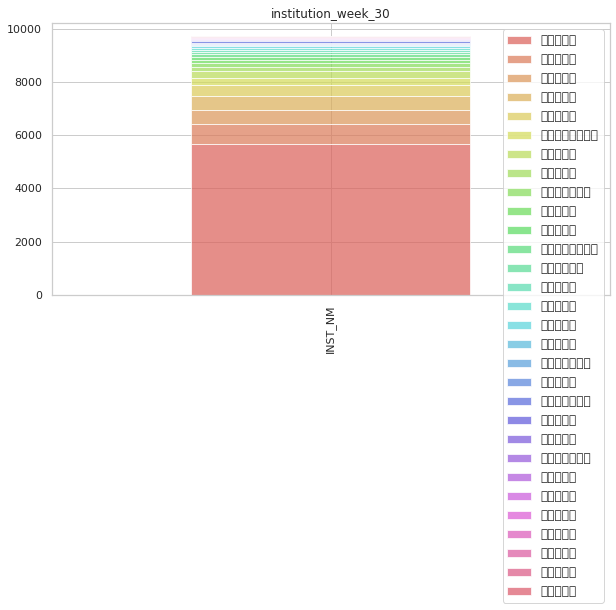

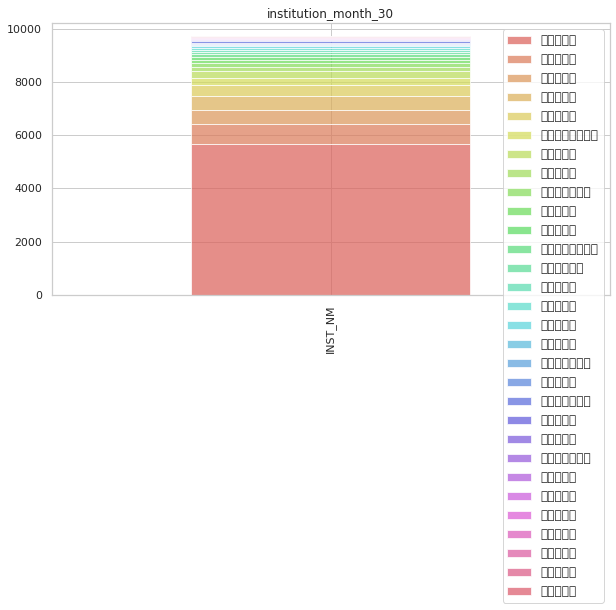

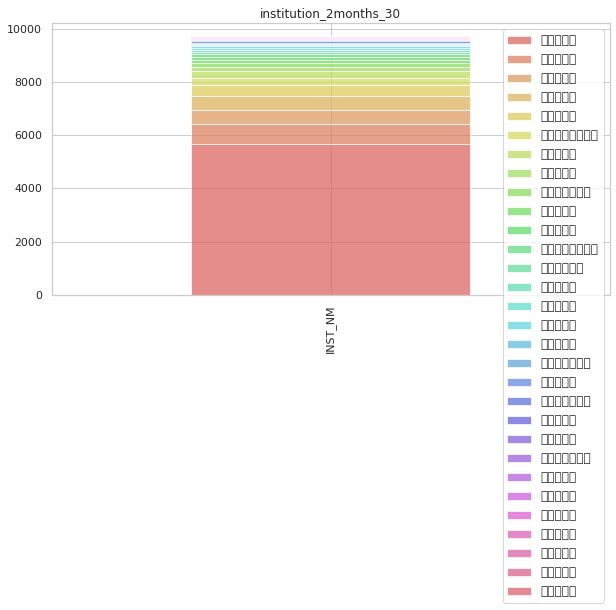

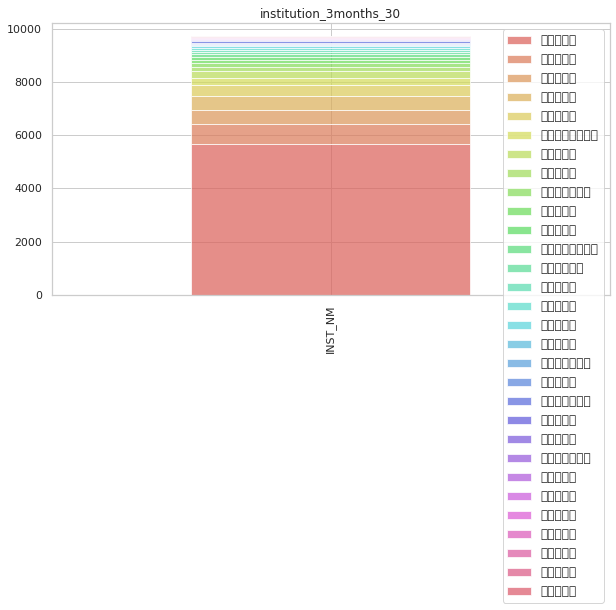

In [272]:
## 기간별(1주일,1달,2달,3달)로 어떤 위협경보발생기관이 위협경보모니터링(ts_data_threat-2020)에서 많이 발생했는지를 보여줌 

#1. 위협경보 1주일 데이터에서 기관명을 가져온 다음 내림차순으로 개수를 셈
institution_week=pd_att_type_week['INST_NM'].value_counts()
#2. 1에서 상위 30개만 가져옴
institution_week_30=institution_week[:30]
#3. 2를 데이터프레임으로 변경
df_week=pd.DataFrame([institution_week_30])
#4. 그래프 x값에 기관명을 부여하기위한 설정
df_week.index = ['INST_NM']
colors=sns.color_palette('hls', len(institution_week_30))
#5. 바 그래프로 나타내기위한 설정
df_week.plot(kind='bar',stacked=True, figsize=(10,5), color=colors, alpha=0.7)
#6. 바 그래프의 이름 설정
plt.title('institution_week_30')
#7. 범례 설정
plt.legend(fontsize='12')
#8. 상위 기관 30개 이름 보여줌
print(df_week.loc['INST_NM'])

institution_month=pd_att_type_month['INST_NM'].value_counts()
institution_month_30=institution_month[:30]
df_month=pd.DataFrame([institution_month_30])
df_month.index = ['INST_NM']
df_month.plot(kind='bar',stacked=True, figsize=(10,5), color=colors, alpha=0.7)
plt.title('institution_month_30')
plt.legend(fontsize='12')
print(df_month.loc['INST_NM'])

institution_2months=pd_att_type_2months['INST_NM'].value_counts()
institution_2months_30=institution_2months[:30]
df_2months=pd.DataFrame([institution_2months_30])
df_2months.index = ['INST_NM']
df_2months.plot(kind='bar',stacked=True, figsize=(10,5), color=colors, alpha=0.7)
plt.title('institution_2months_30')
plt.legend(fontsize='12')
print(df_2months.loc['INST_NM'])

institution_3months=pd_att_type_3months['INST_NM'].value_counts()
institution_3months_30=institution_3months[:30]
df_3months=pd.DataFrame([institution_3months_30])
df_3months.index = ['INST_NM']
df_3months.plot(kind='bar',stacked=True, figsize=(10,5), color=colors, alpha=0.7)
plt.title('institution_3months_30')
plt.legend(fontsize='12')
print(df_3months.loc['INST_NM'])

In [ ]:
institution.count

# 위협공격 IP에 대한 기간별 pie plot(상위 10개)

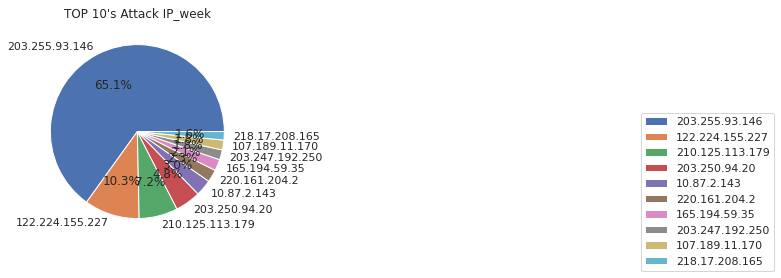

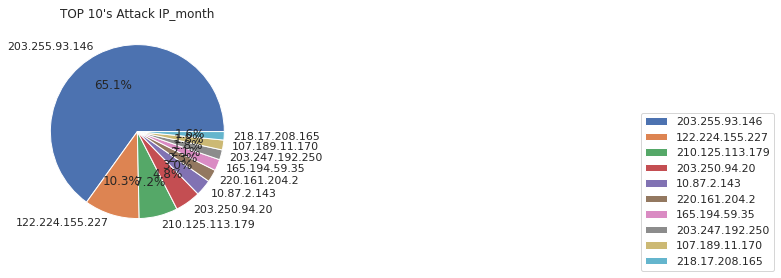

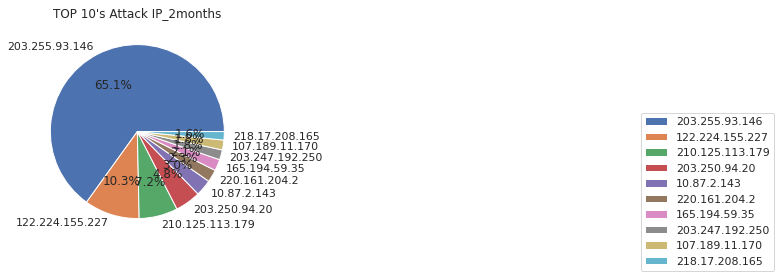

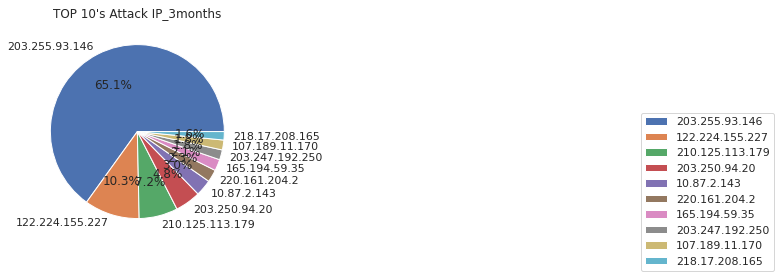

In [227]:
## 기간별(1주일,1달,2달,3달)로 어떤 위협공격 IP가 위협경보모니터링(ts_data_threat-2020)에서 많이 발생했는지를 보여줌

#1. 위협경보 1주일 데이터에서 위협공격 IP명을 가져온 다음 내림차순으로 개수를 셈
IP_week=pd_att_type_week['TW_ATT_IP'].value_counts()
#2. 1에서 상위 10개만 가져옴
IP_week_10=IP_week[:10]
#3. 그래프에 상위 10개의 위협공격 IP명을 부여하기위한 설정
feature_index_IP_week_10=IP_week_10.index
#4. 파이 그래프로 나타내기위한 설정
plt.plot(aspect='auto', figsize=(10,7), legend=True, explode=(0.1,0,0,0))
#5. 3에 소수점 1자리까지 나타내기위한 설정
plt.pie(IP_week_10, labels=feature_index_IP_week_10, autopct='%1.1f%%')
#6. 3에 해당하는 값에 각각 백분율을 나타내기위한 설정
percentage=100.*IP_week_10/IP_week_10.sum()
#7. 오른쪽 하단에 범례 설정
plt.legend(feature_index_IP_week_10, bbox_to_anchor=(2,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
#8. 그래프의 이름 설정
plt.title('TOP 10\'s Attack IP_week')
plt.show()


IP_month=pd_att_type_month['TW_ATT_IP'].value_counts()
IP_month_10=IP_month[:10]
feature_index_IP_month_10=IP_month_10.index
plt.plot(aspect='auto', figsize=(10,7), legend=True, explode=(0.1,0,0,0))
plt.pie(IP_month_10, labels=feature_index_IP_month_10, autopct='%1.1f%%')
percentage=100.*IP_month_10/IP_month_10.sum()
plt.legend(feature_index_IP_month_10, bbox_to_anchor=(2,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
plt.title('TOP 10\'s Attack IP_month')
plt.show()

IP_2months=pd_att_type_2months['TW_ATT_IP'].value_counts()
IP_2months_10=IP_2months[:10]
feature_index_IP_2months=IP_2months_10.index
plt.plot(aspect='auto', figsize=(10,7), legend=True, explode=(0.1,0,0,0))
plt.pie(IP_2months_10, labels=feature_index_IP_2months, autopct='%1.1f%%')
percentage=100.*IP_2months_10/IP_2months_10.sum()
plt.legend(feature_index_IP_2months, bbox_to_anchor=(2,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
plt.title('TOP 10\'s Attack IP_2months')
plt.show()

IP_3months=pd_att_type_3months['TW_ATT_IP'].value_counts()
IP_3months_10=IP_3months[:10]
feature_index_IP_3months=IP_3months_10.index
plt.plot(aspect='auto', figsize=(10,7), legend=True, explode=(0.1,0,0,0))
plt.pie(IP_3months_10, labels=feature_index_IP_3months, autopct='%1.1f%%')
percentage=100.*IP_3months_10/IP_3months_10.sum()
plt.legend(feature_index_IP_3months, bbox_to_anchor=(2,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
plt.title('TOP 10\'s Attack IP_3months')
plt.show()


# 장비에 대한 기간별 bar plot(상위 50개)

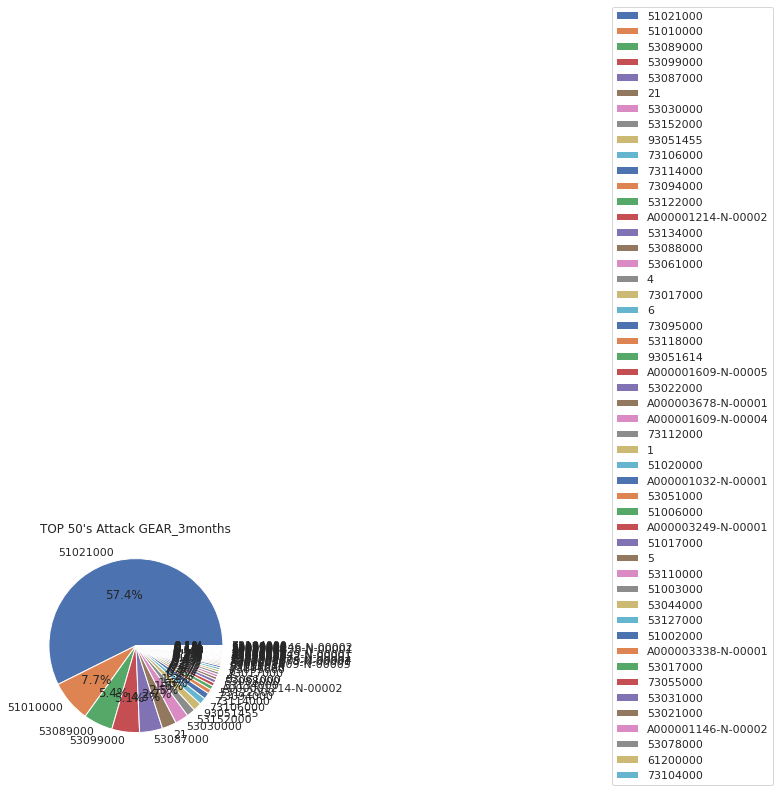

In [279]:
## 기간별(1주일,1달,2달,3달)로 어떤 장비가 위협경보모니터링(ts_data_threat-2020)에서 많이 발생했는지를 보여줌

#1. 위협경보 1주일 데이터에서 장비코드를 가져온 다음 내림차순으로 개수를 셈
GEAR_week=pd_att_type_week['GEAR_CODE'].value_counts()
#2. 1에서 상위 50개만 가져옴
GEAR_week_100=GEAR_week[:50]
#3. 그래프에 상위 50개의 위협공격 IP명을 부여하기위한 설정
feature_index_GEAR_week=GEAR_week_100.index
#4. 파이 그래프로 나타내기위한 설정
plt.plot(aspect='auto', figsize=(10,7), legend=True, explode=(0.1,0,0,0))
#5. 3에 소수점 1자리까지 나타내기위한 설정
plt.pie(GEAR_week_100, labels=feature_index_GEAR_week, autopct='%1.1f%%')
#6. 3에 해당하는 값에 각각 백분율을 나타내기위한 설정
percentage=100.*GEAR_week_100/GEAR_week_100.sum()
#7. 오른쪽 하단에 범례 설정
plt.legend(feature_index_GEAR_week, bbox_to_anchor=(2,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
#8. 그래프의 이름 설정
plt.title('TOP 50\'s Attack GEAR_week')
plt.show()


GEAR_month=pd_att_type_month['GEAR_CODE'].value_counts()
GEAR_month_100=GEAR_month[:50]
feature_index_GEAR_month=GEAR_month_100.index
plt.plot(aspect='auto', figsize=(10,7), legend=True, explode=(0.1,0,0,0))
plt.pie(GEAR_month_100, labels=feature_index_GEAR_month, autopct='%1.1f%%')
percentage=100.*GEAR_month_100/GEAR_month_100.sum()
plt.legend(feature_index_GEAR_month, bbox_to_anchor=(2,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
plt.title('TOP 50\'s Attack GEAR_month')
plt.show()


GEAR_2months=pd_att_type_2months['GEAR_CODE'].value_counts()
GEAR_2months_100=GEAR_2months[:50]
feature_index_GEAR_2months=GEAR_2months_100.index
plt.plot(aspect='auto', figsize=(10,7), legend=True, explode=(0.1,0,0,0))
plt.pie(GEAR_2months_100, labels=feature_index_GEAR_2months, autopct='%1.1f%%')
percentage=100.*GEAR_2months_100/GEAR_2months_100.sum()
plt.legend(feature_index_GEAR_2months, bbox_to_anchor=(2,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
plt.title('TOP 50\'s Attack GEAR_2months')
plt.show()



GEAR_3months=pd_att_type_3months['GEAR_CODE'].value_counts()
GEAR_3months_100=GEAR_3months[:50]
feature_index_GEAR_3months=GEAR_3months_100.index
plt.plot(aspect='auto', figsize=(10,7), legend=True, explode=(0.1,0,0,0))
plt.pie(GEAR_3months_100, labels=feature_index_GEAR_3months, autopct='%1.1f%%')
percentage=100.*GEAR_3months_100/GEAR_3months_100.sum()
plt.legend(feature_index_GEAR_3months, bbox_to_anchor=(2,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
plt.title('TOP 50\'s Attack GEAR_3months')
plt.show()

# 공격 국가에 대한 기간별 bar plot(상위 100개)

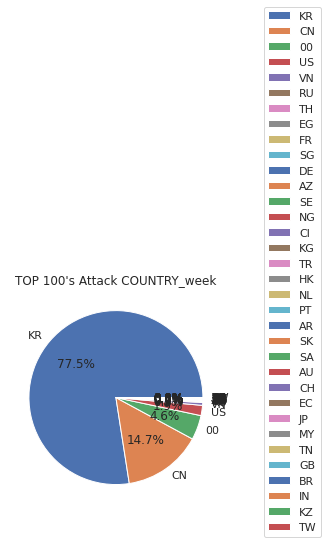

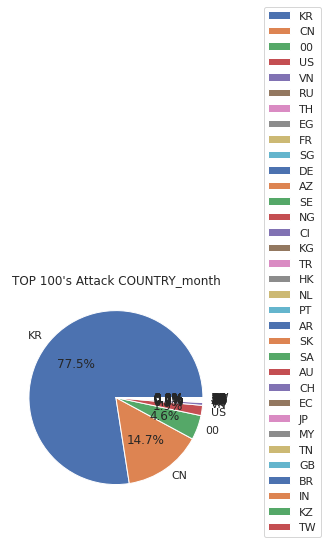

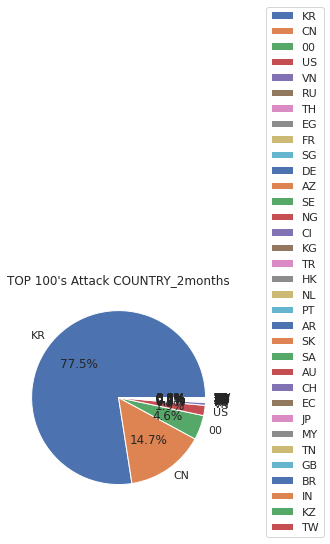

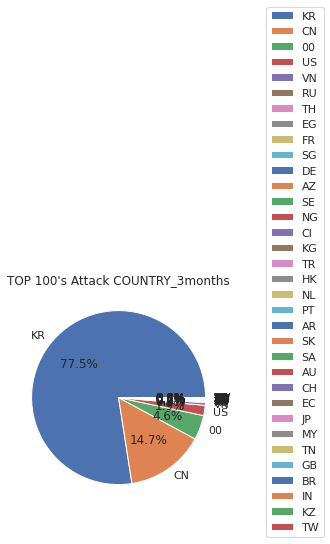

In [280]:
## 기간별(1주일,1달,2달,3달)로 어떤 위협공격 국가코드가 위협경보모니터링(ts_data_threat-2020)에서 많이 발생했는지를 보여줌

#1. 위협경보 1주일 데이터에서 위협공격 국가코드를 가져온 다음 내림차순으로 개수를 셈
COUNTRY_week=pd_att_type_week['TW_ATT_CT_CODE'].value_counts()
#2. 1에서 상위 100개만 가져옴
COUNTRY_week_100=pd.DataFrame(COUNTRY_week[:100])
#3. 그래프에 상위 100개의 위협공격 국가코드명을 부여하기위한 설정
feature_index_COUNTRY_week=COUNTRY_week.index
#4. 파이 그래프로 나타내기위한 설정
plt.plot(aspect='auto', figsize=(10,7), legend=True, explode=(0.1,0,0,0))
#5. 3에 소수점 1자리까지 나타내기위한 설정
plt.pie(COUNTRY_week, labels=feature_index_COUNTRY_week, autopct='%1.1f%%')
#6. 3에 해당하는 값에 각각 백분율을 나타내기위한 설정
percentage=100.*COUNTRY_week/COUNTRY_week.sum()
#7. 오른쪽 하단에 범례 설정
plt.legend(feature_index_COUNTRY_week, bbox_to_anchor=(1,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
#8. 그래프의 이름 설정
plt.title('TOP 100\'s Attack COUNTRY_week')
plt.show()

COUNTRY_month=pd_att_type_month['TW_ATT_CT_CODE'].value_counts()
COUNTRY_month_100=COUNTRY_month[:100]
feature_index_COUNTRY_month=COUNTRY_month.index
plt.plot(aspect='auto', figsize=(10,7), legend=True, explode=(0.1,0,0,0))
plt.pie(COUNTRY_month, labels=feature_index_COUNTRY_month, autopct='%1.1f%%')
percentage=100.*COUNTRY_month/COUNTRY_month.sum()
plt.legend(feature_index_COUNTRY_month, bbox_to_anchor=(1,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
plt.title('TOP 100\'s Attack COUNTRY_month')
plt.show()


COUNTRY_2months=pd_att_type_2months['TW_ATT_CT_CODE'].value_counts()
COUNTRY_2months_100=COUNTRY_2months[:100]
feature_index_COUNTRY_2months=COUNTRY_2months.index
plt.plot(aspect='auto', figsize=(10,7), legend=True, explode=(0.1,0,0,0))
plt.pie(COUNTRY_2months, labels=feature_index_COUNTRY_2months, autopct='%1.1f%%')
percentage=100.*COUNTRY_2months/COUNTRY_2months.sum()
plt.legend(feature_index_COUNTRY_2months, bbox_to_anchor=(1,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
plt.title('TOP 100\'s Attack COUNTRY_2months')
plt.show()



COUNTRY_3months=pd_att_type_3months['TW_ATT_CT_CODE'].value_counts()
COUNTRY_3months_100=COUNTRY_3months[:100]
feature_index_COUNTRY_3months=COUNTRY_3months.index
plt.plot(aspect='auto', figsize=(10,7), legend=True, explode=(0.1,0,0,0))
plt.pie(COUNTRY_3months, labels=feature_index_COUNTRY_3months, autopct='%1.1f%%')
percentage=100.*COUNTRY_2months/COUNTRY_2months.sum()
plt.legend(feature_index_COUNTRY_3months, bbox_to_anchor=(1,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
plt.title('TOP 100\'s Attack COUNTRY_3months')
plt.show()



# 위협공격 포트에 대한 기간별 bar plot(상위 10개)

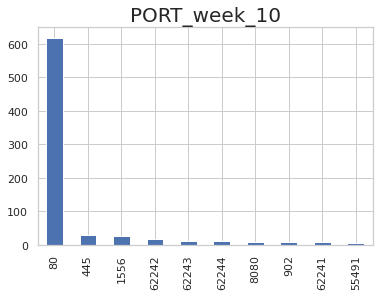

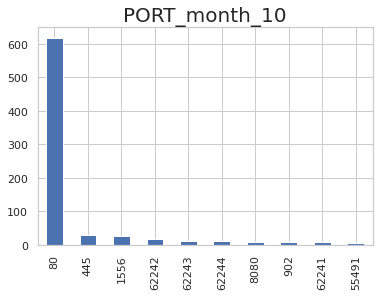

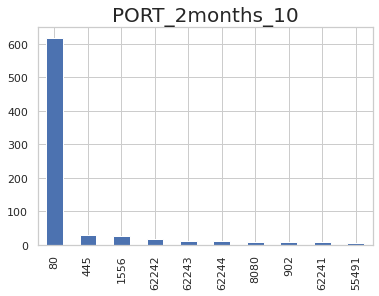

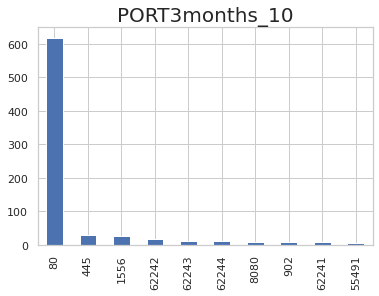

In [282]:
## 기간별(1주일,1달,2달,3달)로 어떤 위협공격 포트가 위협경보모니터링(ts_data_threat-2020)에서 많이 발생했는지를 보여줌

#1. 위협경보 1주일 데이터에서 위협공격 포트를 가져온 다음 내림차순으로 개수를 셈
PORT_week=pd_att_type_week['TW_ATT_PORT'].value_counts()
#2. 1에서 상위 10개만 가져옴
PORT_week_100=PORT_week[:10]
#3. 바 그래프로 나타내기위한 설정
PORT_week_100.plot(kind='bar')
#4. 그래프의 이름 설정
plt.title('PORT_week_10', fontsize=20)
plt.show()

PORT_month=pd_att_type_month['TW_ATT_PORT'].value_counts()
PORT_month_100=PORT_month[:10]
PORT_month_100.plot(kind='bar')
plt.title('PORT_month_10', fontsize=20)
plt.show()


PORT_2months=pd_att_type_2months['TW_ATT_PORT'].value_counts()
PORT_2months_100=PORT_2months[:10]
PORT_2months_100.plot(kind='bar')
plt.title('PORT_2months_10', fontsize=20)
plt.show()

PORT_3months=pd_att_type_3months['TW_ATT_PORT'].value_counts()
PORT_3months_100=PORT_3months[:10]
PORT_3months_100.plot(kind='bar')
plt.title('PORT3months_10', fontsize=20)
plt.show()

# 장비, 위협 공격 국가,  위협 공격 포트 간의 상관관계를 구하기위한 연결

In [106]:
Con_week=pd.concat([GEAR_week_100, COUNTRY_week_100], axis=1)
Con_week=pd.concat([Con_week, PORT_week_100], axis=1)
print('week : ',Con_week)

Con_month=pd.concat([GEAR_month_100, COUNTRY_month_100], axis=1)
Con_month=pd.concat([Con_month, PORT_month_100], axis=1)
print('month : ', Con_month)

Con_2months=pd.concat([GEAR_2months_100, COUNTRY_2months_100], axis=1)
Con_2months=pd.concat([Con_2months, PORT_2months_100], axis=1)
print('2months : ',Con_2months)

Con_3months=pd.concat([GEAR_3months_100, COUNTRY_3months_100], axis=1)
Con_3months=pd.concat([Con_3months, PORT_3months_100], axis=1)
print('3months : ',Con_3months)

week :        GEAR_CODE  TW_ATT_CT_CODE  TW_ATT_PORT
80          NaN             NaN        619.0
445         NaN             NaN         29.0
902         NaN             NaN          8.0
1556        NaN             NaN         25.0
8080        NaN             NaN          8.0
...         ...             ...          ...
TN          NaN             1.0          NaN
TR          NaN             3.0          NaN
TW          NaN             1.0          NaN
US          NaN           190.0          NaN
VN          NaN            52.0          NaN

[144 rows x 3 columns]
month :        GEAR_CODE  TW_ATT_CT_CODE  TW_ATT_PORT
80          NaN             NaN        619.0
445         NaN             NaN         29.0
902         NaN             NaN          8.0
1556        NaN             NaN         25.0
8080        NaN             NaN          8.0
...         ...             ...          ...
TN          NaN             1.0          NaN
TR          NaN             3.0          NaN
TW          Na

# 장비, 위협 공격 국가,  위협 공격 포트 간의 기간별(1주일,1달,2달,3달) 상관관계

In [107]:
print('week : ', Con_week.corr())
print('month : ', Con_month.corr())
print('2months : ', Con_2months.corr())
print('3months : ', Con_3months.corr())

# 상관계수가 1에 가까워질수록, 하나가 증가할때 다른 하나도 함께 증가하는 경향이 나타나고 -1에 가까워질수록, 하나가 증가하면 다른 하나가 감소하는 경향이 있다는 의미
# low번호와 column 번호가 동일할 때에는, 내 자신에 대한 상관계수 이므로 항상 1
# A와 B의 상관관계가 높다는 것은 함께 움직이는 경향이 있다는 것으로, "A를 증가하게 만들면 B가 증가할 것이다." 는 뜻은 아님

week :                  GEAR_CODE  TW_ATT_CT_CODE  TW_ATT_PORT
GEAR_CODE             1.0             NaN          NaN
TW_ATT_CT_CODE        NaN             1.0          NaN
TW_ATT_PORT           NaN             NaN          1.0
month :                  GEAR_CODE  TW_ATT_CT_CODE  TW_ATT_PORT
GEAR_CODE             1.0             NaN          NaN
TW_ATT_CT_CODE        NaN             1.0          NaN
TW_ATT_PORT           NaN             NaN          1.0
2months :                  GEAR_CODE  TW_ATT_CT_CODE  TW_ATT_PORT
GEAR_CODE             1.0             NaN          NaN
TW_ATT_CT_CODE        NaN             1.0          NaN
TW_ATT_PORT           NaN             NaN          1.0
3months :                  GEAR_CODE  TW_ATT_CT_CODE  TW_ATT_PORT
GEAR_CODE             1.0             NaN          NaN
TW_ATT_CT_CODE        NaN             1.0          NaN
TW_ATT_PORT           NaN             NaN          1.0


# 장비, 위협 공격 국가,  위협 공격 포트 간의 기간별(1주일,1달,2달,3달) 상관관계 heatmap

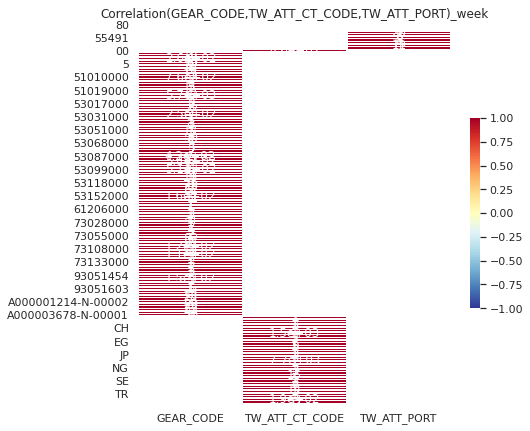

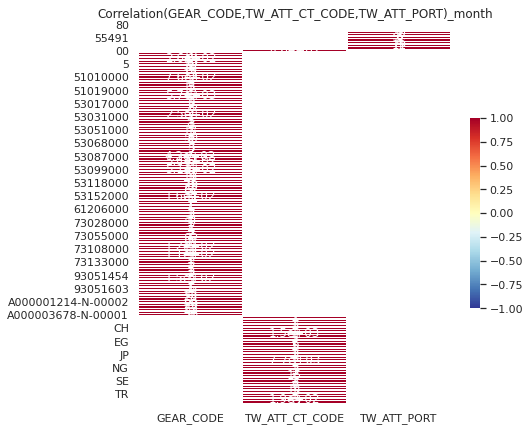

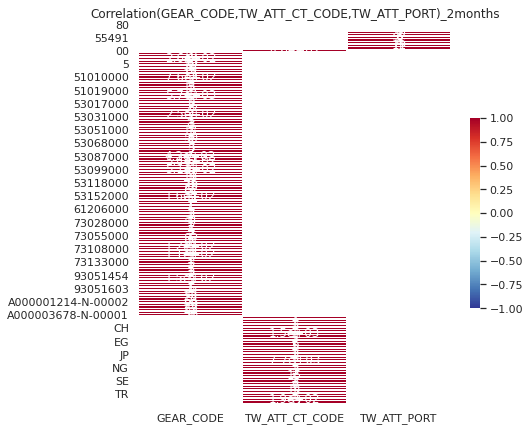

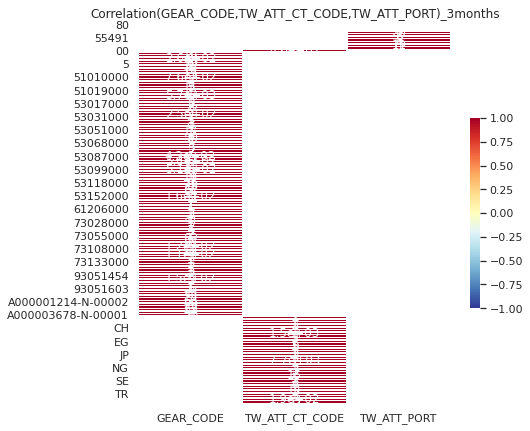

In [230]:
fig, ax = plt.subplots( figsize=(7,7) )
mask = np.zeros_like(Con_week, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(Con_week, 
            cmap = 'RdYlBu_r', 
            annot = True,   
            mask=mask,      
            linewidths=.5,  
            cbar_kws={"shrink": .5},
            vmin = -1,vmax = 1   
           )
plt.title('Correlation(GEAR_CODE,TW_ATT_CT_CODE,TW_ATT_PORT)_week')
plt.show()


fig, ax = plt.subplots( figsize=(7,7) )
mask = np.zeros_like(Con_month, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(Con_month, 
            cmap = 'RdYlBu_r', 
            annot = True,   
            mask=mask,      
            linewidths=.5,  
            cbar_kws={"shrink": .5},
            vmin = -1,vmax = 1   
           )  
plt.title('Correlation(GEAR_CODE,TW_ATT_CT_CODE,TW_ATT_PORT)_month')
plt.show()

fig, ax = plt.subplots( figsize=(7,7) )
mask = np.zeros_like(Con_2months, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(Con_2months, 
            cmap = 'RdYlBu_r', 
            annot = True,   
            mask=mask,      
            linewidths=.5,  
            cbar_kws={"shrink": .5},
            vmin = -1,vmax = 1   
           )  
plt.title('Correlation(GEAR_CODE,TW_ATT_CT_CODE,TW_ATT_PORT)_2months')
plt.show()

fig, ax = plt.subplots( figsize=(7,7) )
mask = np.zeros_like(Con_3months, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(Con_3months, 
            cmap = 'RdYlBu_r', 
            annot = True,   
            mask=mask,      
            linewidths=.5,  
            cbar_kws={"shrink": .5},
            vmin = -1,vmax = 1   
           )  
plt.title('Correlation(GEAR_CODE,TW_ATT_CT_CODE,TW_ATT_PORT)_3months')
plt.show()

# 상관계수가 1에 가까워질수록, 하나가 증가할때 다른 하나도 함께 증가하는 경향이 나타나고 붉은색으로 표시
# 상관계수가 0에 가까워질수록, 아무런 관계가 없음을 의미하며 흰색으로 표시
# 상관계수가-1에 가까워질수록, 하나가 증가하면 다른 하나가 감소하는 경향이 있다는 의미이며 푸른색으로 표시

# 위협공격 국가, 위협경보 탐지건수, 위협피해포트 간의 상관관계 scatter plot (1week) 

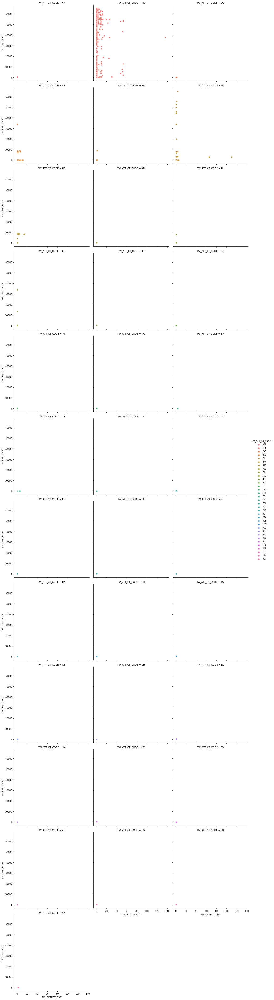

In [115]:
## 국가별로 어떤 위협피해 포트에서 위협경보 탐지건수가 얼마나 발생했는지 보여줌

#1. 위협경보 1주일 데이터에서 위협공격 국가코드, 위협경보 탐지건수, 위협피해 포트를 가져옴
data_coun_IP_port=pd_att_type_week.loc[:,['TW_ATT_CT_CODE','TW_DETECT_CNT','TW_DMG_PORT']]
#2. 국가별로 1에 해당하는 상관관계 scatter plot 설정
sns.relplot(data=data_coun_IP_port, x='TW_DETECT_CNT', y='TW_DMG_PORT', hue='TW_ATT_CT_CODE', col='TW_ATT_CT_CODE',  sizes=(50, 50), col_wrap=3)

# TW_ATT_CT_CODE=KR의 경우, 위협경보 탐지건수(x축)와 위협피해 포트(y축)관계에서 위협공격 국가코드가 한국인 경우를 나타냄

# 위협공격 국가, 위협경보 탐지건수, 위협피해포트 간의 상관관계 scatter plot (1month) 

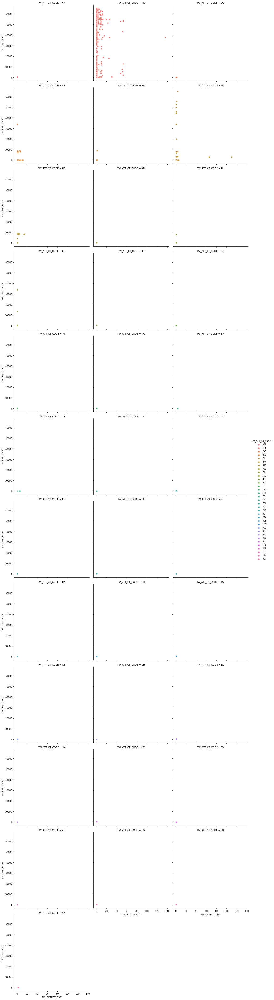

In [116]:
data_coun_IP_port=pd_att_type_month.loc[:,['TW_ATT_CT_CODE','TW_DETECT_CNT','TW_DMG_PORT']]
# data_random1=data_coun_IP_port.sample(n=10) 
sns.relplot(data=data_coun_IP_port, x='TW_DETECT_CNT', y='TW_DMG_PORT', hue='TW_ATT_CT_CODE', col='TW_ATT_CT_CODE',  sizes=(50, 50), col_wrap=3)

# 위협공격 국가, 위협경보 탐지건수, 위협피해포트 간의 상관관계 scatter plot (2months)

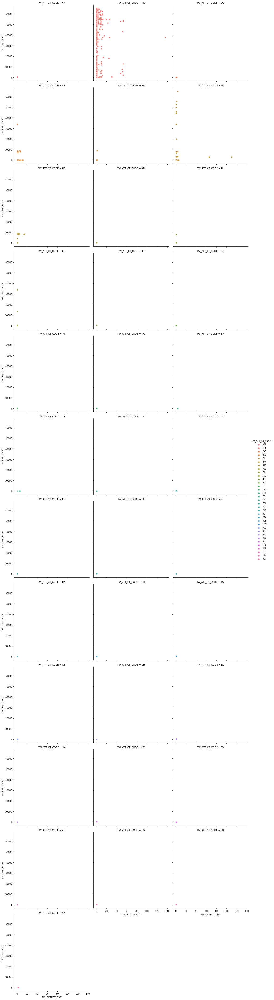

In [117]:
data_coun_IP_port=pd_att_type_2months.loc[:,['TW_ATT_CT_CODE','TW_DETECT_CNT','TW_DMG_PORT']]
# data_random1=data_coun_IP_port.sample(n=10) 
sns.relplot(data=data_coun_IP_port, x='TW_DETECT_CNT', y='TW_DMG_PORT', hue='TW_ATT_CT_CODE', col='TW_ATT_CT_CODE',  sizes=(50, 50), col_wrap=3)

# 위협공격 국가, 위협경보 탐지건수, 위협피해포트 간의 상관관계 scatter plot (3months) 

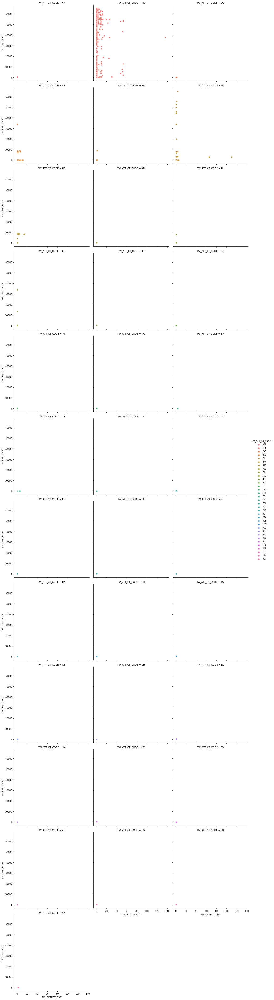

In [118]:
data_coun_IP_port=pd_att_type_3months.loc[:,['TW_ATT_CT_CODE','TW_DETECT_CNT','TW_DMG_PORT']]
# data_random1=data_coun_IP_port.sample(n=10) 
sns.relplot(data=data_coun_IP_port, x='TW_DETECT_CNT', y='TW_DMG_PORT', hue='TW_ATT_CT_CODE', col='TW_ATT_CT_CODE',  sizes=(50, 50), col_wrap=3)

# 위협공격 국가, 위협경보 탐지건수, 위협피해포트 간의 상관관계 scatter plot(중복 제거)(1week)

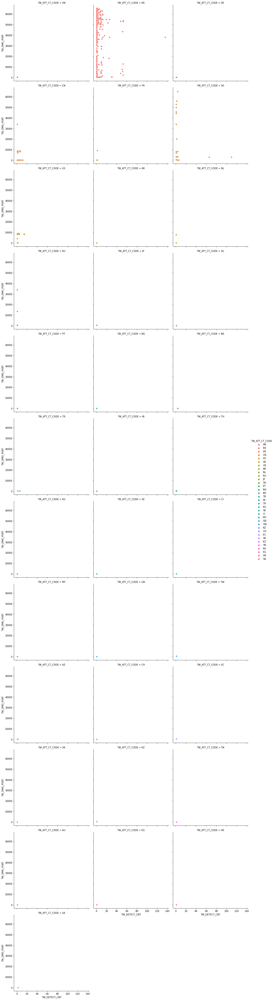

In [119]:
data_coun_IP_port=pd_att_type_week.loc[:,['TW_ATT_CT_CODE','TW_DETECT_CNT','TW_DMG_PORT']]
data_coun_IP_port_unique=data_coun_IP_port.drop_duplicates(subset=['TW_ATT_CT_CODE','TW_DETECT_CNT','TW_DMG_PORT']) 
sns.relplot(data=data_coun_IP_port_unique, x='TW_DETECT_CNT', y='TW_DMG_PORT', hue='TW_ATT_CT_CODE', col='TW_ATT_CT_CODE',  sizes=(50, 50), col_wrap=3)

# 위협공격 국가, 위협경보 탐지건수, 위협피해포트 간의 상관관계 scatter plot(중복 제거)(1month)

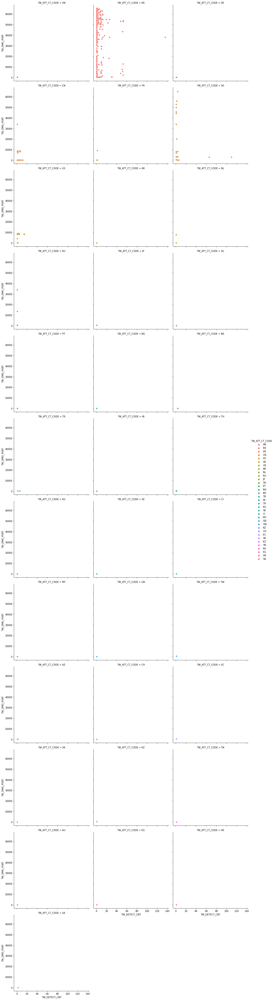

In [120]:
data_coun_IP_port=pd_att_type_month.loc[:,['TW_ATT_CT_CODE','TW_DETECT_CNT','TW_DMG_PORT']]
data_coun_IP_port_unique=data_coun_IP_port.drop_duplicates(subset=['TW_ATT_CT_CODE','TW_DETECT_CNT','TW_DMG_PORT']) 
sns.relplot(data=data_coun_IP_port_unique, x='TW_DETECT_CNT', y='TW_DMG_PORT', hue='TW_ATT_CT_CODE', col='TW_ATT_CT_CODE',  sizes=(50, 50), col_wrap=3)

# 위협공격 국가, 위협경보 탐지건수, 위협피해포트 간의 상관관계 scatter plot(중복 제거)(2months)

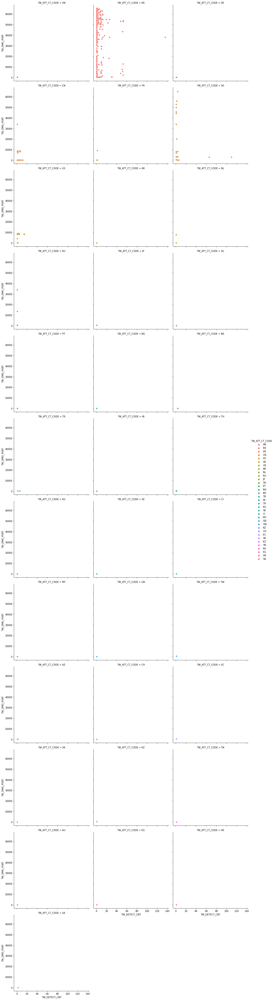

In [121]:
data_coun_IP_port=pd_att_type_2months.loc[:,['TW_ATT_CT_CODE','TW_DETECT_CNT','TW_DMG_PORT']]
data_coun_IP_port_unique=data_coun_IP_port.drop_duplicates(subset=['TW_ATT_CT_CODE','TW_DETECT_CNT','TW_DMG_PORT']) 
sns.relplot(data=data_coun_IP_port_unique, x='TW_DETECT_CNT', y='TW_DMG_PORT', hue='TW_ATT_CT_CODE', col='TW_ATT_CT_CODE',  sizes=(50, 50), col_wrap=3)

# 위협공격 국가, 위협경보 탐지건수, 위협피해포트 간의 상관관계 scatter plot(중복 제거)(3months)

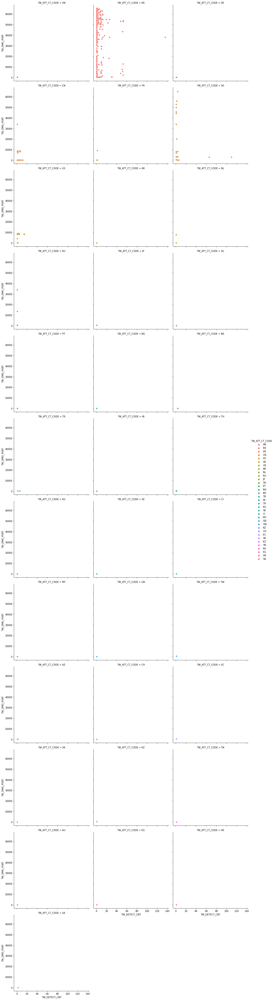

In [122]:
data_coun_IP_port=pd_att_type_3months.loc[:,['TW_ATT_CT_CODE','TW_DETECT_CNT','TW_DMG_PORT']]
data_coun_IP_port_unique=data_coun_IP_port.drop_duplicates(subset=['TW_ATT_CT_CODE','TW_DETECT_CNT','TW_DMG_PORT']) 
sns.relplot(data=data_coun_IP_port_unique, x='TW_DETECT_CNT', y='TW_DMG_PORT', hue='TW_ATT_CT_CODE', col='TW_ATT_CT_CODE',  sizes=(50, 50), col_wrap=3)

# 위협경보 프로토콜명, 위협경보 탐지건수, 위협피해 포트 간의 상관관계 scatter plot(1week)

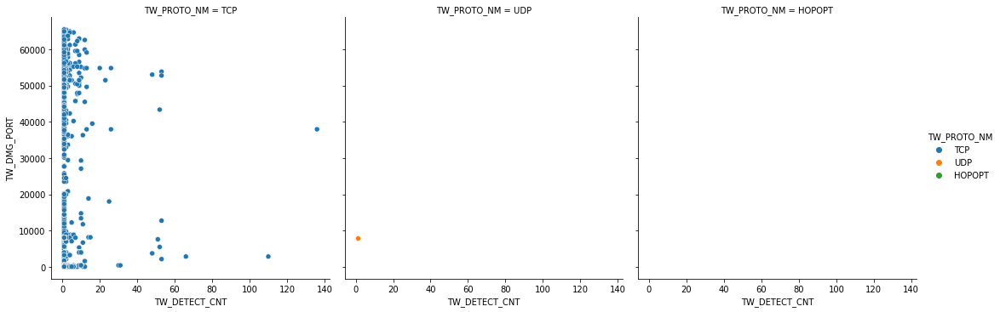

In [123]:
## 위협경보 프로토콜명별로 어떤 위협피해 포트에서 위협경보 탐지건수가 얼마나 발생했는지 보여줌

#1. 위협경보 1주일 데이터에서 위협경보 프로토콜명, 위협경보 탐지건수, 위협피해 포트를 가져옴
data_proto_IP_port=pd_att_type_week.loc[:,['TW_PROTO_NM', 'TW_DETECT_CNT','TW_DMG_PORT']]
#2. 위협경보 프로토콜명별로 1에 해당하는 상관관계 scatter plot 설정
sns.relplot(data=data_proto_IP_port, x='TW_DETECT_CNT', y='TW_DMG_PORT', hue='TW_PROTO_NM', col='TW_PROTO_NM',  sizes=(50, 50), col_wrap=3)

# TW_PROTO_NM=TCP의 경우, 위협경보 탐지건수(x축)와 위협피해 포트(y축)관계에서 위협경보 프로토콜명이 TCP인 경우를 나타냄

# 위협경보 프로토콜명, 위협경보 탐지건수, 위협피해포트 간의 상관관계 scatter plot(1month)

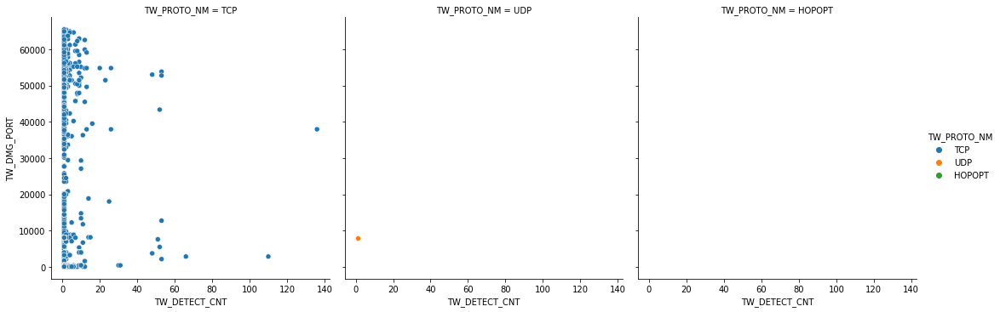

In [124]:
data_proto_IP_port=pd_att_type_month.loc[:,['TW_PROTO_NM', 'TW_DETECT_CNT','TW_DMG_PORT']]
# data_random2=data_proto_IP_port.sample(n=10)
sns.relplot(data=data_proto_IP_port, x='TW_DETECT_CNT', y='TW_DMG_PORT', hue='TW_PROTO_NM', col='TW_PROTO_NM',  sizes=(50, 50), col_wrap=3)

# 위협경보 프로토콜명, 위협경보 탐지건수, 위협피해포트 간의 상관관계 scatter plot(2months)

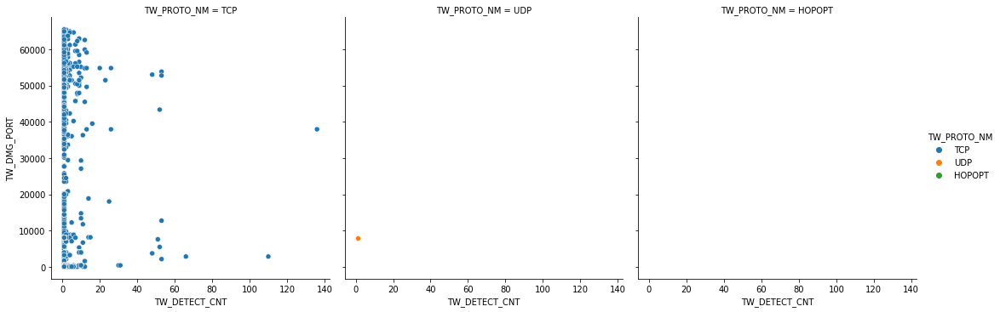

In [125]:
data_proto_IP_port=pd_att_type_2months.loc[:,['TW_PROTO_NM', 'TW_DETECT_CNT','TW_DMG_PORT']]
sns.relplot(data=data_proto_IP_port, x='TW_DETECT_CNT', y='TW_DMG_PORT', hue='TW_PROTO_NM', col='TW_PROTO_NM',  sizes=(50, 50), col_wrap=3)

# 위협경보 프로토콜명, 위협경보 탐지건수, 위협피해포트 간의 상관관계 scatter plot(3months)

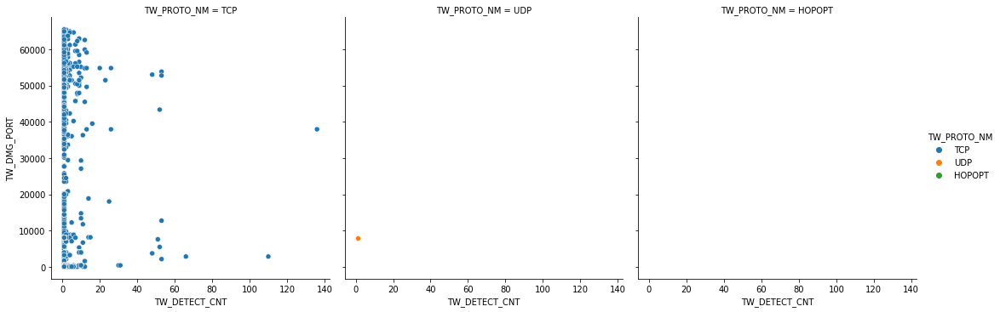

In [126]:
data_proto_IP_port=pd_att_type_3months.loc[:,['TW_PROTO_NM', 'TW_DETECT_CNT','TW_DMG_PORT']]
sns.relplot(data=data_proto_IP_port, x='TW_DETECT_CNT', y='TW_DMG_PORT', hue='TW_PROTO_NM', col='TW_PROTO_NM',  sizes=(50, 50), col_wrap=3)

# 위협경보 프로토콜명, 위협경보 탐지건수, 위협피해포트 간의 상관관계 scatter plot(중복제거)(1week)

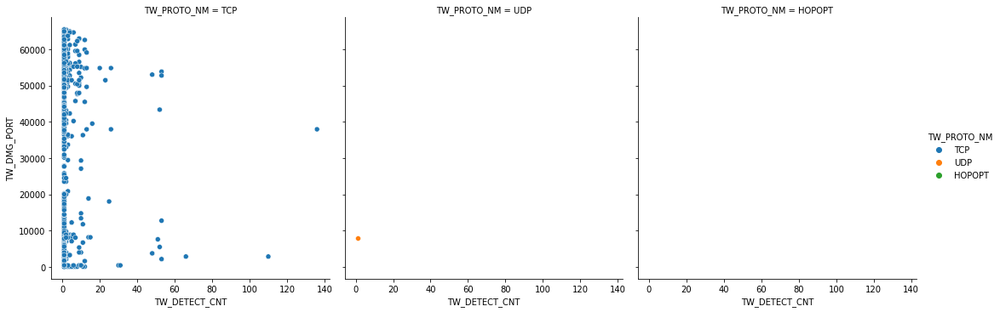

In [127]:
data_proto_IP_port=pd_att_type_week.loc[:,['TW_PROTO_NM', 'TW_DETECT_CNT','TW_DMG_PORT']]
data_proto_IP_port_unique=data_proto_IP_port.drop_duplicates()
sns.relplot(data=data_proto_IP_port_unique, x='TW_DETECT_CNT', y='TW_DMG_PORT', hue='TW_PROTO_NM', col='TW_PROTO_NM',  sizes=(50, 50), col_wrap=3)

# 위협경보 프로토콜명, 위협경보 탐지건수, 위협피해포트 간의 상관관계 scatter plot(중복제거)(1month)

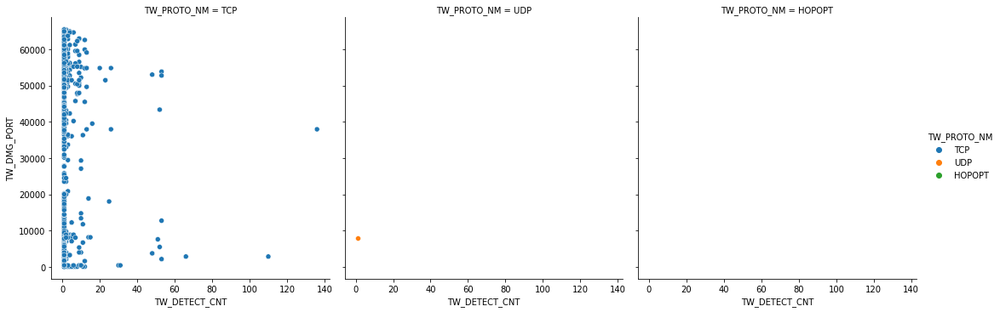

In [128]:
data_proto_IP_port=pd_att_type_month.loc[:,['TW_PROTO_NM', 'TW_DETECT_CNT','TW_DMG_PORT']]
data_proto_IP_port_unique=data_proto_IP_port.drop_duplicates()
sns.relplot(data=data_proto_IP_port_unique, x='TW_DETECT_CNT', y='TW_DMG_PORT', hue='TW_PROTO_NM', col='TW_PROTO_NM',  sizes=(50, 50), col_wrap=3)

# 위협경보 프로토콜명, 위협경보 탐지건수, 위협피해포트 간의 상관관계 scatter plot(중복제거)(2months)

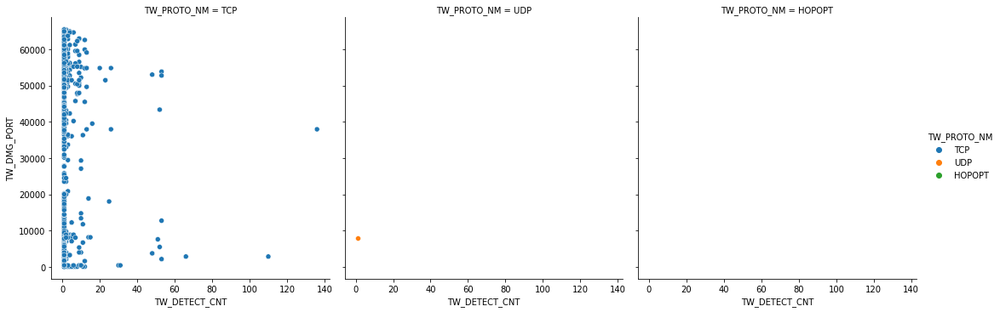

In [129]:
data_proto_IP_port=pd_att_type_2months.loc[:,['TW_PROTO_NM', 'TW_DETECT_CNT','TW_DMG_PORT']]
data_proto_IP_port_unique=data_proto_IP_port.drop_duplicates()
sns.relplot(data=data_proto_IP_port_unique, x='TW_DETECT_CNT', y='TW_DMG_PORT', hue='TW_PROTO_NM', col='TW_PROTO_NM',  sizes=(50, 50), col_wrap=3)

# 위협경보 프로토콜명, 위협경보 탐지건수, 위협피해포트 간의 상관관계 scatter plot(중복제거)(3months)

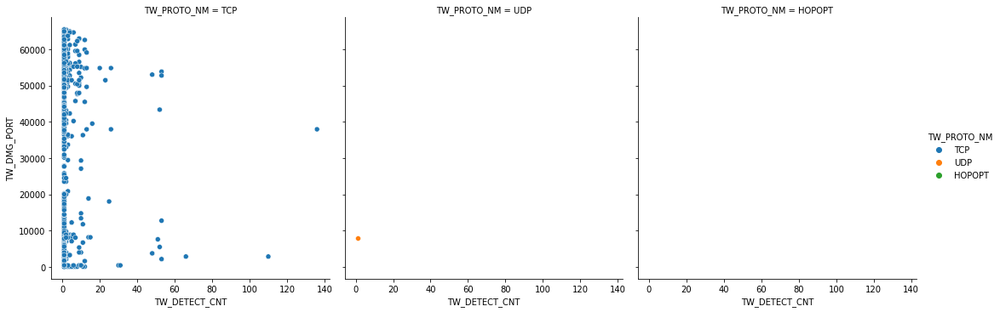

In [130]:
data_proto_IP_port=pd_att_type_3months.loc[:,['TW_PROTO_NM', 'TW_DETECT_CNT','TW_DMG_PORT']]
data_proto_IP_port_unique=data_proto_IP_port.drop_duplicates()
sns.relplot(data=data_proto_IP_port_unique, x='TW_DETECT_CNT', y='TW_DMG_PORT', hue='TW_PROTO_NM', col='TW_PROTO_NM',  sizes=(50, 50), col_wrap=3)

In [131]:
import seaborn as sns
print("Seaborn version : ", sns.__version__)
sns.set()
sns.set_style('whitegrid')
sns.set_color_codes()

Seaborn version :  0.11.0


# 기간 별 공격의도 별 표

In [132]:
## 기간별(1주일,1달,2달,3달)로 어떤 공격의도가 위협경보모니터링(ts_data_threat-2020)에서 많이 발생했는지를 보여줌

#1. 공격의도별로 빈 데이터프레임 생성 후, 컬럼에 이름 지정
RISKmaxValue=pd.DataFrame(index=range(0, 4), columns=['other','Malwr','Web','Hack','DDos','Attack','Mail'])
RISKmaxValue=RISKmaxValue.fillna(0)
#2. 1의 인덱스에 이름 지정
RISKmaxValue.index=['1week','1month','2months','3months']
#3. 기간별(1주일,1달,2달,3달) 위협경보모니터링 데이터 가져옴
data_4tables=[pd_att_type_week,pd_att_type_month,pd_att_type_2months,pd_att_type_3months]
#4. 3에서 공격의도 데이터만 가져옴
for num, data in enumerate(data_4tables):

    RISK_V2=data.loc[:,'RISK_V2']
    for j in RISK_V2:
        RISK=[j['INTENT_VAL_0'],j['INTENT_VAL_1'],j['INTENT_VAL_2'],j['INTENT_VAL_3'],j['INTENT_VAL_4'],j['INTENT_VAL_5'],j['INTENT_VAL_6']]
#5. 4에서 각각의 공격 의도의 개수를 셈
        max_risk=RISK.index(max(RISK))
        RISKmaxValue.iloc[num, max_risk]+=1
print(RISKmaxValue)

# 기간별로 침입시도가 가장 많이 발생, 그 다음으로 해킹메일이 많이 발생함

         other  Malwr  Web  Hack  DDos  Attack  Mail
1week        0      8    4  1450     2    8536     0
1month       0      8    4  1450     2    8536     0
2months      0      8    4  1450     2    8536     0
3months      0      8    4  1450     2    8536     0


In [ ]:
# 기간 별 공격의도 별 plot

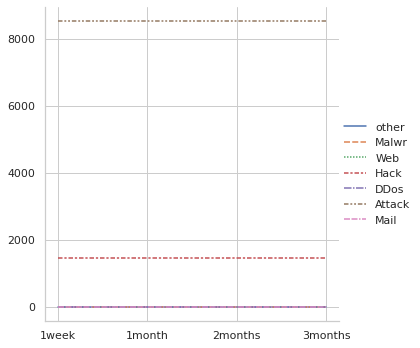

In [133]:
sns.relplot(data=RISKmaxValue, kind='line')

# 기간 별 공격유형 별 표

In [134]:
## 기간별(1주일,1달,2달,3달)로 어떤 공격유형이 위협경보모니터링(ts_data_threat-2020)에서 많이 발생했는지를 보여줌

#1. 공격유형별로 빈 데이터프레임 생성 후, 컬럼에 이름 지정
attacks = ['Malwr','Web','Hack','DDos','Attack','Mail']
ATT_TYPE_maxValue=pd.DataFrame(index=range(0, 4), columns=attacks)
ATT_TYPE_maxValue=ATT_TYPE_maxValue.fillna(0)
#2. 1의 인덱스에 이름 지정
ATT_TYPE_maxValue.index=['1week','1month','2months','3months']
#3. 기간별(1주일,1달,2달,3달) 위협경보모니터링 데이터 가져옴
data_4tables=[pd_att_type_week,pd_att_type_month,pd_att_type_2months,pd_att_type_3months]

#4. 3에서 공격유형-주분류 데이터만 가져옴
for num, data in enumerate(data_4tables):
    ATT_TYPE=data.loc[:,'DRULE_ATT_TYPE_CODE1'].value_counts()
    for (col,hap) in ATT_TYPE.items():
        #5. 4의 각각의 공격유형-주분류의 개수를 셈
        ATT_TYPE_maxValue.iloc[num,attacks.index(col)]=hap
print(ATT_TYPE_maxValue)

# 기간별로 침입시도가 가장 많이 발생, 그 다음으로 악성코드감염이 많이 발생함

         Malwr  Web  Hack  DDos  Attack  Mail
1week     1456    0     8     0    8536     0
1month    1456    0     8     0    8536     0
2months   1456    0     8     0    8536     0
3months   1456    0     8     0    8536     0


In [ ]:
# 기간 별 공격유형 별 plot

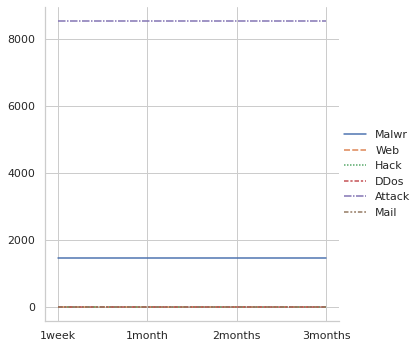

In [135]:
sns.relplot(data=ATT_TYPE_maxValue, kind='line')

# 기간과 공격의도별 상관관계 heatmap

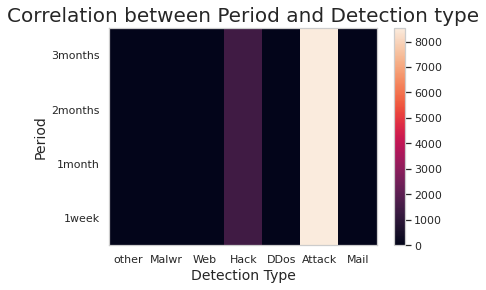

In [136]:
## 기간(1주일,1달,2달,3달)과 공격의도와의 상관 관계가 얼마나 있는지 보여줌

plt.pcolor(RISKmaxValue)
plt.xticks(np.arange(0.5,len(RISKmaxValue.columns),1), RISKmaxValue.columns)
plt.yticks(np.arange(0.5,len(RISKmaxValue.index),1),RISKmaxValue.index)
plt.title('Correlation between Period and Detection type', fontsize=20)
plt.xlabel('Detection Type', fontsize=14)
plt.ylabel('Period', fontsize=14)
plt.colorbar()
plt.show()

#전체를 9,000으로 놓고, 숫자가 8,000에 가까울수록 즉, 밝은색에 가까워질수록 상관관계가 높고, 0에 가까울수록 즉, 어두운 색에 가까울수록 상관관계가 낮음을 나타냄

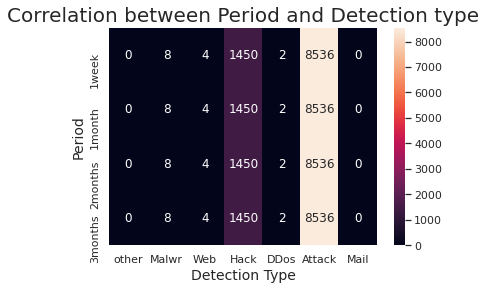

In [137]:
sns.heatmap(RISKmaxValue, annot=True, fmt='d')
plt.title('Correlation between Period and Detection type', fontsize=20)
plt.xlabel('Detection Type', fontsize=14)
plt.ylabel('Period', fontsize=14)
plt.show()

# 요청건 : 18/19/20 각 년도별 개발된 패턴 탐지/대응 현황

# 요청건 : 외부 위협정보를 통해 개발된 패턴(si, fi 등)과 자체 개발패턴(ECSC#)의 이벤트 발생현황 및 대응(정탐률) 비교

sns.heatmap(RISKmaxValue, center=RISKmaxValue.loc['data_week', '악성코드감염'])
plt.show()

# NTM탐지규칙 18년 (ECSC)과 대응현황

1
                                          DRULE_NM DRULE_ATT_TYPE_CODE1
0  Attack-BruteForce-29-01-wordpress.18122803ECSC#               Attack


Text(0.5, 1.0, 'pd_drule_18_ntm_ecsc')

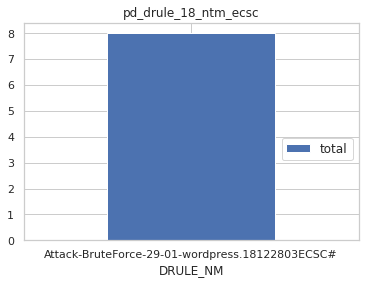

In [231]:
#NTM 18년 탐지규칙 데이터 가져오기

NTM_body_week={
    'size' : 10000,
    "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
    'query': {
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"1"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2018-01-01T00:00:00.625+09:00",
                        "lt":"2019-01-01T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
     "sort":[{
                "_id":"asc"
            }]
}
            

res = es.search(index = 'ts_ntm_detect_rule', body=NTM_body_week)
data_data_18_18_ntm_ecsc = res['hits']['hits']


total = res['hits']['total']

print(total)

drule_18_ntm_ecsc = []
for da in data_data_18_18_ntm_ecsc:
    att_type = da['_source']
    drule_18_ntm_ecsc.append(att_type)

tot_len = len(res["hits"]["hits"])
nxt = res["hits"]["hits"][-1]["sort"][0]

while(tot_len != total):
    body = {
        "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
        "search_after": [nxt],
         'size' : 10000,
         'query':{
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"1"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2018-01-01T00:00:00.625+09:00",
                        "lt":"2019-01-01T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
            "sort":[{
                "_id":"asc"
            }]
         }
    
    res = es.search(index = 'ts_ntm_detect_rule', body=body)
    data_data_18_18_ntm_ecsc = res['hits']['hits']
    for da in data_data_18_18_ntm_ecsc:
        att_type = da['_source']
        drule_18_ntm_ecsc.append(att_type)
        
    tot_len += len(res["hits"]["hits"])
    nxt = res["hits"]["hits"][-1]["sort"][0]
    print(tot_len)
        
pd_drule_18_ntm_ecsc = pd.DataFrame.from_dict(drule_18_ntm_ecsc)

print(pd_drule_18_ntm_ecsc.head())


unique_sums=[]
for k in pd_drule_18_ntm_ecsc.values:
    unique_sums.append(pd_threat_2020.loc[pd_threat_2020['DRULE_NM']==k[0], 'TW_DETECT_CNT'].sum())
pd_drule_18_ntm_ecsc['total']=unique_sums

ax=pd_drule_18_ntm_ecsc.plot.bar(x='DRULE_NM',y='total', rot=0)
plt.legend(fontsize='12', loc='upper right', bbox_to_anchor=(1,0.5))
ax.set_title("pd_drule_18_ntm_ecsc")

# 2018년 ECSC NTM탐지규칙명과 개수를 보여줌

# NTM탐지규칙 19년 (ECSC)과 대응현황

13
                                            DRULE_NM DRULE_ATT_TYPE_CODE1
0  Attack-WebScan-29-01-Drupalgeddon3(CVE18-7602)...               Attack
1  Attack-Protocol-29-01-EternalBlue(MS17-010)_fi...               Attack
2  Attack-Scan-29-01-PHPUnit(CVE17-9841).19070506...               Attack
3  Attack-Scan-29-01-Realtek(CVE14-8361).19062803...               Attack
4     Attack-WebScan-29-01-linux(bash).19111431ECSC#               Attack


Text(0.5, 1.0, 'pd_drule_19_ntm_ecsc')

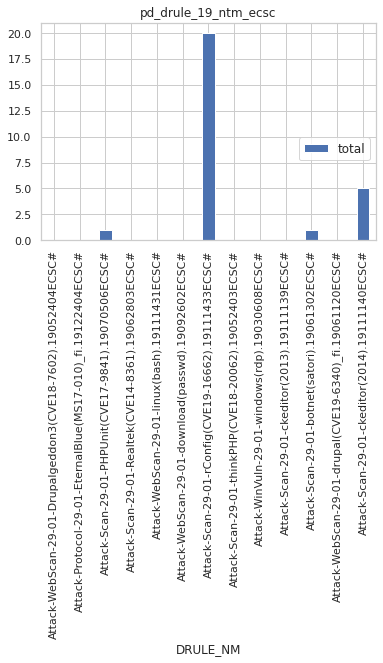

In [251]:
#NTM 19년 탐지규칙 데이터 가져오기

NTM_1month={
    'size' : 100,
    "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
    'query': {
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"1"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2019-01-01T00:00:00.625+09:00",
                        "lte":"2020-01-01T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
    
     "sort":[{
                "_id":"asc"
            }]
}
            

res = es.search(index = 'ts_ntm_detect_rule', body=NTM_1month)
data_data_19_19_ntm_ecsc  = res['hits']['hits']


total = res['hits']['total']

print(total)

drule_19_ntm_ecsc = []
for da in data_data_19_19_ntm_ecsc:
    att_type = da['_source']
    drule_19_ntm_ecsc.append(att_type)

tot_len = len(res["hits"]["hits"])
nxt = res["hits"]["hits"][-1]["sort"][0]

while(tot_len != total):
    
    body = {
        "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
        "search_after": [nxt],
         'size' : 100,
         'query':{
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"1"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2019-01-01T00:00:00.625+09:00",
                        "lt":"2020-01-01T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
            "sort":[{
                "_id":"asc"
            }]
         }
    
    res = es.search(index = 'ts_ntm_detect_rule', body=body)
    data_data_19_19_ntm_ecsc  = res['hits']['hits']
    for da in data_data_19_19_ntm_ecsc:
        att_type = da['_source']
        drule_19_ntm_ecsc.append(att_type)
        
    tot_len += len(res["hits"]["hits"])
    nxt = res["hits"]["hits"][-1]["sort"][0]
    print(tot_len)
        
pd_drule_19_ntm_ecsc = pd.DataFrame.from_dict(drule_19_ntm_ecsc)

print(pd_drule_19_ntm_ecsc.head())


unique_sums=[]
for k in pd_drule_19_ntm_ecsc.values:
    unique_sums.append(pd_threat_2020.loc[pd_threat_2020['DRULE_NM']==k[0], 'TW_DETECT_CNT'].sum())
pd_drule_19_ntm_ecsc['total']=unique_sums

       
ax=pd_drule_19_ntm_ecsc.plot.bar(x='DRULE_NM',y='total', rot=90)
plt.legend(fontsize='12', loc='upper right', bbox_to_anchor=(1,0.5))
ax.set_title("pd_drule_19_ntm_ecsc")       
  
# 2019년 ECSC NTM탐지규칙명과 개수를 보여줌

# NTM탐지규칙 20년 (ECSC)과 대응현황

3
                                            DRULE_NM DRULE_ATT_TYPE_CODE1
0  Attack-Scan-29-01-apache_struts2(CVE-16-3081)....               Attack
1  Attack-Scan-29-01-mirai_botnet(CVE20-5722).200...               Attack
2  Attack-BruteForce-29-01-tool(ncrack).20050701E...               Attack
                                            DRULE_NM DRULE_ATT_TYPE_CODE1  \
0  Attack-Scan-29-01-apache_struts2(CVE-16-3081)....               Attack   
1  Attack-Scan-29-01-mirai_botnet(CVE20-5722).200...               Attack   
2  Attack-BruteForce-29-01-tool(ncrack).20050701E...               Attack   

   total  
0      0  
1      0  
2      0  


Text(0.5, 1.0, 'pd_drule_20_ntm_ecsc')

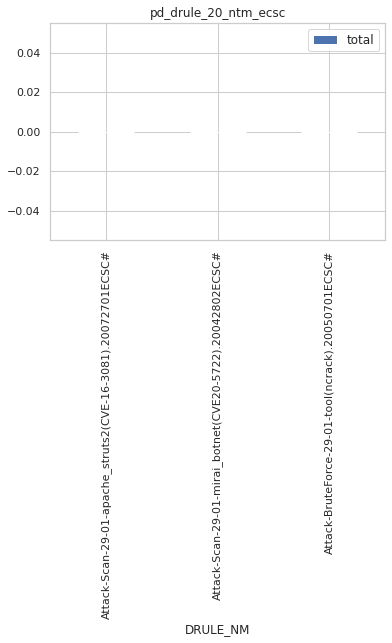

In [253]:
#NTM 20년 탐지규칙 데이터 가져오기

NTM_2months={
    'size' : 100,
    "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
    'query': {
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"1"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2020-01-01T00:00:00.625+09:00",
                        "lte":"2020-10-31T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
    "sort":[{
                "_id":"asc"
            }]
}
            

res = es.search(index = 'ts_ntm_detect_rule', body=NTM_2months)
data_data_20_20_ntm_ecsc = res['hits']['hits']




total = res['hits']['total']

print(total)

drule_20_ntm_ecsc = []
for da in data_data_20_20_ntm_ecsc:
    att_type = da['_source']
    drule_20_ntm_ecsc.append(att_type)

tot_len = len(res["hits"]["hits"])
nxt = res["hits"]["hits"][-1]["sort"][0]

while(tot_len != total):
    body = {
         "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
        "search_after": [nxt],
         'size' : 100,
         'query':{
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"1"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2020-01-01T00:00:00.625+09:00",
                        "lt":"2020-10-31T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
            "sort":[{
                "_id":"asc"
            }]
         }
    
    res = es.search(index = 'ts_ntm_detect_rule', body=body)
    data_data_20_20_ntm_ecsc = res['hits']['hits']
    for da in data_data_20_20_ntm_ecsc:
        att_type = da['_source']
        drule_20_ntm_ecsc.append(att_type)
        
    tot_len += len(res["hits"]["hits"])
    nxt = res["hits"]["hits"][-1]["sort"][0]
    print(tot_len)
        
pd_drule_20_ntm_ecsc = pd.DataFrame.from_dict(drule_20_ntm_ecsc)

print(pd_drule_20_ntm_ecsc)



unique_sums=[]
for k in pd_drule_20_ntm_ecsc.values:
    unique_sums.append(pd_threat_2020.loc[pd_threat_2020['DRULE_NM']==k[0], 'TW_DETECT_CNT'].sum())
pd_drule_20_ntm_ecsc['total']=unique_sums
ax=pd_drule_20_ntm_ecsc.plot.bar(x='DRULE_NM',y='total', rot=90)
plt.legend(fontsize='12', loc='upper right')
ax.set_title("pd_drule_20_ntm_ecsc")

# 2020년 ECSC NTM탐지규칙명과 개수를 보여줌
# 2020년에 만들어진 탐지규칙이지만, 탐지 건수는 0건, 즉 탐지를 아직 하지 못한 탐지규칙임

# NTM 18년 탐지규칙에 대한 pie plot(ECSC)

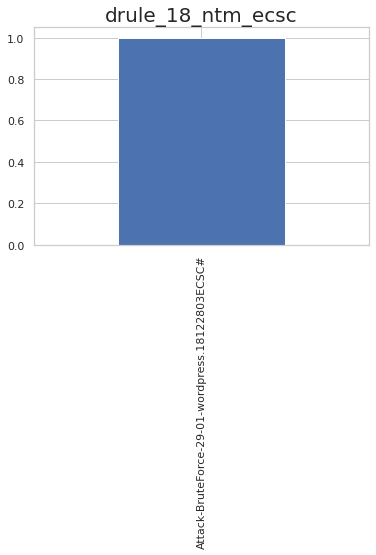

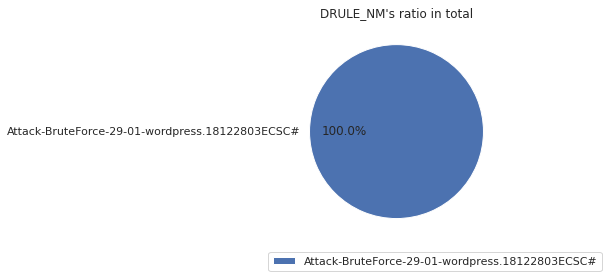

In [146]:
# #NTM 18년 데이터의 탐지규칙의 탐지규칙명에 대한 pie plot
# DETECTNAME_week=pd_drule_18_ntm_ecsc['DRULE_NM'].value_counts()
# # DETECTNAME_week_100=DETECTNAME_week[:100]
# DETECTNAME_week.plot(kind='bar')
# plt.title('drule_18_ntm_ecsc', fontsize=20)
# plt.legend(fontsize='12', loc='upper right')
# plt.show()

# df_DETECTNAME_week=pd.DataFrame([DETECTNAME_week])
# feature_index=DETECTNAME_week.index
# plt.plot(aspect='auto', figsize=(7,5), legend=True, explode=(0.1,0,0,0))
# plt.pie(DETECTNAME_week, labels=feature_index, autopct='%1.1f%%')
# plt.legend(feature_index, bbox_to_anchor=(1,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
# plt.title('DRULE_NM\'s ratio in total')
# plt.show()

# NTM 19년 탐지규칙에 대한 pie plot(ECSC)

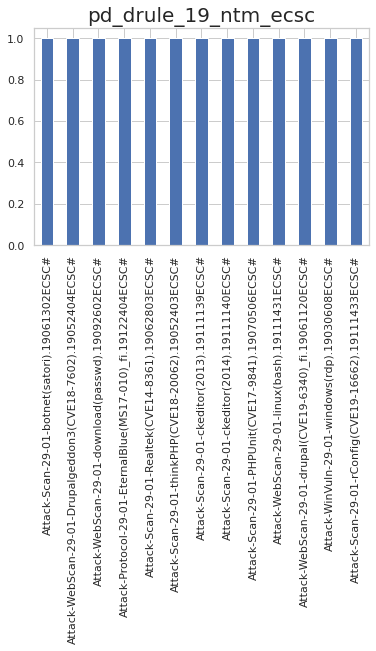

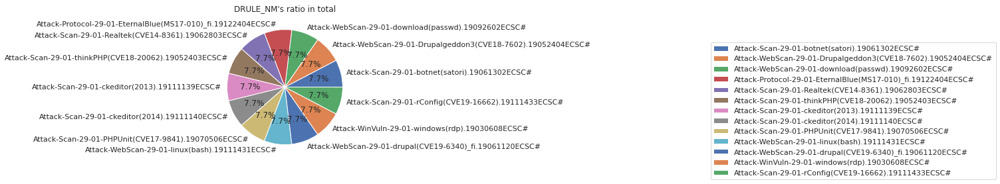

In [151]:
# #NTM 19년 데이터의 탐지규칙의 탐지규칙명에 대한 pie plot

# DETECTNAME_1month=pd_drule_19_ntm_ecsc['DRULE_NM'].value_counts()

# DETECTNAME_1month.plot(kind='bar')
# plt.title('drule_19_ntm_ecsc', fontsize=20)
# plt.show()


# df_DETECTNAME_1month=pd.DataFrame([DETECTNAME_1month])
# feature_index=DETECTNAME_1month.index
# plt.plot(aspect='auto', figsize=(7,5), legend=True, explode=(0.1,0,0,0))
# plt.pie(DETECTNAME_1month, labels=feature_index, autopct='%1.1f%%')
# plt.legend(feature_index, bbox_to_anchor=(3,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
# plt.title('DRULE_NM\'s ratio in total')
# plt.show()

# NTM 20년 탐지규칙에 대한 pie plot(ECSC)

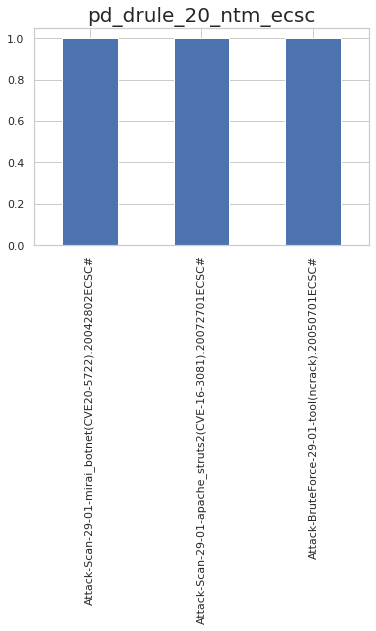

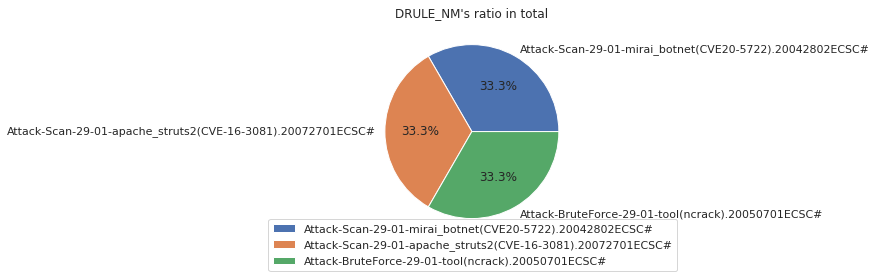

In [152]:
# #NTM 2달 데이터의 탐지규칙의 탐지규칙명에 대한 pie plot

# DETECTNAME_2months=pd_drule_20_ntm_ecsc['DRULE_NM'].value_counts()

# DETECTNAME_2months.plot(kind='bar')
# plt.title('pd_drule_20_ntm_ecsc', fontsize=20)
# plt.show()



# df_DETECTNAME_2months=pd.DataFrame([DETECTNAME_2months])
# feature_index=DETECTNAME_2months.index
# plt.plot(aspect='auto', figsize=(7,5), legend=True, explode=(0.1,0,0,0))
# plt.pie(DETECTNAME_2months, labels=feature_index, autopct='%1.1f%%')
# plt.legend(feature_index, bbox_to_anchor=(1,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
# plt.title('DRULE_NM\'s ratio in total')
# plt.show()

# NTM탐지규칙 18년 (NCSC)과 대응현황

In [154]:
#NTM 18년 탐지규칙 데이터 가져오기

NTM_body_week={
    'size' : 100,
    "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
    'query': {
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"0"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2018-01-01T00:00:00.625+09:00",
                        "lt":"2019-01-01T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
    
     "sort":[{
                "_id":"asc"
            }]
}
            

res = es.search(index = 'ts_ntm_detect_rule', body=NTM_body_week)
data_data_18_18_ntm_ncsc = res['hits']['hits']



total = res['hits']['total']

print(total)

drule_18_ntm_ncsc = []
for da in data_data_18_18_ntm_ncsc:
    att_type = da['_source']
    drule_18_ntm_ncsc.append(att_type)

tot_len = len(res["hits"]["hits"])
nxt = res["hits"]["hits"][-1]["sort"][0]

while(tot_len != total):
    body = {
        "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
        "search_after": [nxt],
         'size' : 100,
         'query':{
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"0"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2018-01-01T00:00:00.625+09:00",
                        "lt":"2019-01-01T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
            "sort":[{
                "_id":"asc"
            }]
         }
    
    res = es.search(index = 'ts_ntm_detect_rule', body=body)
    data_data_18_18_ntm_ncsc = res['hits']['hits']
    for da in data_data_18_18_ntm_ncsc:
        att_type = da['_source']
        drule_18_ntm_ncsc.append(att_type)
        
    tot_len += len(res["hits"]["hits"])
    nxt = res["hits"]["hits"][-1]["sort"][0]
    print(tot_len)
        
pd_drule_18_ntm_ncsc = pd.DataFrame.from_dict(drule_18_ntm_ncsc)

print(pd_drule_18_ntm_ncsc)


unique_sums=[]
for k in pd_drule_18_ntm_ncsc.values:
    unique_sums.append(pd_threat_2020.loc[pd_threat_2020['DRULE_NM']==k[0], 'TW_DETECT_CNT'].sum())
pd_drule_18_ntm_ncsc['total']=unique_sums

ax=pd_drule_18_ntm_ncsc.plot.bar(x='DRULE_NM',y='total', rot=90)
ax.set_title("pd_drule_18_ntm_ncsc")

# 2018년 ECSC NTM탐지규칙명과 개수를 보여줌

0


IndexError: list index out of range

# NTM탐지규칙 19년 (NCSC)과 대응현황

In [155]:
#NTM 19년 탐지규칙 데이터 가져오기

NTM_1month={
    'size' : 100,
    "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
    'query': {
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"0"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2019-01-01T00:00:00.625+09:00",
                        "lt":"2020-01-01T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
    
     "sort":[{
                "_id":"asc"
            }]
}
            

res = es.search(index = 'ts_ntm_detect_rule', body=NTM_1month)
data_data_19_19_ntm_ncsc = res['hits']['hits']




total = res['hits']['total']

print(total)

drule_19_ntm_ncsc = []
for da in data_data_19_19_ntm_ncsc:
    att_type = da['_source']
    drule_19_ntm_ncsc.append(att_type)

tot_len = len(res["hits"]["hits"])
nxt = res["hits"]["hits"][-1]["sort"][0]

while(tot_len != total):
    body = {
        "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
        "search_after": [nxt],
         'size' : 100,
         'query':{
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"0"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2019-01-01T00:00:00.625+09:00",
                        "lt":"2020-01-01T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
            "sort":[{
                "_id":"asc"
            }]
         }
    
    res = es.search(index = 'ts_ntm_detect_rule', body=body)
    data_data_19_19_ntm_ncsc = res['hits']['hits']
    for da in data_data_19_19_ntm_ncsc:
        att_type = da['_source']
        drule_19_ntm_ncsc.append(att_type)
        
    tot_len += len(res["hits"]["hits"])
    nxt = res["hits"]["hits"][-1]["sort"][0]
    print(tot_len)
        
pd_drule_19_ntm_ncsc = pd.DataFrame.from_dict(drule_19_ntm_ncsc)

print(pd_drule_19_ntm_ncsc)



unique_sums=[]
for k in pd_drule_19_ntm_ncsc.values:
    unique_sums.append(pd_threat_2020.loc[pd_threat_2020['DRULE_NM']==k[0], 'TW_DETECT_CNT'].sum())
pd_drule_19_ntm_ncsc['total']=unique_sums

ax=pd_drule_19_ntm_ncsc.plot.bar(x='DRULE_NM',y='total', rot=90)
ax.set_title("pd_drule_19_ntm_ncsc")

# 2019년 NCSC NTM탐지규칙명과 개수를 보여줌

0


IndexError: list index out of range

# NTM탐지규칙 20년 (NCSC)과 대응현황

In [156]:
#NTM 20년 탐지규칙 데이터 가져오기

NTM_2months={
    'size' : 100,
    "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
    'query': {
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"0"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2020-01-01T00:00:00.625+09:00",
                        "lt":"2020-10-31T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
     "sort":[{
                "_id":"asc"
            }]
}
            

res = es.search(index = 'ts_ntm_detect_rule', body=NTM_2months)
data_data_20_20_ntm_ncsc = res['hits']['hits']




total = res['hits']['total']

print(total)

drule_20_ntm_ncsc = []
for da in data_data_20_20_ntm_ncsc:
    att_type = da['_source']
    drule_20_ntm_ncsc.append(att_type)

tot_len = len(res["hits"]["hits"])
nxt = res["hits"]["hits"][-1]["sort"][0]

while(tot_len != total):
    
    body = {
        "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
        "search_after": [nxt],
         'size' : 100,
         'query':{
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"0"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2020-01-01T00:00:00.625+09:00",
                        "lt":"2020-10-31T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
            "sort":[{
                "_id":"asc"
            }]
         }
    
    res = es.search(index = 'ts_ntm_detect_rule', body=body)
    data_data_20_20_ntm_ncsc = res['hits']['hits']
    for da in data_data_20_20_ntm_ncsc:
        att_type = da['_source']
        drule_20_ntm_ncsc.append(att_type)
        
    tot_len += len(res["hits"]["hits"])
    nxt = res["hits"]["hits"][-1]["sort"][0]
    print(tot_len)
        
pd_drule_20_ntm_ncsc = pd.DataFrame.from_dict(drule_20_ntm_ncsc)

print(pd_drule_20_ntm_ncsc)





unique_sums=[]
for k in pd_drule_20_ntm_ncsc.values:
    unique_sums.append(pd_threat_2020.loc[pd_threat_2020['DRULE_NM']==k[0], 'TW_DETECT_CNT'].sum())
pd_drule_20_ntm_ncsc['total']=unique_sums

ax=pd_drule_20_ntm_ncsc.plot.bar(x='DRULE_NM',y='total', rot=90)
ax.set_title("pd_drule_20_ntm_ncsc")

# 2020년 NCSC NTM탐지규칙명과 개수를 보여줌

0


IndexError: list index out of range

# NTM 18년 탐지규칙에 대한 pie plot(NCSC)

In [157]:
# #NTM 18년 데이터의 탐지규칙의 탐지규칙명에 대한 pie plot
# DETECTNAME_week=pd_drule_18_ntm_ncsc['DRULE_NM'].value_counts()

# DETECTNAME_week.plot(kind='bar')
# plt.title('drule_18_ntm_ncsc', fontsize=20)
# plt.show()



# df_DETECTNAME_week=pd.DataFrame([DETECTNAME_week])
# feature_index=DETECTNAME_week.index
# plt.plot(aspect='auto', figsize=(7,5), legend=True, explode=(0.1,0,0,0))
# plt.pie(DETECTNAME_week, labels=feature_index, autopct='%1.1f%%')
# plt.legend(feature_index, bbox_to_anchor=(1,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
# plt.title('DRULE_NM\'s ratio in total')
# plt.show()

NameError: name 'pd_drule_18_ntm_ncsc' is not defined

# NTM 19년 탐지규칙에 대한 pie plot(NCSC)

In [158]:
# #NTM 18년 데이터의 탐지규칙의 탐지규칙명에 대한 pie plot
# DETECTNAME_week=pd_drule_19_ntm_ncsc['DRULE_NM'].value_counts()


# DETECTNAME_week.plot(kind='bar')
# plt.title('drule_19_ntm_ncsc', fontsize=20)
# plt.show()

# df_DETECTNAME_week=pd.DataFrame([DETECTNAME_week])
# feature_index=DETECTNAME_week.index
# plt.plot(aspect='auto', figsize=(7,5), legend=True, explode=(0.1,0,0,0))
# plt.pie(DETECTNAME_week, labels=feature_index, autopct='%1.1f%%')
# plt.legend(feature_index, bbox_to_anchor=(1,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
# plt.title('DRULE_NM\'s ratio in total')
# plt.show()

NameError: name 'pd_drule_19_ntm_ncsc' is not defined

# NTM 2020년 탐지규칙에 대한 pie plot(NCSC)

In [159]:
# #NTM 18년 데이터의 탐지규칙의 탐지규칙명에 대한 pie plot
# DETECTNAME_week=pd_drule_20_ntm_ncsc['DRULE_NM'].value_counts()

# DETECTNAME_week.plot(kind='bar')
# plt.title('drule_20_ntm_ncsc', fontsize=20)
# plt.show()


# df_DETECTNAME_week=pd.DataFrame([DETECTNAME_week])
# feature_index=DETECTNAME_week.index
# plt.plot(aspect='auto', figsize=(7,5), legend=True, explode=(0.1,0,0,0))
# plt.pie(DETECTNAME_week, labels=feature_index, autopct='%1.1f%%')
# plt.legend(feature_index, bbox_to_anchor=(1,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
# plt.title('DRULE_NM\'s ratio in total')
# plt.show()

NameError: name 'pd_drule_20_ntm_ncsc' is not defined

# MTM탐지규칙 18년 (ECSC)과 대응현황

6
                                      DRULE_NM DRULE_ATT_TYPE_CODE1
0            Malwr_Bot_29_10_Zeus_18091103ECSC                Malwr
1  Malwr_Infected_29_11_cve157888_18091109ECSC                Malwr
2        Malwr_Ransom_29_11_petya_18091104ECSC                Malwr
3     Malwr_Ransom_29_11_GreenBug_18091102ECSC                Malwr
4    Malwr_Download_29_11_AZORult_18091105ECSC                Malwr
5    Malwr_Download_29_11_AZORult_18091105ECSC                Malwr


Text(0.5, 1.0, 'pd_drule_18_mtm_ecsc')

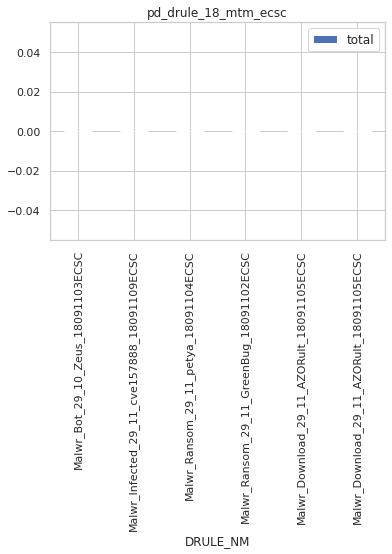

In [254]:
#MTM 18년 탐지규칙 데이터 가져오기

MTM_body_week={
    'size' : 100,
    "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
    'query': {
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"1"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2018-01-01T00:00:00.625+09:00",
                        "lt":"2019-01-01T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
    
     "sort":[{
                "_id":"asc"
            }]
}            

res = es.search(index = 'ts_mtm_detect_rule', body=MTM_body_week)
data_data_18_18_mtm_ecsc = res['hits']['hits']




total = res['hits']['total']

print(total)

drule_18_mtm_ecsc = []
for da in data_data_18_18_mtm_ecsc:
    att_type = da['_source']
    drule_18_mtm_ecsc.append(att_type)

tot_len = len(res["hits"]["hits"])
nxt = res["hits"]["hits"][-1]["sort"][0]

while(tot_len != total):
    body = {
        "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
        "search_after": [nxt],
         'size' : 100,
         'query':{
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"1"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2018-01-01T00:00:00.625+09:00",
                        "lt":"2019-01-08T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
            "sort":[{
                "_id":"asc"
            }]
         }
    
    res = es.search(index = 'ts_mtm_detect_rule', body=body)
    data_data_18_18_mtm_ecsc = res['hits']['hits']
    for da in data_data_18_18_mtm_ecsc:
        att_type = da['_source']
        drule_18_mtm_ecsc.append(att_type)
        
    tot_len += len(res["hits"]["hits"])
    nxt = res["hits"]["hits"][-1]["sort"][0]
    print(tot_len)
        
pd_drule_18_mtm_ecsc = pd.DataFrame.from_dict(drule_18_mtm_ecsc)

print(pd_drule_18_mtm_ecsc)



unique_sums=[]
for k in pd_drule_18_mtm_ecsc.values:
    unique_sums.append(pd_threat_2020.loc[pd_threat_2020['DRULE_NM']==k[0], 'TW_DETECT_CNT'].sum())
pd_drule_18_mtm_ecsc['total']=unique_sums

ax=pd_drule_18_mtm_ecsc.plot.bar(x='DRULE_NM',y='total', rot=90)
plt.legend(fontsize='12', loc='upper right')
ax.set_title("pd_drule_18_mtm_ecsc")

# 2018년 ECSC MTM탐지규칙명과 개수를 보여줌
# 2018년에 만들어진 탐지규칙이지만, 탐지 건수는 0건, 즉 탐지를 아직 하지 못한 탐지규칙임

# MTM탐지규칙 19년 (ECSC)과 대응현황

435
435
['QnX0mWoBZeWv1S59FZfj']
200
['eSLqSWsBDtS8rkN3Wyyj']
300
['uRPhmmoB6vT2Vtq4tg2d']
400
['zwoHmmoB5ZqK9nRtIfzq']
435
                                              DRULE_NM DRULE_ATT_TYPE_CODE1
0        Mail_Hack_29_11_Attachments_Mail_19041001ECSC                 Mail
1     Malwr_Infected_29_11_Malware_sample_19050802ECSC                Malwr
2       Malwr_Infected_29_11_MSEQNEDT_doc_19031201ECSC                Malwr
3     Malwr_Infected_29_11_Malware_sample_19050959ECSC                Malwr
4      Malwr_Download_29_11_Userform7_xls_19102202ECSC                Malwr
..                                                 ...                  ...
430     Malwr_Infected_29_11_MSEQNEDT_doc_19031201ECSC                Malwr
431  Malwr_Infected_29_11_Malware_sample_190509155ECSC                Malwr
432          Malwr_Infected_29_11_EPS_hwp_19041101ECSC                Malwr
433      Mail_Hack_29_11_Attachments_Mail_19041001ECSC                 Mail
434   Malwr_Infected_29_11_Malware_sampl

Text(0.5, 1.0, 'pd_drule_19_mtm_ecsc')

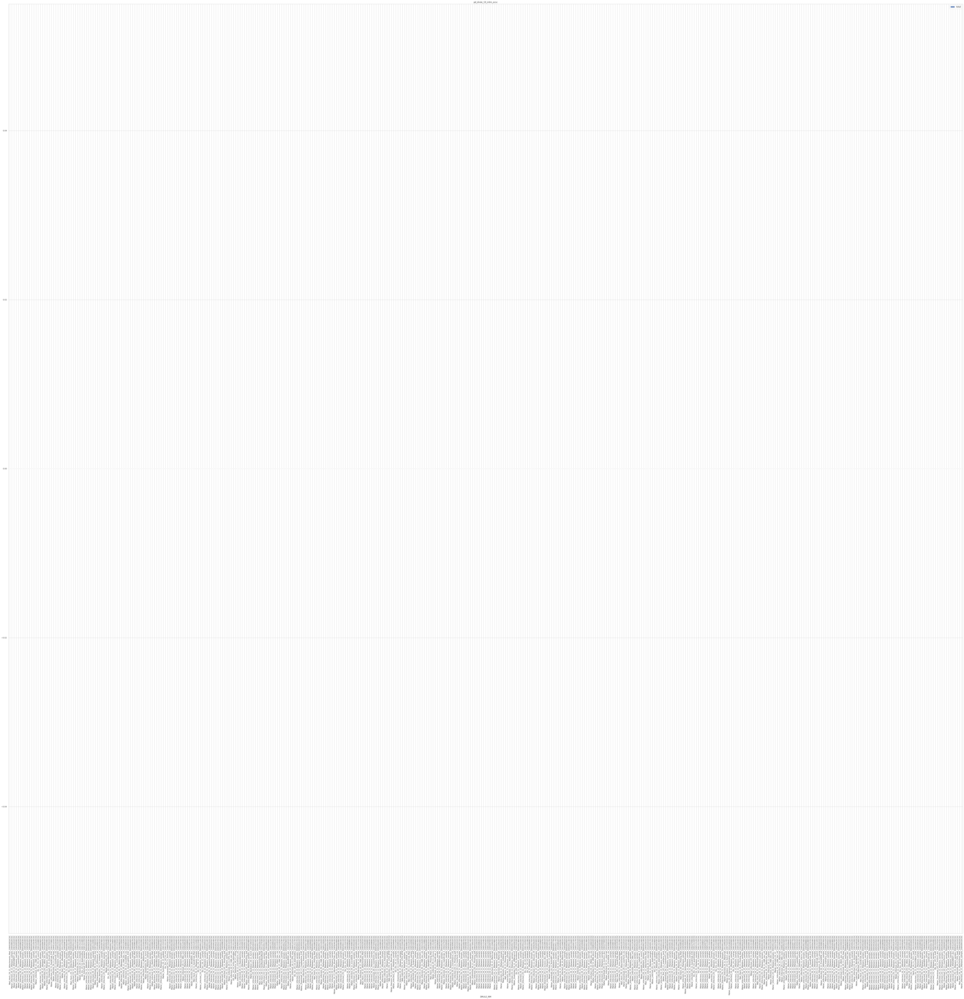

In [258]:
#MTM 19년 탐지규칙 데이터 가져오기

MTM_1month={
    'size' : 100,
    "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
    'query': {
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"1"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2019-01-01T00:00:00.625+09:00",
                        "lt":"2020-01-01T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
    
     "sort":[{
                "_id":"asc"
            }]
}
            

res = es.search(index = 'ts_mtm_detect_rule', body=MTM_1month)


data_data_19_19_mtm_ecsc = res['hits']['hits']




total = res['hits']['total']

print(total)

drule_19_mtm_ecsc = []
for da in data_data_19_19_mtm_ecsc:
    att_type = da['_source']
    drule_19_mtm_ecsc.append(att_type)

tot_len = len(res["hits"]["hits"])
nxt = res["hits"]["hits"][-1]["sort"][0]

print(total)

while(tot_len != total):
    body = {
        "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
        "search_after": [nxt],
         'size' : 100,
         'query':{
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"1"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2019-01-01T00:00:00.625+09:00",
                        "lt":"2020-01-01T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
            "sort":[{
                "_id":"asc"
            }]
         }
    
    res = es.search(index = 'ts_mtm_detect_rule', body=body)
    data_data_19_19_mtm_ecsc = res['hits']['hits']
    for da in data_data_19_19_mtm_ecsc:
        att_type = da['_source']
        drule_19_mtm_ecsc.append(att_type)
        
    tot_len += len(res["hits"]["hits"])
#     print( res["hits"]["hits"])
    nxt = res["hits"]["hits"][-1]["sort"][0]
    print(res["hits"]["hits"][-1]["sort"])
    print(tot_len)
        
pd_drule_19_mtm_ecsc = pd.DataFrame.from_dict(drule_19_mtm_ecsc)

print(pd_drule_19_mtm_ecsc)

unique_sums=[]
for k in pd_drule_19_mtm_ecsc.values:
    unique_sums.append(pd_threat_2020.loc[pd_threat_2020['DRULE_NM']==k[0], 'TW_DETECT_CNT'].sum())
pd_drule_19_mtm_ecsc['total']=unique_sums
ax=pd_drule_19_mtm_ecsc.plot.bar(x='DRULE_NM',y='total', rot=90, figsize=(100, 100))
plt.legend(fontsize='12', loc='upper right')
ax.set_title("pd_drule_19_mtm_ecsc")

# 2019년 ECSC MTM탐지규칙명과 개수를 보여줌
# 2019년에 만들어진 탐지규칙이지만, 탐지 건수는 0건, 즉 탐지를 아직 하지 못한 탐지규칙임

# MTM탐지규칙 20년 (ECSC)과 대응현황

In [162]:
#MTM 20년 탐지규칙 데이터 가져오기

MTM_2months={
    'size' : 100,
    "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
    'query': {
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"1"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2020-01-01T00:00:00.625+09:00",
                        "lt":"2020-10-31T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
    
     "sort":[{
                "_id":"asc"
            }]
}
            

res = es.search(index = 'ts_mtm_detect_rule', body=MTM_2months)


data_data_20_20_mtm_ecsc = res['hits']['hits']




total = res['hits']['total']

print(total)

drule_20_mtm_ecsc = []
for da in data_data_20_20_mtm_ecsc:
    att_type = da['_source']
    drule_20_mtm_ecsc.append(att_type)

tot_len = len(res["hits"]["hits"])
nxt = res["hits"]["hits"][-1]["sort"][0]

while(tot_len != total):
    body = {
        "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
        "search_after": [nxt],
         'size' : 100,
         'query':{
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"1"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2020-01-01T00:00:00.625+09:00",
                        "lt":"2020-10-31T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
            "sort":[{
                "_id":"asc"
            }]
         }
    
    res = es.search(index = 'ts_mtm_detect_rule', body=body)
    data_data_20_20_mtm_ecsc = res['hits']['hits']
    for da in data_data_20_20_mtm_ecsc:
        att_type = da['_source']["DRULE_ATT_TYPE_CODE1"]
        drule_20_mtm_ecsc.append(att_type)
        
    tot_len += len(res["hits"]["hits"])
    nxt = res["hits"]["hits"][-1]["sort"][0]
    print(tot_len)
        
pd_drule_20_mtm_ecsc = pd.DataFrame.from_dict(drule_20_mtm_ecsc)

print(pd_drule_20_mtm_ecsc)

unique_sums=[]
for k in pd_drule_20_mtm_ecsc.values:
    unique_sums.append(pd_threat_2020.loc[pd_threat_2020['DRULE_NM']==k[0], 'TW_DETECT_CNT'].sum())
pd_drule_20_mtm_ecsc['total']=unique_sums

ax=pd_drule_20_mtm_ecsc.plot.bar(x='DRULE_NM',y='total', rot=90)
plt.legend(fontsize='12', loc='upper right')
ax.set_title("pd_drule_20_mtm_ecsc")

# 2020년 ECSC MTM탐지규칙명과 개수를 보여줌

0


IndexError: list index out of range

# MTM 18년 탐지규칙에 대한 pie plot(ECSC)

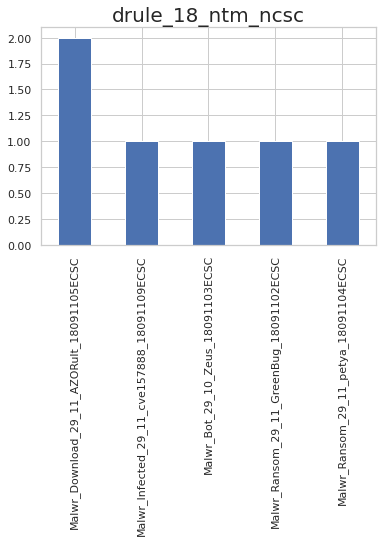

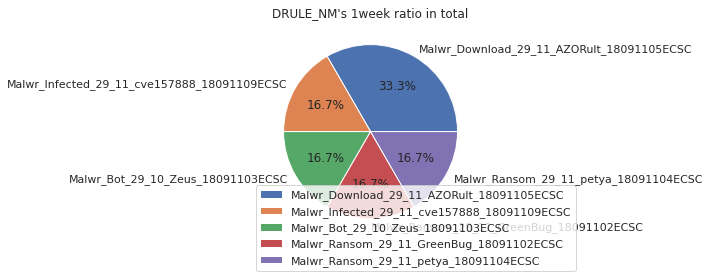

In [163]:
# #MTM 18년 데이터의 탐지규칙의 탐지규칙명에 대한 pie plot
# DETECTNAME_week=pd_drule_18_mtm_ecsc['DRULE_NM'].value_counts()


# DETECTNAME_week.plot(kind='bar')
# plt.title('drule_18_mtm_ecsc', fontsize=20)
# plt.show()

# df_DETECTNAME_week=pd.DataFrame([DETECTNAME_week])
# feature_index=DETECTNAME_week.index
# plt.plot(aspect='auto', figsize=(7,5), legend=True, explode=(0.1,0,0,0))
# plt.pie(DETECTNAME_week, labels=feature_index, autopct='%1.1f%%')
# plt.legend(feature_index, bbox_to_anchor=(1,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
# plt.title('DRULE_NM\'s 1week ratio in total')
# plt.show()

# MTM 19년 탐지규칙에 대한 pie plot(ECSC)

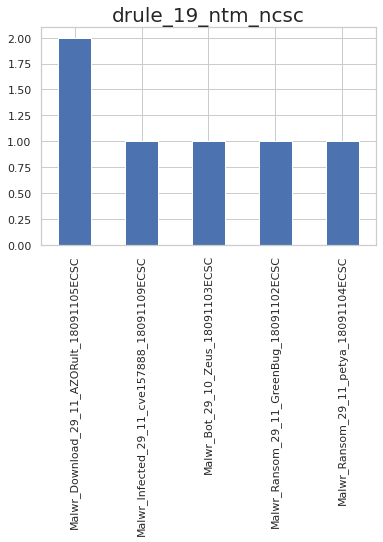

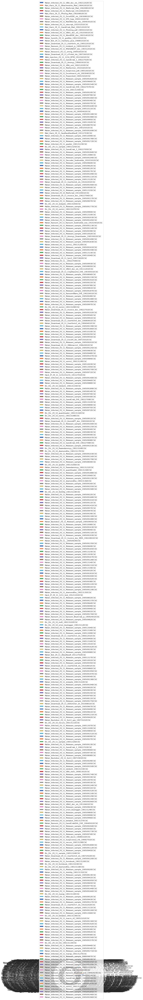

In [164]:
# #MTM 19년 데이터의 탐지규칙의 탐지규칙명에 대한 pie plot

# DETECTNAME_1month=pd_drule_19_mtm_ecsc['DRULE_NM'].value_counts()

# DETECTNAME_week.plot(kind='bar')
# plt.title('drule_19_mtm_ecsc', fontsize=20)
# plt.show()

# df_DETECTNAME_1month=pd.DataFrame([DETECTNAME_1month])
# feature_index=DETECTNAME_1month.index
# plt.plot(aspect='auto', figsize=(7,5), legend=True, explode=(0.1,0,0,0))
# plt.pie(DETECTNAME_1month, labels=feature_index, autopct='%1.1f%%')
# plt.legend(feature_index, bbox_to_anchor=(1,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
# plt.title('DRULE_NM\'s 1month ratio in total')
# plt.show()

# MTM 20년 탐지규칙에 대한 pie plot(ECSC)

In [166]:
# #MTM 20년 데이터의 탐지규칙의 탐지규칙명에 대한 pie plot

# DETECTNAME_week=pd_drule_20_mtm_ecsc['DRULE_NM'].value_counts()

# DETECTNAME_week.plot(kind='bar')
# plt.title('drule_20_mtm_ecsc', fontsize=20)
# plt.show()

# df_DETECTNAME_2months=pd.DataFrame([DETECTNAME_2months])
# feature_index=DETECTNAME_2months.index
# plt.plot(aspect='auto', figsize=(7,5), legend=True, explode=(0.1,0,0,0))
# plt.pie(DETECTNAME_2months, labels=feature_index, autopct='%1.1f%%')
# plt.legend(feature_index, bbox_to_anchor=(1,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
# plt.title('DRULE_NM\'s 2months ratio in total')
# plt.show()

NameError: name 'pd_drule_20_mtm_ecsc' is not defined

# MTM탐지규칙 18년 (NCSC)과 대응현황

116
116
                DRULE_NM DRULE_ATT_TYPE_CODE1
0    yara_pkg_1808160002                 ncsc
1    yara_pkg_1808060002                 ncsc
2    yara_pkg_1801300001                 ncsc
3    yara_pkg_1811290001                 ncsc
4    yara_pkg_1810230001                 ncsc
..                   ...                  ...
111  yara_pkg_1811060001                 ncsc
112  yara_pkg_1802180002                 ncsc
113  yara_pkg_1802180001                 ncsc
114  yara_pkg_1808210001                 ncsc
115  yara_pkg_1802180004                 ncsc

[116 rows x 2 columns]


Text(0.5, 1.0, 'pd_drule_18_mtm_ncsc')

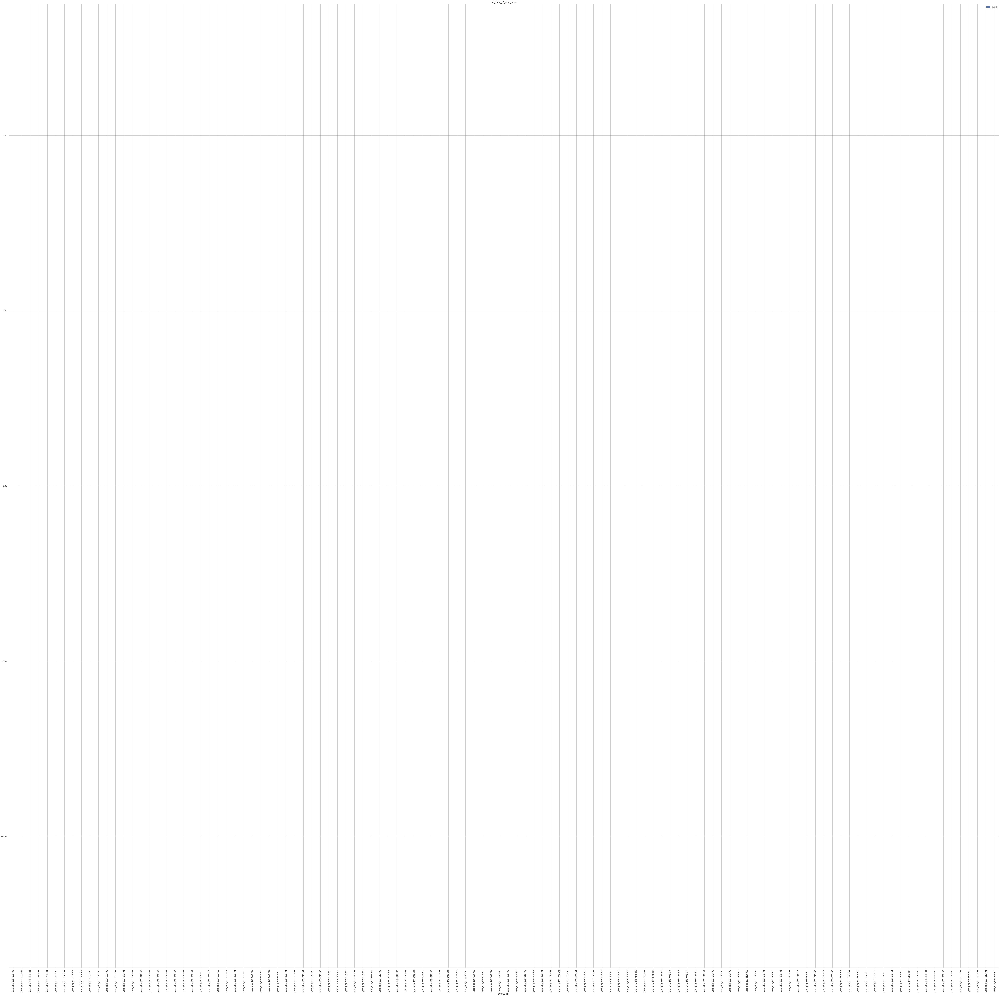

In [260]:
#MTM 18년 탐지규칙 데이터 가져오기

MTM_body_week={
    'size' : 100,
    "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
    'query': {
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"0"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2018-01-01T00:00:00.625+09:00",
                        "lt":"2019-01-01T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
    
     "sort":[{
                "_id":"asc"
            }]
}            

res = es.search(index = 'ts_mtm_detect_rule', body=MTM_body_week)


data_data_18_18_mtm_ncsc = res['hits']['hits']




total = res['hits']['total']

print(total)

drule_18_mtm_ncsc = []
for da in data_data_18_18_mtm_ncsc:
    att_type = da['_source']
    drule_18_mtm_ncsc.append(att_type)

tot_len = len(res["hits"]["hits"])
nxt = res["hits"]["hits"][-1]["sort"][0]

while(tot_len != total):
    body = {
        "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
        "search_after": [nxt],
         'size' : 100,
         'query':{
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"0"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2018-01-01T00:00:00.625+09:00",
                        "lt":"2019-01-01T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
            "sort":[{
                "_id":"asc"
            }]
         }
    
    res = es.search(index = 'ts_mtm_detect_rule', body=body)
    data_data_18_18_mtm_ncsc = res['hits']['hits']
    for da in data_data_18_18_mtm_ncsc:
        att_type = da['_source']
        drule_18_mtm_ncsc.append(att_type)
        
    tot_len += len(res["hits"]["hits"])
    nxt = res["hits"]["hits"][-1]["sort"][0]
    print(tot_len)
        
pd_drule_18_mtm_ncsc = pd.DataFrame.from_dict(drule_18_mtm_ncsc)

print(pd_drule_18_mtm_ncsc)




unique_sums=[]
for k in pd_drule_18_mtm_ncsc.values:
    unique_sums.append(pd_threat_2020.loc[pd_threat_2020['DRULE_NM']==k[0], 'TW_DETECT_CNT'].sum())
pd_drule_18_mtm_ncsc['total']=unique_sums

ax=pd_drule_18_mtm_ncsc.plot.bar(x='DRULE_NM',y='total', rot=90, figsize=(100,100))
plt.legend(fontsize='12', loc='upper right')
ax.set_title("pd_drule_18_mtm_ncsc")

# 2018년 NCSC MTM탐지규칙명과 개수를 보여줌
# 2018년에 만들어진 탐지규칙이지만, 탐지 건수는 0건, 즉 탐지를 아직 하지 못한 탐지규칙임

# MTM탐지규칙 19년 (NCSC)과 대응현황

17
               DRULE_NM DRULE_ATT_TYPE_CODE1
0   yara_pkg_1901090001                 ncsc
1   yara_pkg_1901290001                 ncsc
2   yara_pkg_1901290002                 ncsc
3   yara_pkg_1902110002                 ncsc
4   yara_pkg_1902110001                 ncsc
5   yara_pkg_1901250002                 ncsc
6   yara_pkg_1901250001                 ncsc
7   yara_pkg_1902080001                 ncsc
8   yara_pkg_1905290002                 ncsc
9   yara_pkg_1905290001                 ncsc
10  yara_pkg_1901070003                 ncsc
11  yara_pkg_1901070001                 ncsc
12  yara_pkg_1901070002                 ncsc
13  yara_pkg_1901080001                 ncsc
14  yara_pkg_1906100002                 ncsc
15  yara_pkg_1906100003                 ncsc
16  yara_pkg_1903040001                 ncsc


Text(0.5, 1.0, 'pd_drule_19_mtm_ncsc')

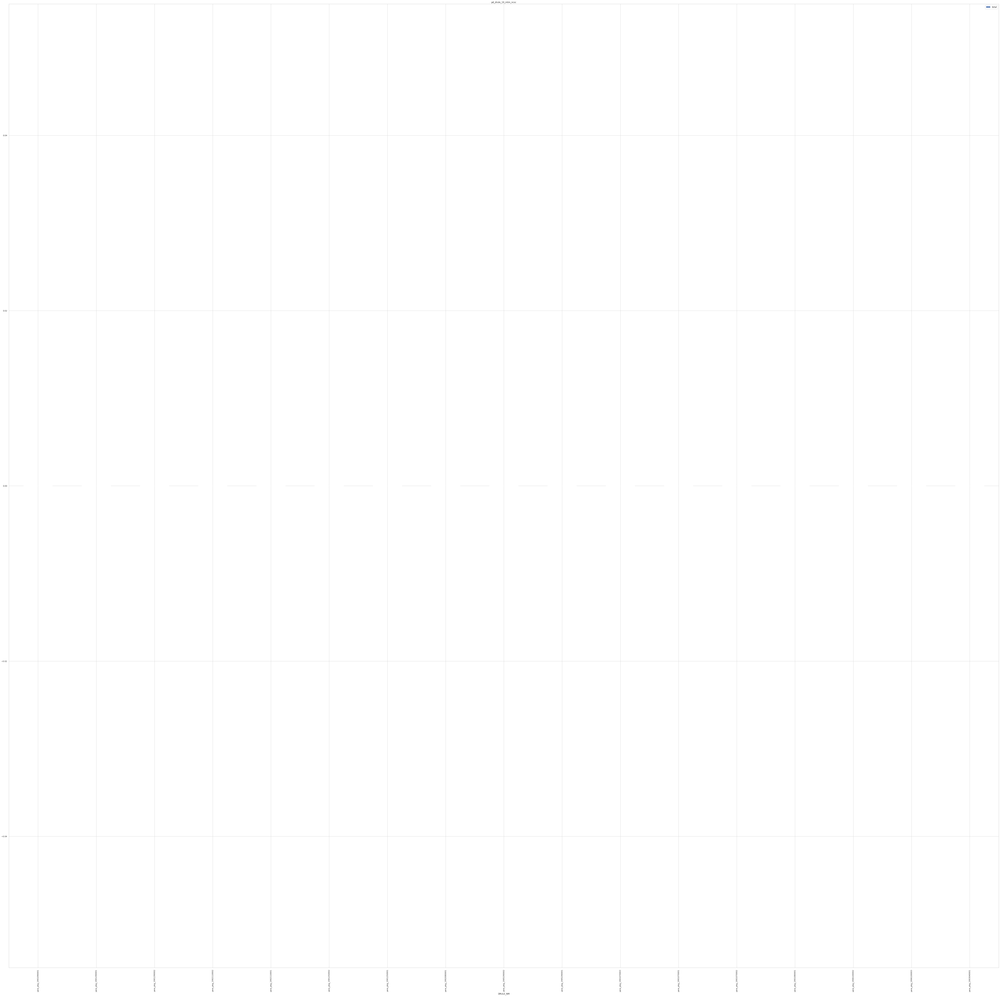

In [261]:
#MTM 19년 탐지규칙 데이터 가져오기

MTM_1month={
    'size' : 100,
    "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
    'query': {
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"0"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2019-01-01T00:00:00.625+09:00",
                        "lt":"2020-01-01T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
    
     "sort":[{
                "_id":"asc"
            }]
}
            

res = es.search(index = 'ts_mtm_detect_rule', body=MTM_1month)


data_data_19_19_mtm_ncsc = res['hits']['hits']




total = res['hits']['total']

print(total)

drule_19_mtm_ncsc = []
for da in data_data_19_19_mtm_ncsc:
    att_type = da['_source']
    drule_19_mtm_ncsc.append(att_type)

tot_len = len(res["hits"]["hits"])
nxt = res["hits"]["hits"][-1]["sort"][0]

while(tot_len != total):
    body = {
        "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
        "search_after": [nxt],
         'size' : 100,
         'query':{
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"0"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2019-01-01T00:00:00.625+09:00",
                        "lt":"2020-01-01T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
            "sort":[{
                "_id":"asc"
            }]
         }
    
    res = es.search(index = 'ts_mtm_detect_rule', body=body)
    data_data_19_19_mtm_ncsc = res['hits']['hits']
    for da in data_data_19_19_mtm_ncsc:
        att_type = da['_source']
        drule_19_mtm_ncsc.append(att_type)
        
    tot_len += len(res["hits"]["hits"])
    nxt = res["hits"]["hits"][-1]["sort"][0]
    print(tot_len)
        
pd_drule_19_mtm_ncsc = pd.DataFrame.from_dict(drule_19_mtm_ncsc)

print(pd_drule_19_mtm_ncsc)





unique_sums=[]
for k in pd_drule_19_mtm_ncsc.values:
    unique_sums.append(pd_threat_2020.loc[pd_threat_2020['DRULE_NM']==k[0], 'TW_DETECT_CNT'].sum())
pd_drule_19_mtm_ncsc['total']=unique_sums

ax=pd_drule_19_mtm_ncsc.plot.bar(x='DRULE_NM',y='total', rot=90, figsize=(100,100))
plt.legend(fontsize='12', loc='upper right')
ax.set_title("pd_drule_19_mtm_ncsc")


# 2019년 NCSC MTM탐지규칙명과 개수를 보여줌
# 2019년에 만들어진 탐지규칙이지만, 탐지 건수는 0건, 즉 탐지를 아직 하지 못한 탐지규칙임

# MTM탐지규칙 20년 (NCSC)과 대응현황

In [169]:
#MTM 20년 탐지규칙 데이터 가져오기

MTM_2months={
    'size' : 100,
    "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
    'query': {
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"0"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2020-01-01T00:00:00.625+09:00",
                        "lt":"2020-10-31T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
    
     "sort":[{
                "_id":"asc"
            }]
}
            

res = es.search(index = 'ts_mtm_detect_rule', body=MTM_2months)
data_data_20_20_mtm_ncsc = res['hits']['hits']




total = res['hits']['total']

print(total)

drule_20_mtm_ncsc = []
for da in data_data_20_20_mtm_ncsc:
    att_type = da['_source']
    drule_20_mtm_ncsc.append(att_type)

tot_len = len(res["hits"]["hits"])
nxt = res["hits"]["hits"][-1]["sort"][0]

while(tot_len != total):
    body = {
        "_source":["DRULE_NM","DRULE_ATT_TYPE_CODE1"],
        "search_after": [nxt],
         'size' : 100,
         'query':{
        "bool":{
            "must":[
                {"term":{"DRULE_INST":"0"}},
                {'range':{
                    'DRULE_MK_DT':{
                        "gte":"2020-01-01T00:00:00.625+09:00",
                        "lt":"2020-10-31T00:00:00.625+09:00"
                    }
                }
                }
            ]
        }
    },
            "sort":[{
                "_id":"asc"
            }]
         }
    
    res = es.search(index = 'ts_mtm_detect_rule', body=body)
    data_data_20_20_mtm_ncsc = res['hits']['hits']
    for da in data_data_20_20_mtm_ncsc:
        att_type = da['_source']
        drule_20_mtm_ncsc.append(att_type)
        
    tot_len += len(res["hits"]["hits"])
    nxt = res["hits"]["hits"][-1]["sort"][0]
    print(tot_len)
        
pd_drule_20_mtm_ncsc = pd.DataFrame.from_dict(drule_20_mtm_ncsc)

print(pd_drule_20_mtm_ncsc)





unique_sums=[]
for k in pd_drule_20_mtm_ncsc.values:
    unique_sums.append(pd_threat_2020.loc[pd_threat_2020['DRULE_NM']==k[0], 'TW_DETECT_CNT'].sum())
pd_drule_20_mtm_ncsc['total']=unique_sums

ax=pd_drule_20_mtm_ncsc.plot.bar(x='DRULE_NM',y='total', rot=90, figsize=(100,100))
plt.legend(fontsize='12', loc='upper right')
ax.set_title("pd_drule_20_mtm_ncsc")

# 2020년 NCSC MTM탐지규칙명과 개수를 보여줌


0


IndexError: list index out of range

# MTM 18년 탐지규칙에 대한 pie plot(NCSC)

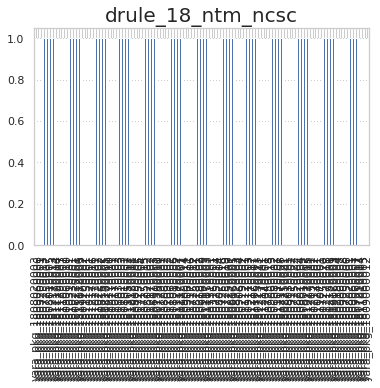

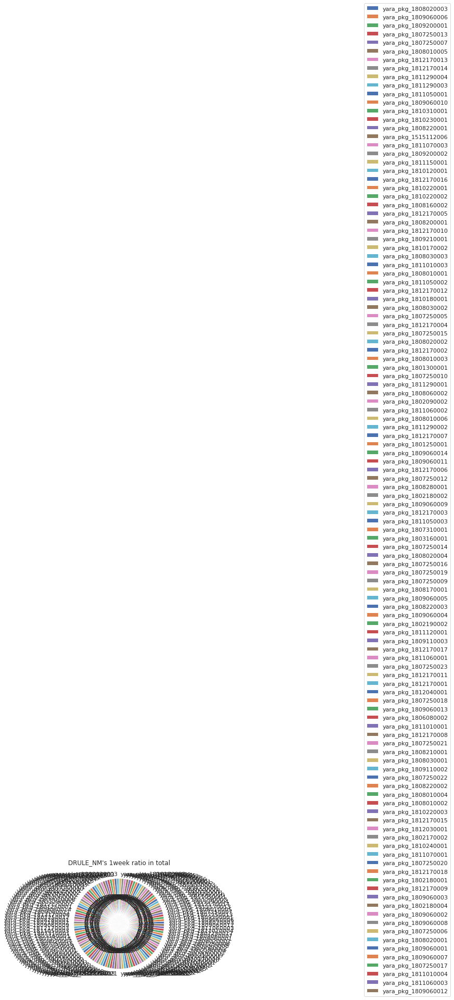

In [173]:
# #MTM 18년 데이터의 탐지규칙의 탐지규칙명에 대한 pie plot
# DETECTNAME_week=pd_drule_18_mtm_ncsc['DRULE_NM'].value_counts()

# DETECTNAME_week.plot(kind='bar')
# plt.title('drule_18_ntm_ncsc', fontsize=20)
# plt.show()

# df_DETECTNAME_week=pd.DataFrame([DETECTNAME_week])
# feature_index=DETECTNAME_week.index
# plt.plot(aspect='auto', figsize=(7,5), legend=True, explode=(0.1,0,0,0))
# plt.pie(DETECTNAME_week, labels=feature_index, autopct='%1.1f%%')
# plt.legend(feature_index, bbox_to_anchor=(2,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
# plt.title('DRULE_NM\'s 1week ratio in total')
# plt.show()

# MTM 19년 탐지규칙에 대한 pie plot(NCSC)

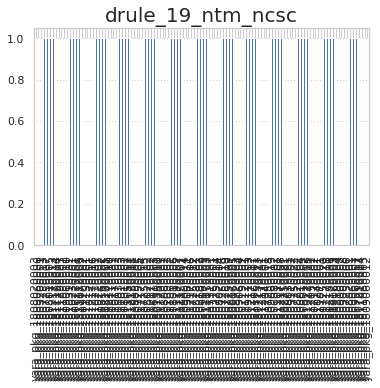

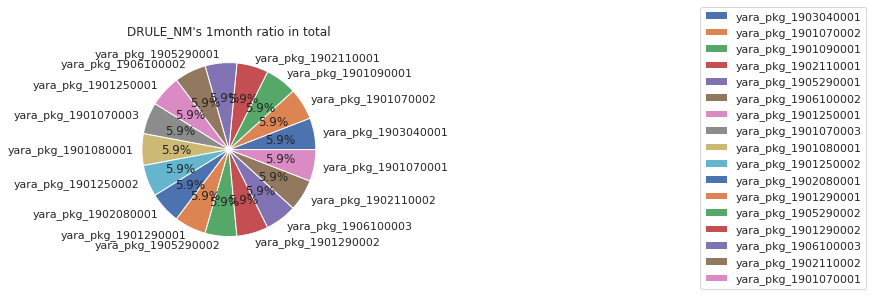

In [174]:
# #MTM 19년 데이터의 탐지규칙의 탐지규칙명에 대한 pie plot

# DETECTNAME_1month=pd_drule_19_mtm_ncsc['DRULE_NM'].value_counts()

# DETECTNAME_week.plot(kind='bar')
# plt.title('drule_19_ntm_ncsc', fontsize=20)
# plt.show()

# df_DETECTNAME_1month=pd.DataFrame([DETECTNAME_1month])
# feature_index=DETECTNAME_1month.index
# plt.plot(aspect='auto', figsize=(7,5), legend=True, explode=(0.1,0,0,0))
# plt.pie(DETECTNAME_1month, labels=feature_index, autopct='%1.1f%%')
# plt.legend(feature_index, bbox_to_anchor=(2,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
# plt.title('DRULE_NM\'s 1month ratio in total')
# plt.show()

# MTM 20년 탐지규칙에 대한 pie plot(NCSC)

In [175]:
# #MTM 20년 데이터의 탐지규칙의 탐지규칙명에 대한 pie plot

# DETECTNAME_2months=pd_drule_20_mtm_ncsc['DRULE_NM'].value_counts()

# DETECTNAME_week.plot(kind='bar')
# plt.title('drule_20_ntm_ncsc', fontsize=20)
# plt.show()

# df_DETECTNAME_2months=pd.DataFrame([DETECTNAME_2months])
# feature_index=DETECTNAME_2months.index
# plt.plot(aspect='auto', figsize=(7,5), legend=True, explode=(0.1,0,0,0))
# plt.pie(DETECTNAME_2months, labels=feature_index, autopct='%1.1f%%')
# plt.legend(feature_index, bbox_to_anchor=(2,0),loc='lower right', bbox_transform=plt.gcf().transFigure)
# plt.title('DRULE_NM\'s 2months ratio in total')
# plt.show()

NameError: name 'pd_drule_20_mtm_ncsc' is not defined

요청건 : 18/19/20 각 년도별 개발된 패턴 탐지/대응 현황(각 년도별 데이터가 방대하여 작업 불가하므로 1주,1달,2달,3달로 작업 수행함)

# NTM/MTM별 기간(1주,1달,2달,3달)별 위협경보모니터링 불러오기

In [ ]:
## 기간별(1주일,1달,2달,3달)로 NTM과 NTM데이터를 위협경보모니터링(ts_data_threat-2020)에서 가져옴

#GEAR_TYPE이 0이면 NTM, 1이면 MTM
ntm_data_week = pd_att_type_week[pd_att_type_week.GEAR_TYPE.isin(['0'])]
mtm_data_week = pd_att_type_week[pd_att_type_week.GEAR_TYPE.isin(['1'])]

ntm_data_month = pd_att_type_month[pd_att_type_month.GEAR_TYPE.isin(['0'])]
mtm_data_month = pd_att_type_month[pd_att_type_month.GEAR_TYPE.isin(['1'])]

ntm_data_2months=pd_att_type_2months[pd_att_type_2months.GEAR_TYPE.isin(['0'])]
mtm_data_2months=pd_att_type_2months[pd_att_type_2months.GEAR_TYPE.isin(['1'])]

ntm_data_3months=pd_att_type_3months[pd_att_type_3months.GEAR_TYPE.isin(['0'])]
mtm_data_3months=pd_att_type_3months[pd_att_type_3months.GEAR_TYPE.isin(['1'])]

ntm_total_period=dict({'1week_ntm':ntm_data_week,'month_ntm':ntm_data_month,'2months_ntm':ntm_data_2months, '3months_ntm':ntm_data_3months})

mtm_total_period=dict({'1week_mtm':mtm_data_week,'month_mtm':mtm_data_month,'2months_mtm':mtm_data_2months, '3months_mtm':mtm_data_3months})

In [177]:
ntm_table=pd.DataFrame()
mtm_table=pd.DataFrame()

# NTM탐지규칙명에 대한 위협경보 탐지건수 기간별 bar plot

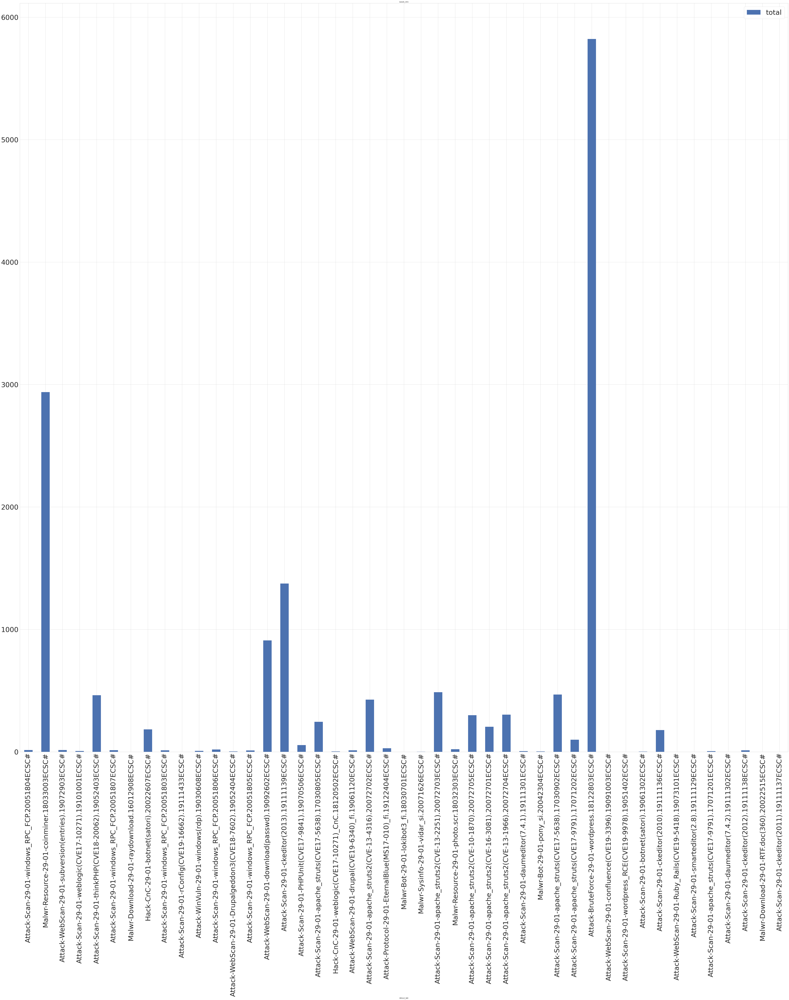

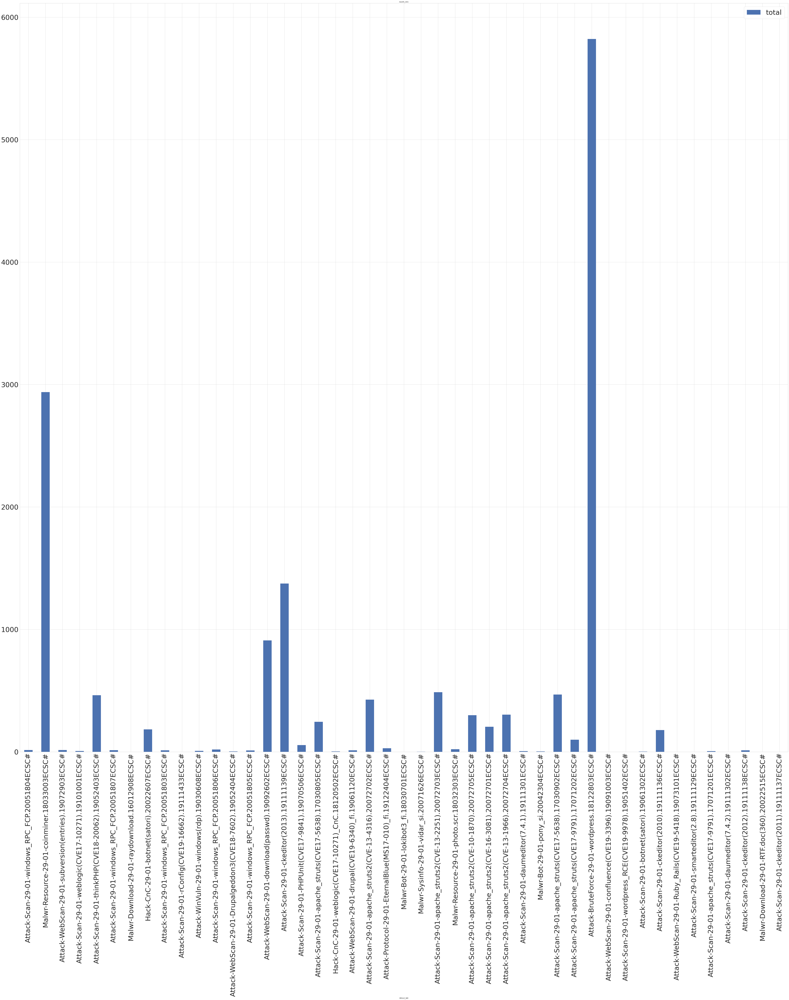

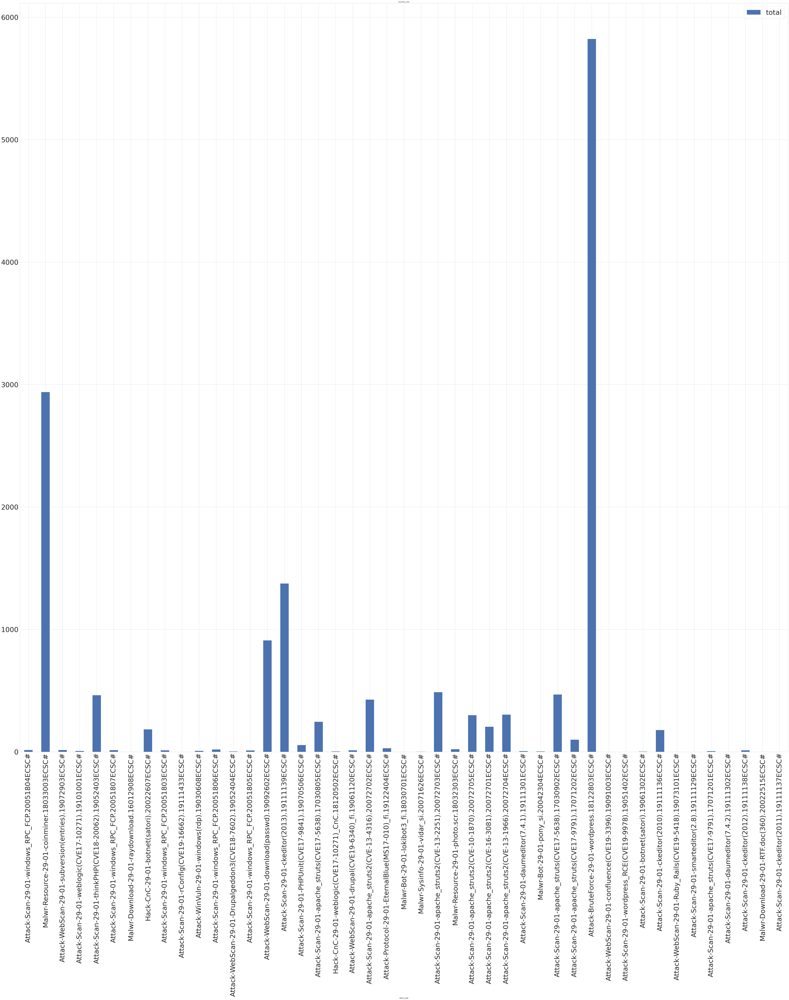

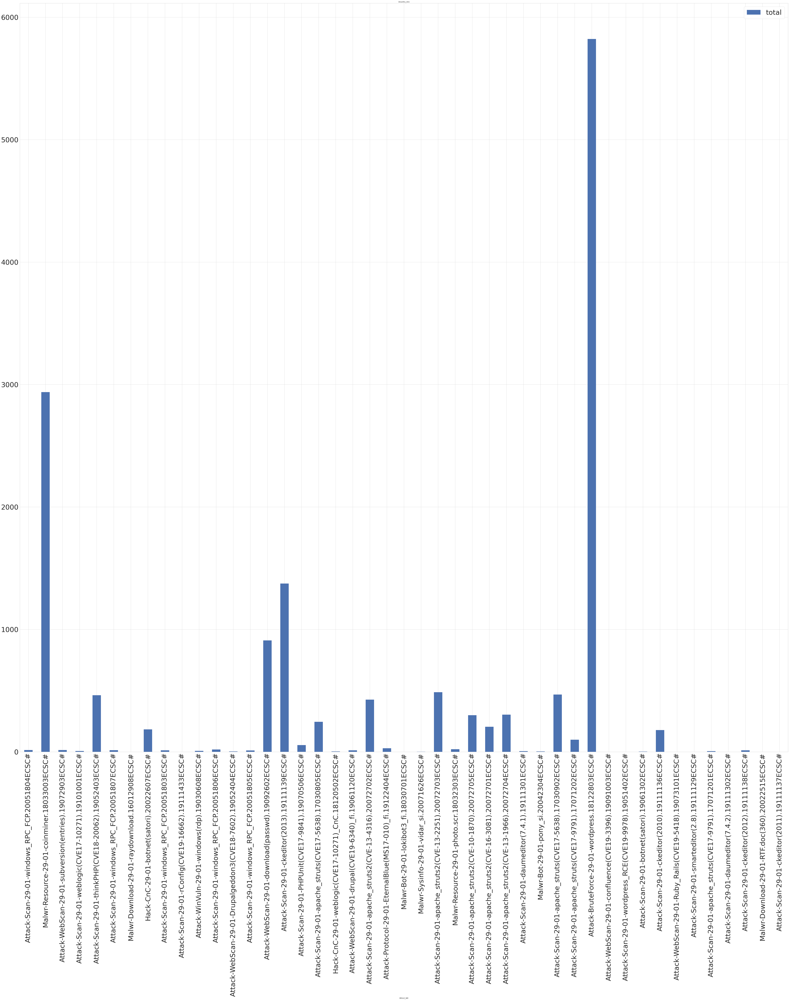

In [286]:
## 기간별(1주일,1달,2달,3달)로 어떤 탐지규칙명이 얼마나 많이 탐지했는지 보여줌

#1. 위협경보 데이터에서 위협경보 탐지건수와 탐지규칙명을 가져온 다음 중복 제거함
for key,value in ntm_total_period.items():
    DETECTCNT_DRULE_NM=value.loc[:,['TW_DETECT_CNT','DRULE_NM']]
    DETECTCNT_DRULE_NM_unique=DETECTCNT_DRULE_NM.loc[:,['DRULE_NM']].drop_duplicates()
    
    #2. 중복제거한 탐지규칙명에 해당하는 탐지건수의 개수를 셈
    unique_sums=[]
    for k in DETECTCNT_DRULE_NM_unique.values:
        unique_sums.append(DETECTCNT_DRULE_NM.loc[DETECTCNT_DRULE_NM['DRULE_NM']==k[0], 'TW_DETECT_CNT'].sum())
        #3. 2의 합계를 total에 표시함
    DETECTCNT_DRULE_NM_unique['total']=unique_sums

    ax=DETECTCNT_DRULE_NM_unique.plot.bar(x='DRULE_NM',y='total', rot=90, figsize=(100,100),fontsize='50')
    plt.legend(fontsize='50', loc='upper right')
    ax.set_title(key)

# MTM탐지규칙명에 대한 위협경보 탐지건수 기간별 bar plot

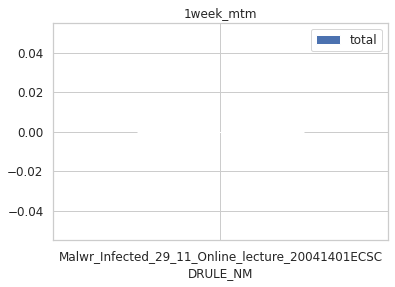

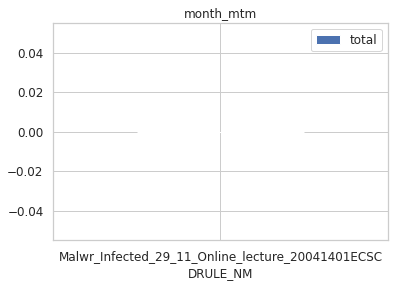

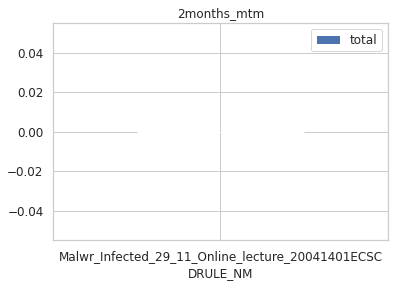

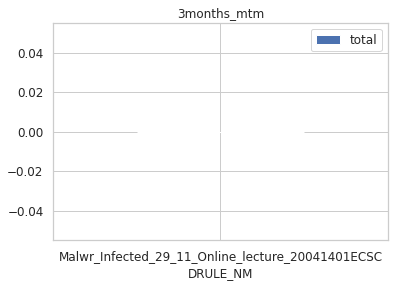

In [266]:
for key,value in mtm_total_period.items():
    DETECTCNT_DRULE_NM=value.loc[:,['TW_DETECT_CNT','DRULE_NM']]
    DETECTCNT_DRULE_NM_unique=DETECTCNT_DRULE_NM.loc[:,['DRULE_NM']].drop_duplicates()
    
    unique_sums=[]
    for k in DETECTCNT_DRULE_NM_unique.values:
        unique_sums.append(DETECTCNT_DRULE_NM.loc[DETECTCNT_DRULE_NM['DRULE_NM']==k[0], 'TW_DETECT_CNT'].sum())
    DETECTCNT_DRULE_NM_unique['total']=unique_sums
    ax=DETECTCNT_DRULE_NM_unique.plot.bar(x='DRULE_NM',y='total', rot=0, fontsize='12')
    plt.legend(fontsize='12', loc='upper right')
    ax.set_title(key)

# NTM기간별(1주일,1달,2달,3달) 탐지규칙명에 대한 탐지건수 추이 stack plot

In [ ]:
# period_numpy=ntm_table['period'].values
# print(period_numpy)
# total_numpy=ntm_table['total'].values
# print((total_numpy))
# print((period_numpy))
# print(type(total_numpy))

# fig, ax = plt.subplots(figsize=(5, 3))
# ax.stackplot(period_numpy[0], total_numpy, labels=['DRULE_NM', 'TW_DETECT_CNT'])
# ax.legend(loc='upper left')
# ax.set_ylabel('Total debt')
# ax.set_xlim(xmin=period_numpy[0][0], xmax=period_numpy[0][-1])
# fig.tight_layout()

# MTM기간별(1주일,1달,2달,3달) 탐지규칙명에 대한 탐지건수 추이 stack plot

In [ ]:
# period_numpy=mtm_table['period'].values
# print(period_numpy)
# total_numpy=mtm_table['total'].values
# print((total_numpy))
# print((period_numpy))
# print(type(total_numpy))

# fig, ax = plt.subplots(figsize=(5, 3))
# ax.stackplot(period_numpy[0], total_numpy, labels=['DRULE_NM', 'TW_DETECT_CNT'])
# ax.legend(loc='upper left')
# ax.set_ylabel('Total debt')
# ax.set_xlim(xmin=period_numpy[0][0], xmax=period_numpy[0][-1])
# fig.tight_layout()

In [ ]:
from matplotlib import pyplot

# 요청건 : 등록된 자산유형별 침해 유형별 위협이벤트 현황

# 기간별(1주일,1달,2달,3달) 공격의도별 자산 plot

In [180]:



ASSETS_RISKmaxValue=pd.DataFrame(index=range(0, 4),columns=['other','Malwr','Web','Hack','DDos','Attack','Mail'])

ASSETS_RISKmaxValue.index=['1week','1month','2months','3months']
ASSETS_RISKmaxValue=ASSETS_RISKmaxValue.fillna(0)
ASSETS_RISKmaxValue

,other,Malwr,Web,Hack,DDos,Attack,Mail
1week,0,0,0,0,0,0,0
1month,0,0,0,0,0,0,0
2months,0,0,0,0,0,0,0
3months,0,0,0,0,0,0,0


In [181]:
ASSET_TOTAL=['ASSETS_VAL_1','ASSETS_VAL_2','ASSETS_VAL_3','ASSETS_VAL_4','ASSETS_VAL_5','ASSETS_VAL_6',
                'ASSETS_VAL_7','ASSETS_VAL_8','ASSETS_VAL_9','ASSETS_VAL_10','ASSETS_VAL_11','ASSETS_VAL_12',
                'ASSETS_VAL_13','ASSETS_VAL_14','ASSETS_VAL_15','ASSETS_VAL_16','ASSETS_VAL_17','ASSETS_VAL_18',
                'ASSETS_VAL_19','ASSETS_VAL_20','ASSETS_VAL_21','ASSETS_VAL_22']

         other  Malwr  Web  Hack  DDos  Attack  Mail
1week        0      0    4  1285     1    8163     0
1month       0      0    4  1285     1    8163     0
2months      0      0    4  1285     1    8163     0
3months      0      0    4  1285     1    8163     0
         other  Malwr  Web  Hack  DDos  Attack  Mail
1week        0      0    0     0     0     210     0
1month       0      0    0     0     0     210     0
2months      0      0    0     0     0     210     0
3months      0      0    0     0     0     210     0
         other  Malwr  Web  Hack  DDos  Attack  Mail
1week        0      0    0     0     0     935     0
1month       0      0    0     0     0     935     0
2months      0      0    0     0     0     935     0
3months      0      0    0     0     0     935     0
         other  Malwr  Web  Hack  DDos  Attack  Mail
1week        0      0    0     0     0     353     0
1month       0      0    0     0     0     353     0
2months      0      0    0     0     0     353

/usr/local/lib/python3.6/dist-packages/seaborn/axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


         other  Malwr  Web  Hack  DDos  Attack  Mail
1week        0      0    0     0     0       0     0
1month       0      0    0     0     0       0     0
2months      0      0    0     0     0       0     0
3months      0      0    0     0     0       0     0


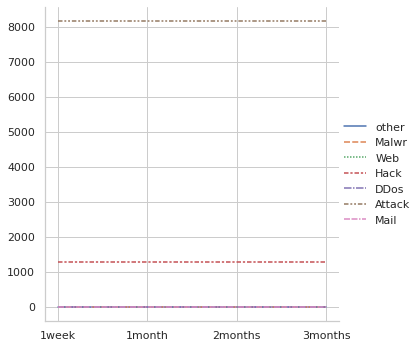

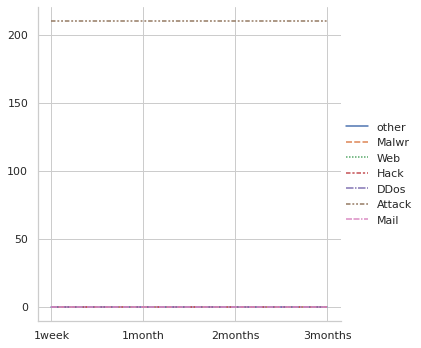

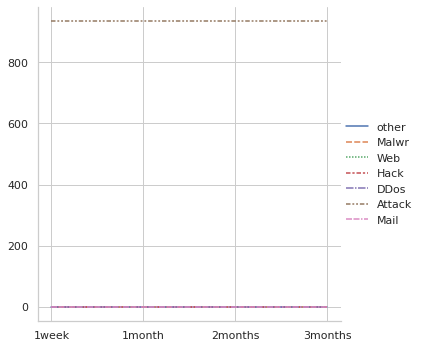

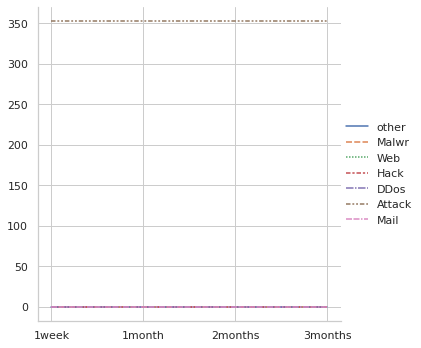

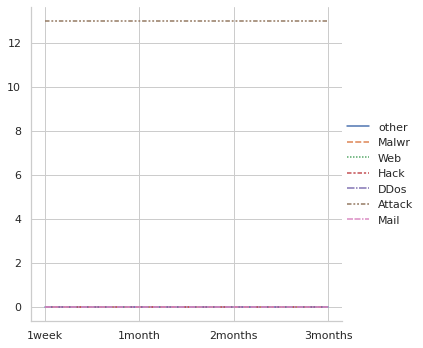

...

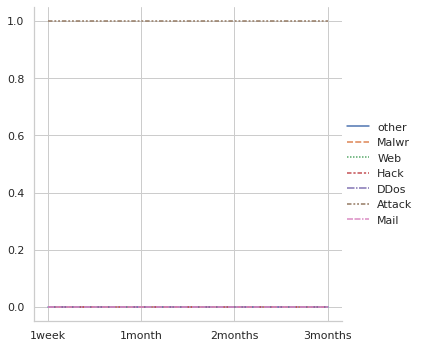

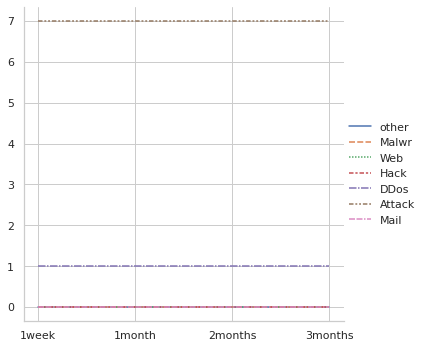

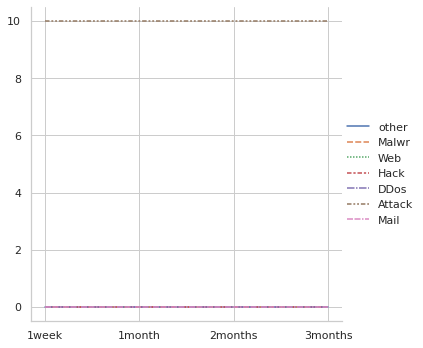

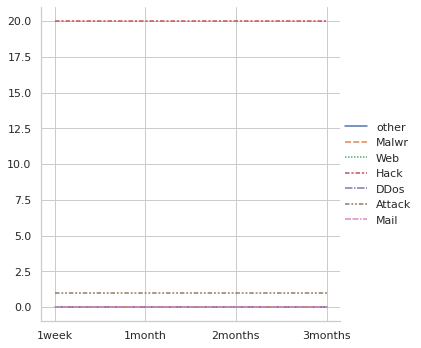

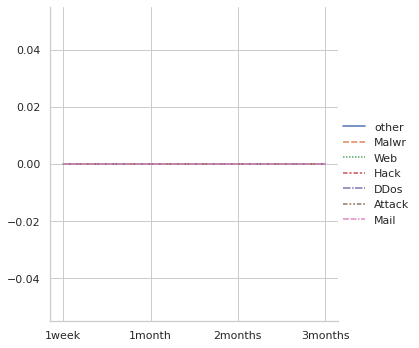

In [182]:
## 기간별(1주일,1달,2달,3달)로 어떤 공격 의도들이 각 자산들에 많이 발생했는지를 보여줌

gridsize = (11, 2)
#1. 기간별(1주일,1달,2달,3달) 위협경보모니터링 데이터 가져옴
data_4tables=[pd_att_type_week,pd_att_type_month,pd_att_type_2months,pd_att_type_3months]
for i in ASSET_TOTAL:
    #2. 공격의도별로 빈 데이터프레임 생성 후, 컬럼에 이름 지정
    ASSETS_RISKmaxValue=pd.DataFrame(index=range(0, 4),columns=['other','Malwr','Web','Hack','DDos','Attack','Mail'])
    #3. 2의 인덱스에 이름 지정
    ASSETS_RISKmaxValue.index=['1week','1month','2months','3months']
    ASSETS_RISKmaxValue=ASSETS_RISKmaxValue.fillna(0)
    for num, data in enumerate(data_4tables):
        #4. 3에서 공격의도 데이터만 가져옴
        RISK_V2=data.loc[:,'RISK_V2']
        for j in RISK_V2:
            if j[i]>0:
                RISK=[j['INTENT_VAL_0'],j['INTENT_VAL_1'],j['INTENT_VAL_2'],j['INTENT_VAL_3'],j['INTENT_VAL_4'],j['INTENT_VAL_5'],j['INTENT_VAL_6']]
                #5. 4에서 각각의 공격 의도의 개수를 셈
                max_risk=RISK.index(max(RISK))
                ASSETS_RISKmaxValue.iloc[num, max_risk]+=1
    print(ASSETS_RISKmaxValue)
    sns.relplot(data=ASSETS_RISKmaxValue, kind='line')

# 22개 자산들(공인IP 전체IP대역 (유선),	공인IP 전체IP대역 (무선),	공인IP WEB 서버,	공인IP 내부응용 서버,	공인IP DB서버,	공인IP 패치서버,	공인IP 네트워크,	공인IP 보안,	공인IP 업무용 PC,	공인IP 비업무용 PC,	공인IP 기타,	사설IP 전체IP대역 (유선),	사설IP 전체IP대역 (무선),	사설IP WEB 서버,	사설IP 내부응용 서버,	사설IP DB서버,	사설IP 패치서버,	사설IP 네트워크,	사설IP 보안,	사설IP 업무용 PC,	사설IP 비업무용PC,	사설IP 기타)에서 기간별(1주일,1달,2달,3달)로 어떤 공격 유형이 각 자산들에 많이 발생했는지를 보여줌

# 요청건 : 침해사고 재발률에 관한 통계

# 침해 사고 발생 시점 이후의 위협이벤트 출력

In [183]:
body={
    "size":200,
    'query': {
            "term" : {"ACCD_PROC_STAT_CODE":"END"}
    },
    "sort":[
         {"RISK_V2.RISK_VAL_0":{"order":"desc"}}
     ]
}
            

res = es.search(index = 'ts_data_accident-2020', body=body)
data = res['hits']['hits']

total = res['hits']['total']

print(total)

ACCD = []
for da in data:
    att_type = da['_source']
    ACCD.append(att_type)

tot_len = len(res["hits"]["hits"])
nxt = res["hits"]["hits"][-1]["sort"][0]

while(tot_len != total):
    body = {
        "search_after":[nxt],
        "size":200,
        "query": {
                "term" : {"ACCD_PROC_STAT_CODE":"END"}
        },
        "sort":[
             {"RISK_V2.RISK_VAL_0":{"order":"desc"}}
         ]
    }
    
    res = es.search(index = 'ts_data_accident-2020', body=body)
    data = res['hits']['hits']
    for da in data:
        att_type = da['_source']
        ACCD.append(att_type)
        
    tot_len += len(res["hits"]["hits"])
    try:
        nxt = res["hits"]["hits"][-1]["sort"][0]
        print(tot_len)
    except IndexError as err:
        # 아마도 RISK_V2.RISK_VAL_0 값이 NaN이라 쓰레기값으로 주는 듯함
        print("IndexError: ", err)
        break
        
ACCD = pd.DataFrame.from_dict(ACCD)

print(ACCD.head())

# 요청건
# - 침해사고 원인 파악을 위한 통계
# . 침해사고 발생한 피해 장비의 원인 파악을 위해 발생시간 이후의 위협이벤트 출력

26932
400
600
800
1000
1200
1400
1600
1800
2000
2200
2400
2600
2800
3000
3200
3400
3600
3800
4000
4200
4400
4600
4800
5000
5200
5400
5600
5800
5986
IndexError:  list index out of range
                                ACCD_RESPONSE_RESULT ACCD_PREVENT_RECURRENCE  \
0  {'SYSTEM': {'OS_CODE': 'window', 'VERSION': '1...                    None   
1  {'SYSTEM': {'OS_CODE': 'linux', 'VERSION': 'Ce...                    None   
2                           {'RESPONSE_HISTORY': ''}                    None   
3                           {'RESPONSE_HISTORY': ''}                    None   
4                           {'RESPONSE_HISTORY': ''}                    None   

  ACCD_REJECT ACCD_PROCESS_HISTORY              ACCD_TITLE ACCD_PRIORITY_CODE  \
0        None                 None    [아주대학교] 악성코드 감염-자원악용                  2   
1        None                 None  [전라남도교육청] 악성코드 감염-자원악용                  2   
2        None                 None    [한신대학교] 침입시도-프로그램취약점                  3   
3        N

# 사고데이터의 공격IP/Port, 피해IP/Port (2020년)(실 데이터에서 sort 해제 및 사이즈 조절해야함)

In [187]:

for i in ACCD.index:
    TW=ACCD.iloc[i,:]
    
    try:
        body={
            'size' : 100,
            "sort":[
                {"TW_COLLECT_DT":{"order":"asc"}}
            ],
            "query":{
                "bool":{
                    "must":[
                        {"term":{"TW_ATT_IP":TW['TW_ATT_IP']}},
                        {"term":{"TW_ATT_PORT":TW['TW_ATT_PORT']}},
                        {"term":{"TW_DMG_PORT":TW['TW_DMG_PORT']}},
                        {"term":{"TW_DMG_IP":TW['TW_DMG_IP']}},
                        {"range":{
                            "TW_COLLECT_DT":{
                                "gt":TW['ACCD_CLOSE_DT']
                            }
                        }}
                    ]
                }
            }
        }

        res = es.search(index = 'ts_data_threat-2020', body=body)

        data = res['hits']['hits']
        total = res['hits']['total']

        print(total)



        IP_PORT = []
        for da in data:
            att_type = da['_source']
            IP_PORT.append(att_type)

#         tot_len = len(res["hits"]["hits"])
#         nxt = res["hits"]["hits"][-1]["sort"][0]

#         while(tot_len != total):

#             body = {
#                 "search_after": [nxt],
#             'size' : 100,
#             "sort":[
#                 {"TW_COLLECT_DT":{"order":"asc"}}
#             ],
#             "query":{
#                 "bool":{
#                     "must":[
#                         {"term":{"TW_ATT_IP":TW['TW_ATT_IP']}},
#                         {"term":{"TW_ATT_PORT":TW['TW_ATT_PORT']}},
#                         {"term":{"TW_DMG_PORT":TW['TW_DMG_PORT']}},
#                         {"term":{"TW_DMG_IP":TW['TW_DMG_IP']}},
#                         {"range":{
#                             "TW_COLLECT_DT":{
#                                 "gt":TW['ACCD_CLOSE_DT']
#                             }
#                         }}
#                     ]
#                 }
#             }
#         }

#             res = es.search(index = 'ts_data_threat-2020', body=body)
#             data = res['hits']['hits']

#             for da in data:
#                 att_type = da['_source']
#                 IP_PORT.append(att_type)

#             tot_len += len(res["hits"]["hits"])
#             nxt = res["hits"]["hits"][-1]["sort"][0]
#             print(tot_len)

        IP_PORT_total = pd.DataFrame.from_dict(IP_PORT)

        print(IP_PORT_total.head())

    except IndexError as err:
        print("IndexError: ", err)

# 요청건
# - 침해사고 원인 파악을 위한 통계
# . 침해사고 발생한 피해 장비의 원인 파악을 위해 발생시간 이후의 위협이벤트 출력
# 2020년 침해 사고 발생 시점 이후, 공격IP와Port가 피해IP와Port와 일치하는 값 출력함

0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
1
               TW_ID    TW_ID_ORI                     _datetime  \
0  20200426163225881  -1582984025  2020-04-26T16:32:24.639+0900   

                  TW_COLLECT_DT   INST_CODE INST_NM  \
0  2020-04-26T16:31:52.000+0900  A000002584   중앙대학교   

                                          DRULE_NM GEAR_CODE  \
0  Attack-BruteForce-29-01-wordpress.18122803ECSC#  53099000   

  DRULE_ATT_TYPE_CODE1       TW_ATT_IP  ...  \
0               Attack  40.121.164.183  ...   

                                      TW_PATTERN_STR TW_DETECT_CNT  RISK  \
0  504f5354202f786d6c7270632e70687020485454502f31...             1  None   

                                             RISK_V2  POL_IS_PRESSING  \
0  {'INTENT_VAL_1': 0, 'INTENT_VAL_2': 0, 'INTENT...            False   

                                          SCEN_INFOS TW_STATE  POL_HIT_RATE2  \
0  [{'POL_CODE': 'EG5s82cBsJudN6csDeGu', 'POL_NM'...        0             10   

  TW_CTR_GUARD_NM TW_CTR_GU

0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
63
               TW_ID   TW_ID_ORI                     _datetime  \
0  20200426081503635   657085357  2020-04-26T08:15:03.339+0900   
1  20200426081503625   65

0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


1
               TW_ID   TW_ID_ORI                     _datetime  \
0  20200707083331228  -343109968  2020-07-07T08:33:30.965+0900   

                  TW_COLLECT_DT   INST_CODE   INST_NM  \
0  2020-07-07T08:32:25.000+0900  A000003030  한국외국어대학교   

                                       DRULE_NM GEAR_CODE  \
0  Malwr-Resource-29-01-coinminer.18033003ECSC#  53113000   

  DRULE_ATT_TYPE_CODE1       TW_ATT_IP  ...  POL_IS_PRESSING  \
0                Malwr  203.232.230.19  ...            False   

                                          SCEN_INFOS TW_STATE POL_HIT_RATE2  \
0  [{'POL_CODE': '-LSQg2UB436ZPXYYFt5S', 'POL_NM'...        2            67   

   TW_CTR_GUARD_NM TW_CTR_GUARD_ID TW_ANAL_WRITER_ID  \
0              김성진         cert156           cert156   

                 TW_ANAL_DT TW_ANAL_WRITER_NM TW_ANAL_INFO  
0  2020-07-08 09:50:03+0900               김성진           중복  

[1 rows x 34 columns]
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0

0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
2
               TW_ID  TW_ID_ORI                     _datetime  \
0  20200401181024589  794667312  2020-04-01T18:10:23.001+0900   
1  20200401181024407  794667312  2020-04-01T18:10:23.102+0900   

                  TW_COLLECT_DT   INST_CODE INST_NM  \
0  2020-04-01T18:01:52.000+0900  A000003191   호남대학교   
1  2020-04-01T18:02:02.000+0900  A000003191   호남대학교   

                                       DRULE_NM GEAR_CODE  \
0  Malwr-Resource-29-01-coinminer.18033003ECSC#  53127000   
1  Malwr-Resource-29-01-coinminer.18033003ECSC#  53127000   

  DRULE_ATT_TYPE_CODE1       TW_ATT_IP  ...  TW_PROTO_NM GEAR_TYPE  \
0                Malwr  222.105.249.43  ...          TCP      

0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
5
               TW_ID    TW_ID_ORI                     _datetime  \
0  20200616210041344  -1189343164  2020-06-16T21:00:34.729+0900   
1  20200622204437478    746230431  2020-06-22T20:44:33.765+0900   
2  20200625123337324   -947580190  2020-06-25T12:33:35.077+0900   
3  20200714195735290   1385052483  2020-07-14T19:57:33.152+0900   
4  20200806191847062   2023874535  2020-08-06T19:18:46.694+0900   

                  TW_COLLECT_DT   I

0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
22
               TW_ID   TW_ID_ORI                     _datetime  \
0  20200628085331654  -251779257  2020-06-28T08:53:30.866+0900   
1  20200628085331027  -251779257  2020-06-28T08:53:30.865+0900   
2  20200711052912345  1133991970  2020-07-11T05:25:27.852+0900   
3  20200711053714567  1133991970  2020-07-11T05:34:09.138+0900   
4  20200711055533384  1133991970  2020-07-11T05:52:59.630+0900   



0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
3
               TW_ID   TW_ID_ORI                     _datetime  \
0  20200712045511814   139660677  2020-07-12T04:55:11.525+0900   
1  20200715042235365  -599278584  2020-07-15T04:22:34.742+0900   
2  20200715091440124  -599278584  2020-07-15T09:14:39.850+0900   

                  TW_COLLECT_DT   INST_CODE INST_NM  \
0  2020-07-12T04:54:45.621+0900  A000000971  남서울대학교   
1  2020-07-15T04:22:08.735+0900  A000000971  남서울대학교   
2  2020-07-15T09:14:13.973+0900  A000000971  남서울대학교   

                                        DRULE_NM           GEAR_CODE  \
0  Malwr-Resource-29-01-miner(wmi).19120503ECSC#  A000000971-N-00001   
1  Malwr-Resource-29-01-miner(wmi).19120503ECSC#  A000000971-N-00001   
2  Malwr-Resource-29-01-miner(wmi).19120503ECSC#  A000000971-N-00001   

  DRULE_ATT_TYPE_CODE1 

0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
5
               TW_ID   TW_ID_ORI                     _datetime  \
0  20200405015124436  -190585036  2020-04-05T01:51:23.892+0900   
1  20200405015124521  -190585036  2020-04-05T01:51:23.866+0900   
2  20200405015124231  -190585036  2020-04-05T01:51:23.874+0900   
3  20200406061634657  -436898123  2020-04-06T06:16:34.154+0900   
4  20200406061634465  -436898123  2020-04-06T06:16:34.160+0900   

                  TW_COLLECT_DT   INST_CODE INST_NM  \
0  2020-04-05T01:42:46.000

0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
9
               TW_ID   TW_ID_ORI                     _datetime  \
0  20200408025545740  -129801255  2020-04-08T02:55:45.252+0900   
1  20200408025545908  -129801255  2020-04-08T02:55:45.242+0900   
2  20200408025645591  -129801255  2020-04-08T02:56:44.749+0900   
3  20200408132431971  -129801255  2020-04-08T13:24:31.152+0900   
4  20200408132432209  -129801255  2020-04-08T13:24:31.154+0900   

                  TW_COLLECT_DT   INST_CODE INST_NM  \
0  2020-04-08T02:54:43.000+0900  A000000689   가천대학교   
1  2020-04-08T02:54:53.000+0900  A000000689   가천대학교   
2  2020-04-08T02:55:07.000+0900  A000000689   가천대학교   
3  2020-04-08T13:23:05.000+0900  A000000689   가천대학교   
4  2020-04-08T13:23:15.000+0900  A000000689   가천대학교   

                                       DRULE_NM GEAR_CODE  \
0  Malwr-Resource-29-01-coinminer.18033003ECSC#  53013000   
1  Malwr-Resource-29-01-coinminer.18033003ECSC#  53013000   
2  Malwr-Resource-29-01-coinminer.18033003ECSC#

0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
1
               TW_ID    TW_ID_ORI                     _datetime  \
0  20200405163147763  -1509916106  2020-04-05T16:31:46.793+0900   

                  TW_COLLECT_DT   INST_CODE INST_NM  \
0  2020-04-05T16:30:55.000+0900  A000002183   인제대학교   

                                       DRULE_NM GEAR_CODE  \
0  Malwr-Resource-29-01-coinminer.18033003ECSC#  53092000   

  DRULE_ATT_TYPE_CODE1       

0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
1
               TW_ID   TW_ID_ORI                     _datetime  \
0  20200602073823153  1366714982  2020-06-02T07:38:22.853+0900   

                  TW_COLLECT_DT   INST_CODE INST_NM  \
0  2020-06-02T07:37:52.000+0900  A000001609   서울대학교   

                                          DRULE_NM           GEAR_CODE  \
0  Attack-WinVuln-29-01-windows(rdp).19030608ECSC#  A000001609-N-00005   

  DRULE_ATT_TYPE_CODE1      TW_ATT_IP  ...  POL_IS_PRESSING  \
0               Attack  185.153.197.2  ...            False   

                                      

0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


1
               TW_ID  TW_ID_ORI                     _datetime  \
0  20200314110531467  288697566  2020-03-14T11:05:29.536+0900   

                  TW_COLLECT_DT   INST_CODE INST_NM  \
0  2020-03-14T11:04:23.000+0900  A000000887   국민대학교   

                                          DRULE_NM GEAR_CODE  \
0  Attack-BruteForce-29-01-wordpress.18122803ECSC#  53026000   

  DRULE_ATT_TYPE_CODE1    TW_ATT_IP  ...  TW_PROTO_NM GEAR_TYPE  \
0               Attack  34.66.64.45  ...          TCP         0   

                                      TW_PATTERN_STR TW_DETECT_CNT  RISK  \
0  504f5354202f786d6c7270632e70687020485454502f31...             1  None   

                                             RISK_V2 POL_IS_PRESSING  \
0  {'INTENT_VAL_1': 0, 'INTENT_VAL_2': 0, 'INTENT...           False   

                                          SCEN_INFOS TW_STATE POL_HIT_RATE2  
0  [{'POL_CODE': 'EG5s82cBsJudN6csDeGu', 'POL_NM'...        2             5  

[1 rows x 28 columns]
0
Empty DataFra

0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
2
               TW_ID    TW_ID_ORI                     _datetime  \
0  20200125124633896  -1675551050  2020-01-25T12:46:33.681+0900   
1  20200130030736978   -675840676  2020-01-30T03:07:36.170+0900   

                  TW_COLLECT_DT   IN

0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
3
               TW_ID    TW_ID_ORI                     _datetime  \
0  20200415165311059  -1720601597  2020-04-15T16:53:09.949+0900   
1  20200415165437405  -1720601597  2020-04-15T16:54:35.652+0900   
2  20200416083413612    465332450  2020-04-16T08:34:10.557+0900   

                  TW_COLLECT_DT   INST_CODE INST_NM  \
0  2020-04-15T16:45:16.000+0900  A000001315   부경대학교   
1  2020-04-15T16:45

0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
8
  TW_ATT_GEOLOCATION  TW_DMG_PORT TW_STATE TW_PROTO_NM  \
0               0, 0         3334        3         TCP   
1               0, 0         3334        3         TCP   
2               0, 0         3334        3         TCP   
3               0, 0         3334        3         TCP   
4               0, 0        

0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


# 사고데이터의 공격IP/Port, 피해IP/Port (2019년) (실 데이터에서 sort 해제 및 사이즈 조절해야함)

In [188]:

for i in ACCD.index:
    TW=ACCD.iloc[i,:]
    
    try:
        body={
            'size' : 100,
            "sort":[
                {"TW_COLLECT_DT":{"order":"asc"}}
            ],
            "query":{
                "bool":{
                    "must":[
                        {"term":{"TW_ATT_IP":TW['TW_ATT_IP']}},
                        {"term":{"TW_ATT_PORT":TW['TW_ATT_PORT']}},
                        {"term":{"TW_DMG_PORT":TW['TW_DMG_PORT']}},
                        {"term":{"TW_DMG_IP":TW['TW_DMG_IP']}},
                        {"range":{
                            "TW_COLLECT_DT":{
                                "gt":TW['ACCD_CLOSE_DT']
                            }
                        }}
                    ]
                }
            }
        }

        res = es.search(index = 'ts_data_threat-2019', body=body)

        data = res['hits']['hits']
        total = res['hits']['total']

        print(total)



        IP_PORT = []
        for da in data:
            att_type = da['_source']
            IP_PORT.append(att_type)

#         tot_len = len(res["hits"]["hits"])
#         nxt = res["hits"]["hits"][-1]["sort"][0]

#         while(tot_len != total):

#             body = {
#                 "search_after": [nxt],
#             'size' : 100,
#             "sort":[
#                 {"TW_COLLECT_DT":{"order":"asc"}}
#             ],
#             "query":{
#                 "bool":{
#                     "must":[
#                         {"term":{"TW_ATT_IP":TW['TW_ATT_IP']}},
#                         {"term":{"TW_ATT_PORT":TW['TW_ATT_PORT']}},
#                         {"term":{"TW_DMG_PORT":TW['TW_DMG_PORT']}},
#                         {"term":{"TW_DMG_IP":TW['TW_DMG_IP']}},
#                         {"range":{
#                             "TW_COLLECT_DT":{
#                                 "gt":TW['ACCD_CLOSE_DT']
#                             }
#                         }}
#                     ]
#                 }
#             }
#         }

#             res = es.search(index = 'ts_data_threat-2020', body=body)
#             data = res['hits']['hits']

#             for da in data:
#                 att_type = da['_source']
#                 IP_PORT.append(att_type)

#             tot_len += len(res["hits"]["hits"])
#             nxt = res["hits"]["hits"][-1]["sort"][0]
#             print(tot_len)

        IP_PORT_total = pd.DataFrame.from_dict(IP_PORT)

        print(IP_PORT_total.head())

    except IndexError as err:
        print("IndexError: ", err)

# 요청건
# - 침해사고 원인 파악을 위한 통계
# . 침해사고 발생한 피해 장비의 원인 파악을 위해 발생시간 이후의 위협이벤트 출력
# 2019년 침해 사고 발생 시점 이후, 공격IP와Port가 피해IP와Port와 일치하는 값 출력함

0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []
0
Empty DataFrame
Columns: []
Index: []


# 요청건 : 시나리오 탐지 현황 및 정탐률

# 시나리오 2018년 (실 데이터에서 sort 해제 및 사이즈 조절해야함)

In [218]:

body={
    "size" : 10000,
    "_source":["SCEN_INFOS.POL_NM", "TW_DETECT_CNT"],
    "query": {
                "range":{
                    "SCEN_INFOS.POL_UPD_DT":{
                        "gte":"2018-01-01T00:00:00.625+09:00",
                        "lt":"2019-01-01T00:00:00.625+09:00"
                    }
                }
                
    }
#     ,
    
#      "sort":[{
#                 "_id":"asc"
#             }]
}
            

res = es.search(index = 'ts_data_threat-2020', body=body)
data_data_18_18_scen = res['hits']['hits']




total = res['hits']['total']

print(total)


scen_18 = []
for da in data_data_18_18_scen:
    att_type = da['_source']
    att_type["POL_NM"]=att_type["SCEN_INFOS"][0]["POL_NM"]
    scen_18.append(att_type)

# tot_len = len(res["hits"]["hits"])
# nxt = res["hits"]["hits"][-1]["sort"][0]

# while(tot_len != total):
#     body = {
#     "size" : 10000,
#     "_source":["SCEN_INFOS.POL_NM", "TW_DETECT_CNT"],
#         "search_after": [nxt],
#     "query": {
#                 'range':{
#                     'SCEN_INFOS.POL_UPD_DT':{
#                         "gte":"2018-01-01T00:00:00.625+09:00",
#                         "lt":"2019-01-01T00:00:00.625+09:00"
#                     }
#                 }
                
#     },
    
#      "sort":[{
#                 "_id":"asc"
#             }]
# }
    
#     res = es.search(index = 'ts_data_threat-2020', body=body)
#     data_data_18_18_scen = res['hits']['hits']

#     for da in data_data_18_18_scen:
#         att_type = da['_source']
#         att_type["POL_NM"]=att_type["SCEN_INFOS"][0]["POL_NM"]
#         scen_18.append(att_type)
        
#     tot_len += len(res["hits"]["hits"])
#     nxt = res["hits"]["hits"][-1]["sort"][0]
#     print(tot_len)
        
pd_scen_18 = pd.DataFrame.from_dict(scen_18)

print(pd_scen_18)


# 요청건 : 시나리오 탐지 현황 및 정탐률
# 2018년 시나리오 값 출력함


23056333
      TW_DETECT_CNT                                         SCEN_INFOS  \
0                 1  [{'POL_NM': '180828225_VI_monero.17092707ECSC#'}]   
1                 1  [{'POL_NM': '180828225_VI_monero.17092707ECSC#'}]   
2                 1  [{'POL_NM': '180828225_VI_monero.17092707ECSC#'}]   
3                 2  [{'POL_NM': '180917004_VI_jsp(runtime).1809170...   
4                 1  [{'POL_NM': '180828002_VI_struts(exec).1604290...   
...             ...                                                ...   
9995              2  [{'POL_NM': '181228003_VI_wordpress.18122803EC...   
9996              2  [{'POL_NM': '181228003_VI_wordpress.18122803EC...   
9997              2  [{'POL_NM': '181228003_VI_wordpress.18122803EC...   
9998              2  [{'POL_NM': '181228003_VI_wordpress.18122803EC...   
9999              2  [{'POL_NM': '181228003_VI_wordpress.18122803EC...   

                                       POL_NM  
0           180828225_VI_monero.17092707ECSC#  
1     

                                             POL_NM  total
0                 180828225_VI_monero.17092707ECSC#      1
3           180917004_VI_jsp(runtime).18091704ECSC#      0
4           180828002_VI_struts(exec).16042901ECSC#      0
5  180829332_VI_weblogic(CVE17-10271).18060702ECSC#      0
6    190705006_VI_PHPUnit(CVE17-9841).19070506ECSC#      1


Text(0.5, 1.0, 'pd_scen_18')

/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 45236 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 48512 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 51452 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 50836 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 51221 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 48372 missing from current font.
  font.set_

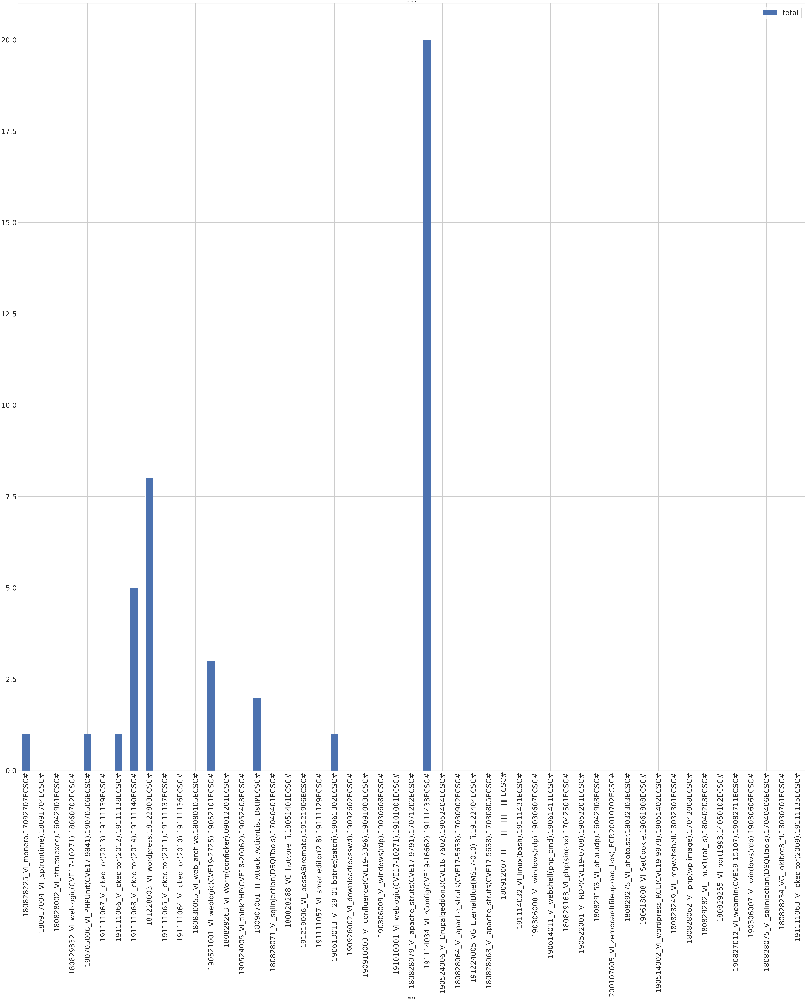

In [268]:
pd_scen_18_unique=pd_scen_18.loc[:,["POL_NM"]].drop_duplicates()
unique_sums=[]

for k in pd_scen_18_unique.values:
    unique_sums.append(pd_threat_2020.loc[pd_threat_2020['POL_NM']==k[0], 'TW_DETECT_CNT'].sum())
    
pd_scen_18_unique['total']=unique_sums
print(pd_scen_18_unique.head())

ax=pd_scen_18_unique.plot.bar(x='POL_NM',y='total', rot=90, figsize=(100,100),fontsize='50')
plt.legend(fontsize='50', loc='upper right')
ax.set_title("pd_scen_18")


# 요청건 
# 시나리오 탐지 현황 및 정탐률
# 2018년 시나리오 값과 시나리오가 탐지한 위협경보 탐지건수 출력함


# 시나리오 19년 데이터 불러오기

76005684
      TW_DETECT_CNT                                         SCEN_INFOS  \
0                 5  [{'POL_NM': '180829043_VI_coinminer.18033003EC...   
1                 1  [{'POL_NM': '180829043_VI_coinminer.18033003EC...   
2                 1  [{'POL_NM': '180829043_VI_coinminer.18033003EC...   
3                 1  [{'POL_NM': '180829043_VI_coinminer.18033003EC...   
4                 1  [{'POL_NM': '180829043_VI_coinminer.18033003EC...   
...             ...                                                ...   
9995              4  [{'POL_NM': '180829043_VI_coinminer.18033003EC...   
9996              4  [{'POL_NM': '180829043_VI_coinminer.18033003EC...   
9997              1  [{'POL_NM': '180829043_VI_coinminer.18033003EC...   
9998              1  [{'POL_NM': '180829043_VI_coinminer.18033003EC...   
9999              1  [{'POL_NM': '191111067_VI_ckeditor(2013).19111...   

                                         POL_NM  
0          180829043_VI_coinminer.18033003ECSC#  
1 

Text(0.5, 1.0, 'pd_scen_19')

/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 45236 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 48512 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 51452 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 50836 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 51221 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 48372 missing from current font.
  font.set_

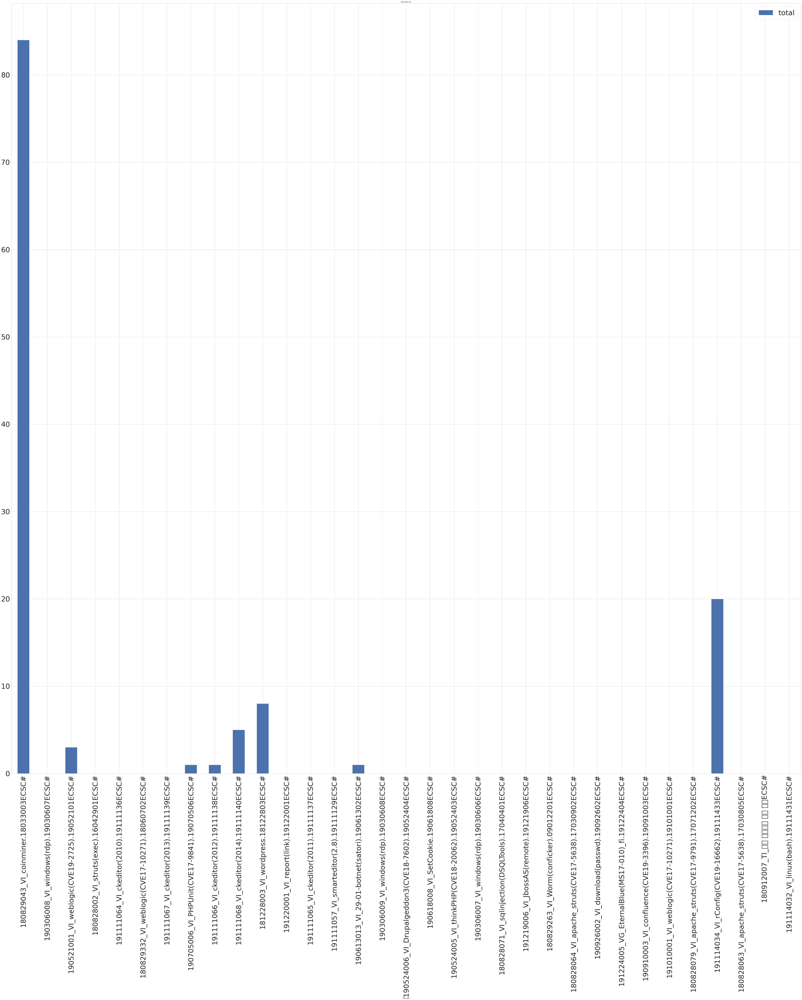

In [287]:
body={
    "size" : 10000,
    "_source":["SCEN_INFOS.POL_NM", "TW_DETECT_CNT"],
    "query": {
                'range':{
                    'SCEN_INFOS.POL_UPD_DT':{
                        "gte":"2019-01-01T00:00:00.625+09:00",
                        "lt":"2020-01-01T00:00:00.625+09:00"
                    }
                
                }
    }
#     ,
    
#      "sort":[{
#                 "_id":"asc"
#             }]
}
            

res = es.search(index = 'ts_data_threat-2020', body=body)
data_data_19_19_scen = res['hits']['hits']




total = res['hits']['total']

print(total)

scen_19 = []
for da in data_data_19_19_scen:
    att_type = da['_source']
    att_type["POL_NM"]=att_type["SCEN_INFOS"][0]["POL_NM"]
    scen_19.append(att_type)

# tot_len = len(res["hits"]["hits"])
# nxt = res["hits"]["hits"][-1]["sort"][0]

# while(tot_len != total):
#     body = {
#     "size" : 10000,
#     "_source":["SCEN_INFOS.POL_NM", "TW_DETECT_CNT"],
#         "search_after": [nxt],
#     "query": {
#                 'range':{
#                     'SCEN_INFOS.POL_UPD_DT':{
#                         "gte":"2019-01-01T00:00:00.625+09:00",
#                         "lt":"2020-01-01T00:00:00.625+09:00"
#                     }
#                 }
                
#     },
    
#      "sort":[{
#                 "_id":"asc"
#             }]
# }
    
#     res = es.search(index = 'ts_data_threat-2020', body=body)
#     data_data_19_19_scen = res['hits']['hits']

#     for da in data_data_19_19_scen:
#         att_type = da['_source']
#         att_type["POL_NM"]=att_type["SCEN_INFOS"][0]["POL_NM"]
#         scen_19.append(att_type)
        
#     tot_len += len(res["hits"]["hits"])
#     nxt = res["hits"]["hits"][-1]["sort"][0]
#     print(tot_len)
        
pd_scen_19 = pd.DataFrame.from_dict(scen_19)

print(pd_scen_19)

pd_scen_19_unique=pd_scen_19.loc[:,["POL_NM"]].drop_duplicates()
unique_sums=[]
for k in pd_scen_19_unique.values:
    unique_sums.append(pd_threat_2020.loc[pd_threat_2020['POL_NM']==k[0], 'TW_DETECT_CNT'].sum())
pd_scen_19_unique['total']=unique_sums

ax=pd_scen_19_unique.plot.bar(x='POL_NM',y='total', rot=90, figsize=(100,100),fontsize='50')
plt.legend(fontsize='50', loc='upper right')
ax.set_title("pd_scen_19")

# 요청건 
# 시나리오 탐지 현황 및 정탐률
# 2019년 시나리오 값과 시나리오가 탐지한 위협경보 탐지건수 출력함

# 시나리오 20년 데이터 불러오기

28270821
      TW_DETECT_CNT                                         SCEN_INFOS  \
0               2.0  [{'POL_NM': '200122002_VI_inet(ActiveMQ)_FCP.2...   
1               2.0  [{'POL_NM': '200122003_VI_inet(ActiveMQ)_FCP.2...   
2               2.0  [{'POL_NM': '200122003_VI_inet(ActiveMQ)_FCP.2...   
3               2.0  [{'POL_NM': '200122003_VI_inet(ActiveMQ)_FCP.2...   
4               2.0  [{'POL_NM': '200122003_VI_inet(ActiveMQ)_FCP.2...   
...             ...                                                ...   
9995            1.0  [{'POL_NM': '190705006_VI_PHPUnit(CVE17-9841)....   
9996            1.0  [{'POL_NM': '190705006_VI_PHPUnit(CVE17-9841)....   
9997            4.0  [{'POL_NM': '190705006_VI_PHPUnit(CVE17-9841)....   
9998            1.0  [{'POL_NM': '190705006_VI_PHPUnit(CVE17-9841)....   
9999            1.0  [{'POL_NM': '190705006_VI_PHPUnit(CVE17-9841)....   

                                              POL_NM  
0      200122002_VI_inet(ActiveMQ)_FCP.20012202

Text(0.5, 1.0, 'pd_scen_20')

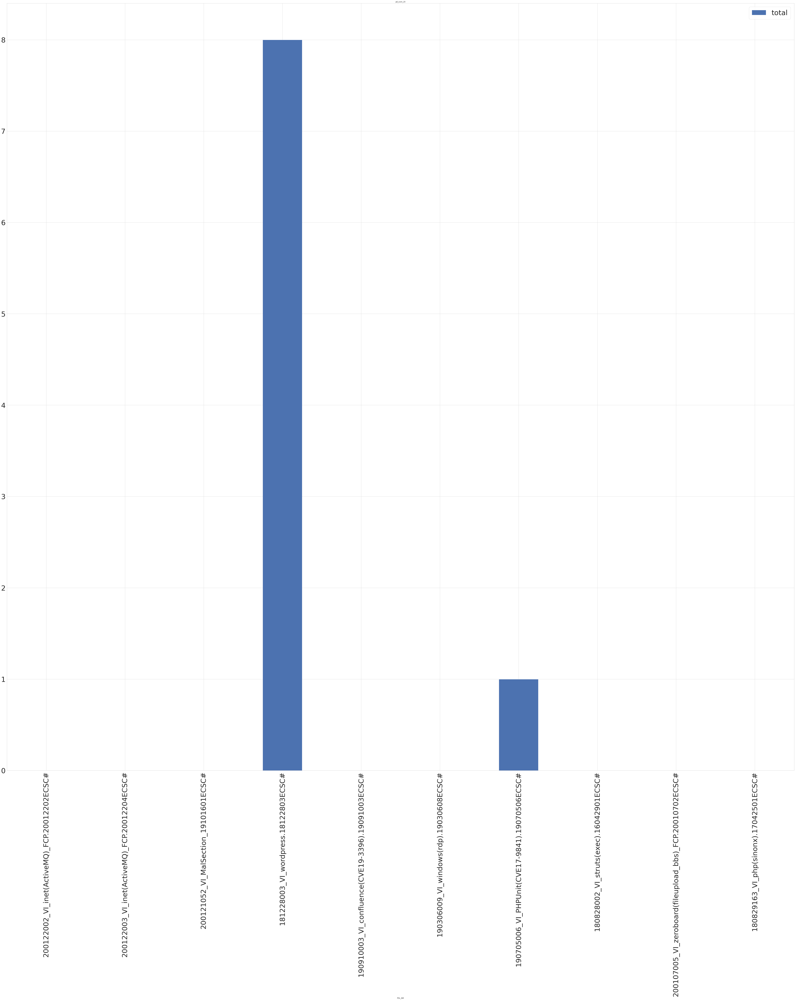

In [288]:
body={
    "size" : 10000,
    "_source":["SCEN_INFOS.POL_NM", "TW_DETECT_CNT"],
    "query": {
                'range':{
                    'SCEN_INFOS.POL_UPD_DT':{
                        "gte":"2020-01-01T00:00:00.625+09:00",
                        "lt":"2020-10-31T00:00:00.625+09:00"
                    }
                }
                
    }
#     ,
    
#      "sort":[{
#                 "_id":"asc"
#             }]
}
            

res = es.search(index = 'ts_data_threat-2020', body=body)
data_data_20_20_scen = res['hits']['hits']




total = res['hits']['total']

print(total)

scen_20 = []
for da in data_data_20_20_scen:
    att_type = da['_source']
    att_type["POL_NM"]=att_type["SCEN_INFOS"][0]["POL_NM"]
    scen_20.append(att_type)

# tot_len = len(res["hits"]["hits"])
# nxt = res["hits"]["hits"][-1]["sort"][0]

# while(tot_len != total):
#     body = {
#     "size" : 100,
#     "_source":["SCEN_INFOS.POL_NM", "TW_DETECT_CNT"],
#         "search_after": [nxt],
#     "query": {
#                 'range':{
#                     'SCEN_INFOS.POL_UPD_DT':{
#                         "gte":"2020-01-01T00:00:00.625+09:00",
#                         "lt":"2020-10-31T00:00:00.625+09:00"
#                     }
                
#                 }
#     },
    
#      "sort":[{
#                 "_id":"asc"
#             }]
# }
    
#     res = es.search(index = 'ts_data_threat-2020', body=body)
#     data_data_20_20_scen = res['hits']['hits']

#     for da in data_data_20_20_scen:
#         att_type = da['_source']
#         att_type["POL_NM"]=att_type["SCEN_INFOS"][0]["POL_NM"]
#         scen_20.append(att_type)
        
#     tot_len += len(res["hits"]["hits"])
#     nxt = res["hits"]["hits"][-1]["sort"][0]
#     print(tot_len)
        
pd_scen_20 = pd.DataFrame.from_dict(scen_20)

print(pd_scen_20)


pd_scen_20_unique=pd_scen_20.loc[:,["POL_NM"]].drop_duplicates()
unique_sums=[]
for k in pd_scen_20_unique.values:
    unique_sums.append(pd_threat_2020.loc[pd_threat_2020['POL_NM']==k[0], 'TW_DETECT_CNT'].sum())
pd_scen_20_unique['total']=unique_sums

ax=pd_scen_20_unique.plot.bar(x='POL_NM',y='total', rot=90, figsize=(100,100),fontsize='50')
plt.legend(fontsize='50', loc='upper right')
ax.set_title("pd_scen_20")

# 요청건 
# 시나리오 탐지 현황 및 정탐률
# 2020년 시나리오 값과 시나리오가 탐지한 위협경보 탐지건수 출력함